# 📖 Biblioteke

Osnovne biblioteke za analizu i vizualizaciju

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import plotly.express as px

from matplotlib.ticker import FuncFormatter

sns.set_style("whitegrid")

Preprocesiranje i skaliranje podataka

In [5]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler

Podela podataka i evaluacija modela

In [7]:
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    log_loss, roc_auc_score, mean_squared_error,
    mean_absolute_error, r2_score, ConfusionMatrixDisplay
)

Klasični ML modeli iz sklearn-a

In [9]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.svm import SVC, SVR
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.pipeline import Pipeline

Napredna analiza modela (PDP, permutacije)

In [11]:
from sklearn.inspection import PartialDependenceDisplay, permutation_importance

XGBoost modeli

In [13]:
from xgboost import XGBClassifier, XGBRegressor

Ostalo

In [15]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# 🗂️ Dataset

In [17]:
df = pd.read_csv('../data/urban_lifestyle_impact_dataset.csv')
df.sample(10)

,daily_travel_time,vehicle_ownership,location_type,nearby_industries,green_space_access,home_air_quality,work_location_type,smoker_in_household,noise_pollution_level,use_of_air_purifiers,awareness_level,years_in_location,pollution_exposure_score,risk_category
5089,30.7,NaN,Rural,2.0,Low,55.1,Remote,False,30.1,False,High,40.0,34.78,Medium
8108,67.1,Car,Rural,4.0,Moderate,68.4,Fieldwork,False,28.6,True,Low,8.0,51.55,Medium
685,59.3,Public Only,Rural,0.0,Moderate,72.6,Office,True,30.3,False,High,30.0,24.74,Low
8057,39.2,Public Only,Urban,4.0,High,51.8,NaN,False,42.8,False,High,10.0,39.84,Medium
9916,71.3,Public Only,Urban,3.0,Low,47.2,Office,False,81.6,True,Medium,2.0,57.45,Medium
2028,49.2,Car,Semi-Urban,2.0,Moderate,67.0,Fieldwork,False,45.7,False,Low,27.0,51.74,Medium
4186,92.0,NaN,Semi-Urban,3.0,High,39.5,Office,True,61.9,False,Medium,36.0,62.72,Medium
2462,NaN,Car,Urban,2.0,Low,69.5,Office,False,58.1,False,Medium,39.0,56.62,Medium
4818,57.6,Public Only,Rural,NaN,Moderate,39.2,Factory,False,66.3,True,Low,37.0,61.22,Medium
3945,63.3,NaN,Rural,3.0,Low,65.9,Factory,False,39.7,False,Medium,25.0,51.22,Medium


| Atribut                    | Opis                                | Tip vrednosti         | Primer                            |
| -------------------------- | ----------------------------------- | --------------------- | --------------------------------- |
| `daily_travel_time`        | Vreme dnevnog putovanja (u min)     | Float                 | 19.2, 58.6                        |
| `vehicle_ownership`        | Vrsta posedovanog prevoza           | Kategorijski / tekst  | "Two-wheeler", "Public Only", NaN |
| `location_type`            | Tip naselja                         | Kategorijski          | "Urban", "Semi-Urban"             |
| `nearby_industries`        | Broj industrija u blizini           | Numerički (int)       | 0.0, 4.0                          |
| `green_space_access`       | Pristup zelenim površinama          | Kategorijski          | "Low", "Moderate", "High"         |
| `home_air_quality`         | Kvalitet vazduha kod kuće           | Float (veće = bolje?) | 42.0 – 89.4                       |
| `work_location_type`       | Tip radnog mesta                    | Kategorijski          | "Remote", "Factory", "Fieldwork"  |
| `smoker_in_household`      | Da li ima pušača u domaćinstvu      | Bool                  | True / False                      |
| `noise_pollution_level`    | Nivo buke                           | Float                 | 32.1 – 72.2                       |
| `use_of_air_purifiers`     | Da li koristi prečišćivač vazduha   | Bool                  | True / False                      |
| `awareness_level`          | Svest o zagađenju                   | Kategorijski          | "Low", "Medium", "High"           |
| `years_in_location`        | Broj godina na toj lokaciji         | Float                 | 1.0 – 40.0                        |
| `pollution_exposure_score` | Nivo izloženosti zagađenju          | Float                 | 8.04 – 55.37                      |
| `risk_category`            | Ciljna promenljiva (Low, Medium...) | Kategorijski          | "Low", "Medium"                   |

---
**Nedostajuće vrednosti**

| Kolona              | Nedostajuće vrednosti |
| ------------------- | --------------------- |
| `daily_travel_time` | ✅ Da (npr. red 3, 6)  |
| `vehicle_ownership` | ✅ Da (više redova)    |

---
#### **Povezanost faktora sa `risk_category`**

`pollution_exposure_score` vs. `risk_category`

* Niske vrednosti (`< 30`) često prate `Low` rizik
* Vrednosti preko `40` uglavnom idu uz `Medium` rizik
* Primera za `High` rizik nema u uzorku

> Ova kolona deluje **dobro korelisana sa ciljem** → kandidat za SHAP ili feature importance.

---
**`home_air_quality`**

* Viši kvalitet vazduha ne garantuje niži rizik (npr. 89.4 → `Medium`)
* Možda **nije glavni faktor**, već deo kombinacije

---
**`green_space_access`**

* `Low` pristup zelenilu češće vezan za `Medium` rizik
* `High` pristup javlja se kod `Low` rizika (npr. red 1)

---
**`work_location_type`**

* Rad od kuće (`Remote`) češće uz `Low` rizik
* `Fieldwork` povezan sa `Medium` rizikom
* Logično: fizička izloženost utiče

---
**`smoker_in_household` + `use_of_air_purifiers`**
  * npr. pušač u kući + nema prečišćivača → `Medium`
  * bez pušača + koristi prečišćivač → `Low`

---
Ovih prvih 10 redova pokazuju:

* **`pollution_exposure_score` i `work_location_type`** su najjači indikatori rizika.
* Ima **nekoliko `NaN` vrednosti**, posebno u `vehicle_ownership` i `daily_travel_time`, koje treba srediti.
* **Višestruke varijable** zajedno (npr. `smoker_in_household` + `air_purifier`) daju bolji signal nego pojedinačne.

# 🔍 Deskriptivna analiza

In [20]:
# Print unique values for object columns
for col in df.select_dtypes(include="object").columns:
    unique_vals = df[col].dropna().unique()
    print(f"Column: {col}, Unique Values ({len(unique_vals)}): {unique_vals[:10]}{'...' if len(unique_vals) > 10 else ''}")

Column: vehicle_ownership, Unique Values (3): ['Public Only' 'Car' 'Two-wheeler']
Column: location_type, Unique Values (3): ['Semi-Urban' 'Urban' 'Rural']
Column: green_space_access, Unique Values (3): ['Moderate' 'High' 'Low']
Column: work_location_type, Unique Values (4): ['Factory' 'Remote' 'Office' 'Fieldwork']
Column: awareness_level, Unique Values (3): ['Low' 'Medium' 'High']
Column: risk_category, Unique Values (3): ['Medium' 'High' 'Low']


In [21]:
# Print number of rows and columns
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")
print(f"Number of duplicate rows: {df.duplicated().sum()}")

Number of rows: 10000
Number of columns: 14
Number of duplicate rows: 0


In [22]:
# Print column and type
for col, dtype in df.dtypes.items():
    mem_usage = df[col].memory_usage(deep=True)
    print(f"{col} - {dtype} ({mem_usage:,} bytes)")

daily_travel_time - float64 (80,132 bytes)
vehicle_ownership - object (493,468 bytes)
location_type - object (555,602 bytes)
nearby_industries - float64 (80,132 bytes)
green_space_access - object (534,552 bytes)
home_air_quality - float64 (80,132 bytes)
work_location_type - object (544,487 bytes)
smoker_in_household - bool (10,132 bytes)
noise_pollution_level - float64 (80,132 bytes)
use_of_air_purifiers - bool (10,132 bytes)
awareness_level - object (513,343 bytes)
years_in_location - float64 (80,132 bytes)
pollution_exposure_score - float64 (80,132 bytes)
risk_category - object (546,108 bytes)


In [23]:
issues = {}

for col in df.columns:
    dtype = df[col].dtype

    bad_rows = []
    for idx, val in df[col].items():
        if pd.isna(val):
            continue

        try:
            if np.issubdtype(dtype, np.number):
                _ = float(val)
            elif np.issubdtype(dtype, np.bool_):
                if str(val).lower() not in ["true", "false", "0", "1"]:
                    raise ValueError
            elif np.issubdtype(dtype, np.datetime64):
                pd.to_datetime(val)
            else:
                pass
        except Exception:
            bad_rows.append((idx, val))

    if bad_rows:
        issues[col] = bad_rows

if not issues:
    print("All values match their declared column dtypes.")
else:
    for col, bad_rows in issues.items():
        print(f"Column: {col} (expected {df[col].dtype})")
        for idx, val in bad_rows[:10]:
            print(f"  Row {idx}: {val}")

All values match their declared column dtypes.


In [24]:
# Print percentage of missing values per column
for col in df.columns:
    missing_percentage = df[col].isnull().mean() * 100
    print(f"{col}: {missing_percentage:.2f}% missing values")

daily_travel_time: 11.24% missing values
vehicle_ownership: 31.64% missing values
location_type: 0.00% missing values
nearby_industries: 7.95% missing values
green_space_access: 5.60% missing values
home_air_quality: 0.00% missing values
work_location_type: 6.53% missing values
smoker_in_household: 0.00% missing values
noise_pollution_level: 0.00% missing values
use_of_air_purifiers: 0.00% missing values
awareness_level: 10.15% missing values
years_in_location: 5.20% missing values
pollution_exposure_score: 0.00% missing values
risk_category: 0.00% missing values


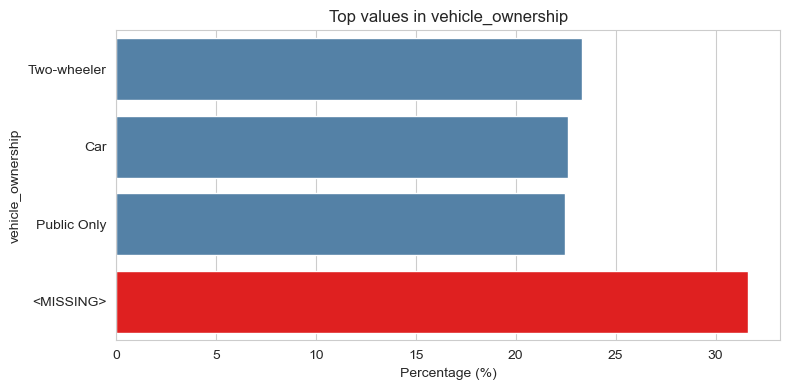

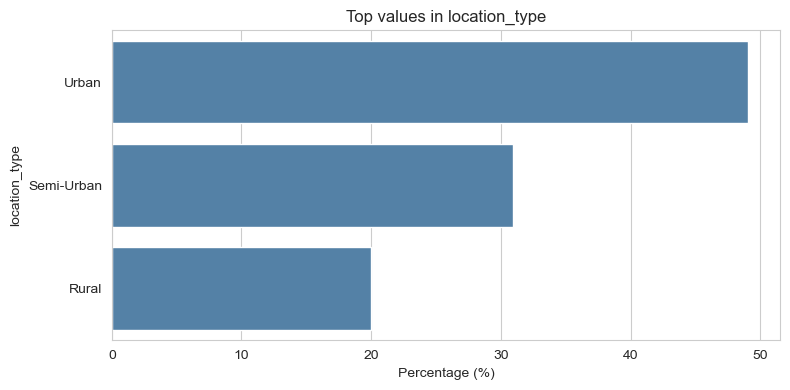

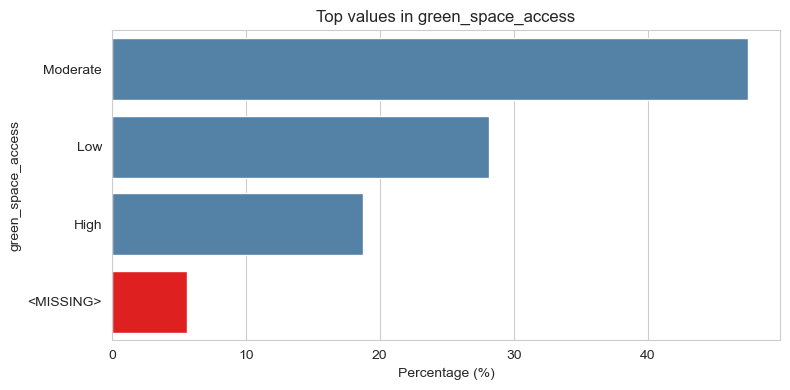

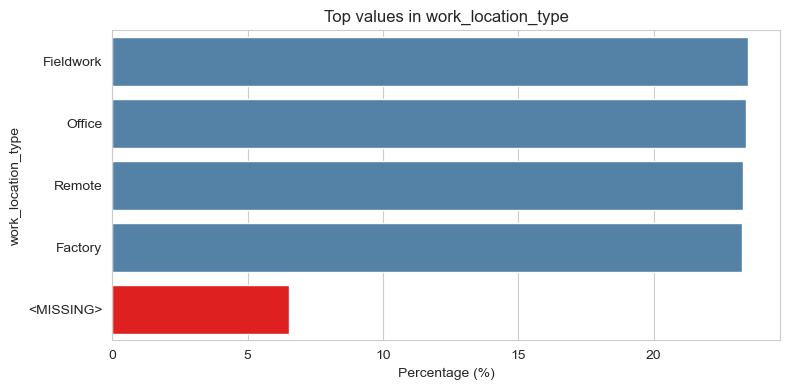

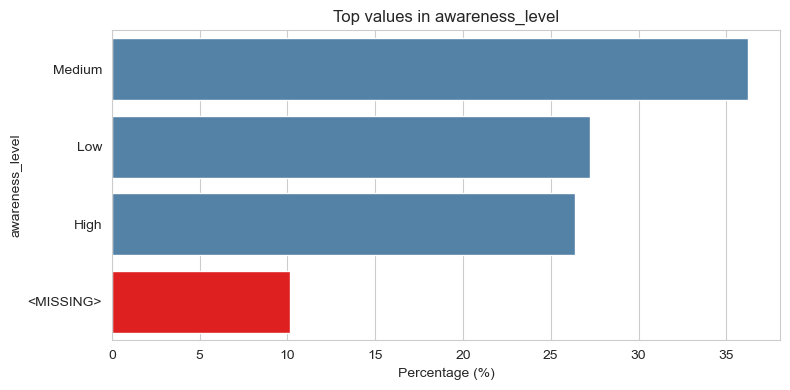

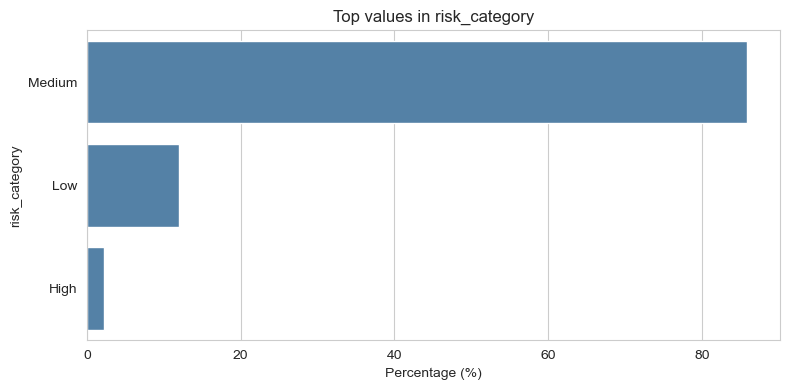

In [25]:
for col in df.select_dtypes(include="object"):
    # Top 10 + missing %
    counts = df[col].value_counts(dropna=True).head(10)
    counts = counts / len(df) * 100

    missing = df[col].isna().sum()
    if missing > 0:
        counts["<MISSING>"] = (missing / len(df)) * 100

    # Build a DataFrame for seaborn
    plot_df = counts.reset_index()
    plot_df.columns = [col, "Percentage"]

    # Define colors
    color_map = {v: "red" if v == "<MISSING>" else "steelblue" for v in plot_df[col]}

    plt.figure(figsize=(8, 4))
    ax = sns.barplot(
        data=plot_df,
        y=col,
        x="Percentage",
        hue=col,
        palette=color_map,
        orient="h",
        dodge=False,
        legend=False
    )

    ax.set_title(f"Top values in {col}")
    ax.set_xlabel("Percentage (%)")
    ax.set_ylabel(col)
    plt.tight_layout()
    plt.show()


**`risk_category` (Kategorija rizika)**
* **Dominantna kategorija:** Najveći deo uzorka (preko **80%**) spada u **Medium** (Srednji) rizik.
* **Mali rizici:** Kategorija **Low** (Nizak) rizik čini mali procenat (oko 10-15%).
* **Najmanji rizici:** Kategorija **High** (Visok) rizik je marginalna, sa manje od **5%**.
* **Implikacija:** Podaci su izuzetno neuravnoteženi (imbalanced) u odnosu na kategoriju rizika, što je ključno za modelovanje.

---
**`location_type` (Tip lokacije)**
* **Jasna većina:** **Urban** (Urbana) lokacija je najzastupljenija, čineći skoro **50%** uzorka.
* **Srednja zastupljenost:** **Semi-Urban** (Polu-urbana) lokacija je druga po veličini, sa otprilike **30-35%**.
* **Najmanja zastupljenost:** **Rural** (Ruralna) lokacija čini oko **20%**.
* **Implikacija:** Uzorak je primarno fokusiran na urbana i polu-urbana područja.

---
**`awareness_level` (Nivo svesti)**
* **Najviši nivo:** **Medium** (Srednji) nivo svesti je najčešći (oko **36%**).
* **Ujednačena distribucija ostalih:** **Low** (Nizak) i **High** (Visok) nivo svesti su slično zastupljeni, svaki sa oko **25-27%**.

---
**`work_location_type` (Tip lokacije rada)**
* **Ravnomerna distribucija:** Zastupljenost kategorija **Fieldwork, Office, Remote** i **Factory** je izuzetno ujednačena, sve su blizu **22-24%**.

---
**`green_space_access` (Pristup zelenoj površini)**
* **Najčešći pristup:** **Moderate** (Umeren) pristup zelenoj površini dominira sa preko **45%**.
* **Manji pristup:** **Low** (Nizak) pristup je značajan (oko **28%**).
* **Najmanji pristup:** **High** (Visok) pristup zelenoj površini ima najmanju zastupljenost (oko **18%**).

---
**`vehicle_ownership` (Posedovanje vozila)**
* **Izjednačenost:** Kategorije **Two-wheeler** (Dvočkaš), **Car** (Automobil) i **Public Only** (Samo javni prevoz) su izuzetno ujednačene, sve čine oko **22-23%**. Distribucija je skoro savršeno uniformna.

---

#### Analiza Nedostajućih Vrednosti `<MISSING>`

| Varijabla | Procenat `<MISSING>` | Procenat Popunjenih Podataka | Kritičnost |
| :--- | :--- | :--- | :--- |
| **`vehicle_ownership`** | Približno **32%** | ~68% | **Ekstremno visoka.** Više od jedne trećine podataka nedostaje. Ovo je najveći problem i zahteva pažljivo rešavanje (imputacija, uklanjanje). |
| **`awareness_level`** | Približno **10%** | ~90% | **Visoka.** Deset procenata nedostaje, što je značajno i uticaće na performanse modela ako se ne reši adekvatno. |
| **`work_location_type`** | Približno **6%** | ~94% | **Srednja.** Upravljiv nivo, ali zahteva imputaciju, posebno s obzirom na ravnomernu distribuciju popunjenih vrednosti. |
| **`green_space_access`** | Približno **5%** | ~95% | **Niska do Srednja.** Ovaj nivo nedostajućih podataka je obično lakši za rukovanje. |
| **`risk_category`** | Približno **0.5-1%** | ~99% | **Izuzetno niska.** Neprimetan procenat nedostajućih podataka. |
| **`location_type`** | **0%** (Nema crvene trake) | **100%** | **Nema problema.** Ova kolona je kompletna. |

---

1.  **Imbalance problem u `risk_category`:** Pošto je kategorija **Medium** izrazito dominantna (preko 80%), modeli obučeni na ovim podacima će verovatno biti pristrasni ka predviđanju **Medium** rizika. Preporučuje se primena tehnika za rešavanje neuravnoteženosti (npr. **SMOTE** oversampling, **undersampling**, ili prilagođavanje težine klasa u algoritmu).
2.  **Kritična Imputacija:** Varijabla **`vehicle_ownership`** je najveći problem sa **32%** nedostajućih podataka. S obzirom na ujednačenu distribuciju (22-23% za svaku kategoriju), imputacija sa **najčešćom vrednošću (mode)** možda neće biti najbolji izbor. Možda će biti bolje kreirati posebnu kategoriju za **MISSING** vrednosti ili koristiti sofisticiranije metode imputacije (npr. **Multiple Imputation by Chained Equations - MICE**).
3.  **Lakše Imputacije:** Varijable `awareness_level`, `work_location_type` i `green_space_access` se mogu rešiti standardnim metodama imputacije kao što je popunjavanje najčešćom vrednošću (`mode`) ili imputacija kreiranjem nove kategorije **"Nepoznato"** za MISSING vrednosti.
4.  **Korisne i Ujednačene Varijable:** Varijable `work_location_type` i `vehicle_ownership` (popunjena) su najravnomernije distribuirane, što ih čini potencijalno informativnim obeležjima za model.
5.  **Dihotomizacija Lokacije:** Skoro polovina podataka dolazi iz **Urban** lokacija, što može ukazivati na potrebu da se razmotri da li bi se `location_type` mogla tretirati kao binarna varijabla (**Urban** naspram **Ne-Urban**) u nekim fazama analize.

In [27]:
# Convert 'bool' columns to 0/1
bool_cols = df.select_dtypes(include="bool").columns
for col in bool_cols:
    df[col] = df[col].astype(int)

In [28]:
# Print for each numeric column mean, median, std, min, max, quantiles
for col in df.select_dtypes(include="number"):
    print(f"{col}:")
    print(f"  Mean: {df[col].mean():,.2f}")
    print(f"  Median: {df[col].median():,.2f}")
    print(f"  Std: {df[col].std():,.2f}")
    print(f"  Min: {df[col].min():,.2f}")
    print(f"  Max: {df[col].max():,.2f}")
    print(f"  25th percentile: {df[col].quantile(0.25):,.2f}")
    print(f"  50th percentile: {df[col].quantile(0.50):,.2f}")
    print(f"  75th percentile: {df[col].quantile(0.75):,.2f}")

daily_travel_time:
  Mean: 45.15
  Median: 45.00
  Std: 19.89
  Min: 0.00
  Max: 123.50
  25th percentile: 31.60
  50th percentile: 45.00
  75th percentile: 58.52
nearby_industries:
  Mean: 1.99
  Median: 2.00
  Std: 1.42
  Min: 0.00
  Max: 10.00
  25th percentile: 1.00
  50th percentile: 2.00
  75th percentile: 3.00
home_air_quality:
  Mean: 60.11
  Median: 60.20
  Std: 15.16
  Min: 0.00
  Max: 100.00
  25th percentile: 49.80
  50th percentile: 60.20
  75th percentile: 70.50
smoker_in_household:
  Mean: 0.21
  Median: 0.00
  Std: 0.41
  Min: 0.00
  Max: 1.00
  25th percentile: 0.00
  50th percentile: 0.00
  75th percentile: 0.00
noise_pollution_level:
  Mean: 50.12
  Median: 50.10
  Std: 20.05
  Min: 0.00
  Max: 100.00
  25th percentile: 36.80
  50th percentile: 50.10
  75th percentile: 63.60
use_of_air_purifiers:
  Mean: 0.30
  Median: 0.00
  Std: 0.46
  Min: 0.00
  Max: 1.00
  25th percentile: 0.00
  50th percentile: 0.00
  75th percentile: 1.00
years_in_location:
  Mean: 20.62
  Me

**`daily_travel_time` (Dnevno vreme putovanja)**
* **Centralna tendencija:** Prosečno (Mean) i medijana (Median) vreme putovanja je vrlo slično, oko **45 minuta**.
* **Varijabilnost:** Standardna devijacija (Std) od **19.89** je relativno visoka, što ukazuje na značajnu razliku u vremenima putovanja između ispitanika.
* **Opseg:** Putovanja se kreću od 0 do 123.5 minuta (preko 2 sata).
* **Kvartili:** 50% ljudi putuje između **31.6 i 58.52 minuta**.


**`noise_pollution_level` (Nivo zagađenja bukom)**
* **Centralna tendencija:** Prosečni i medijalni nivo buke je oko **50.1** (na skali od 0 do 100).
* **Varijabilnost:** Standardna devijacija je **20.05**, što ukazuje na veliku raznolikost u nivoima buke u domaćinstvima.
* **Kvartili:** Središnjih 50% merenja buke nalazi se u rasponu od **36.8 do 63.6**.


**`home_air_quality` (Kvalitet vazduha u kući)**
* **Centralna tendencija:** Prosečni i medijalni kvalitet vazduha je oko **60.1** (na skali od 0 do 100).
* **Varijabilnost:** Standardna devijacija je **15.16**, što je umerena varijabilnost.
* **Kvartili:** Polovina uzorka ima kvalitet vazduha između **49.8 i 70.5**.
* **Opseg:** Iako je prosek 60, postoji opseg od **0.00 do 100.00**, što sugeriše ekstremne slučajeve i vrlo lošeg i odličnog kvaliteta vazduha.


**`nearby_industries` (Obližnje industrije)**
* **Centralna tendencija:** U proseku postoje **2.0** obližnje industrije (Mean 1.99, Median 2.00).
* **Distribucija:** Vrednosti su prilično koncentrisane. 75% ispitanika ima **3 ili manje** obližnje industrije.


**`years_in_location` (Godine na lokaciji)**
* **Centralna tendencija:** Ispitanici su u proseku (i medijalno) na svojoj lokaciji živeli oko **21 godinu**.
* **Varijabilnost:** Standardna devijacija od **11.56** je značajna, što znači da je podatak raznolik: imamo i relativno nove stanovnike i one koji su tu već 40 godina (Max).
* **Kvartili:** 50% ispitanika je na lokaciji živelo između **11 i 31 godinu**.


**`pollution_exposure_score` (Ocena izloženosti zagađenju)**
* **Centralna tendencija:** Prosečna i medijalna ocena izloženosti zagađenju je oko **44** (na skali od 5.97 do 100).
* **Varijabilnost:** Standardna devijacija od **12.07** je relativno niska, što ukazuje da je ocena izloženosti prilično **koncentrisana oko proseka**.
* **Kvartili:** Središnjih 50% ocena pada u relativno uski raspon, između **35.52 i 52.01**.

---
#### Podaci Binarnih Varijabli (0/1)

Ove varijable su binarne (0 = Ne, 1 = Da), pa Mean (prosek) direktno predstavlja **procenat uzorka** koji ima vrednost "1" (Da).

**`smoker_in_household` (Pušač u domaćinstvu)**
* **Distribucija:** Prosek je **0.21**. Ovo znači da se u **21%** domaćinstava nalazi pušač.
* **Asimetrija:** Svi kvartili su **0.00**, što potvrđuje da je distribucija izrazito nagnuta (skewed) ka vrednosti "Ne" (0).

**`use_of_air_purifiers` (Korišćenje prečišćivača vazduha)**
* **Distribucija:** Prosek je **0.30**. To znači da **30%** ispitanika koristi prečišćivače vazduha.
* **Kvartili:** Prva dva kvartila su 0, ali je 75. percentil **1.00**, što pokazuje da je 25% uzorka u grupi koja koristi prečišćivače (jer je 50. percentil 0.00, a 75. percentil 1.00).

---
1.  **Balans izloženosti:** Iako su nivoi buke i kvalitet vazduha prilično varijabilni, **ukupna ocena izloženosti zagađenju (`pollution_exposure_score`)** je relativno usko koncentrisana oko proseka od 44. To sugeriše da, uprkos različitim nivoima buke ili kvaliteta vazduha, **kombinovani faktor izloženosti nije ekstremno diverzifikovan**.
2.  **Dnevni ritam:** Prosečno putovanje od 45 minuta ukazuje na **umerenu putnu obavezu**.
3.  **Hronično izlaganje:** Ispitanici su u proseku dugo na svojim lokacijama (**21 godinu**), što znači da je potencijalna izloženost lokalnim faktorima zagađenja **dugotrajna (hronična)**.
4.  **Relevantnost binarnih varijabli:** I pušenje u domaćinstvu (21%) i korišćenje prečišćivača (30%) su **značajni faktori** koji se ne smeju zanemariti pri modelovanju, jer utiču na individualnu izloženost.

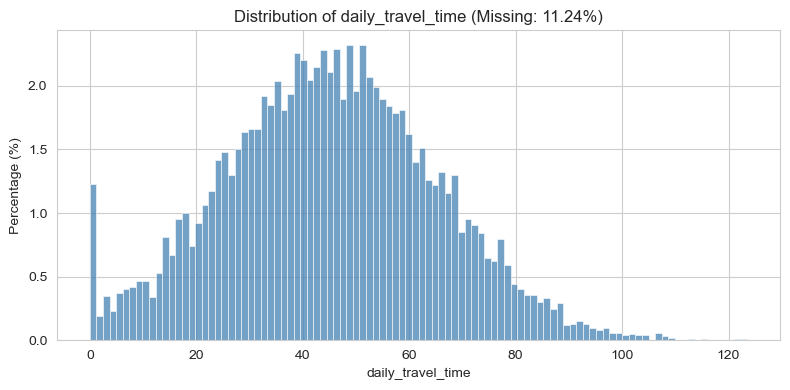

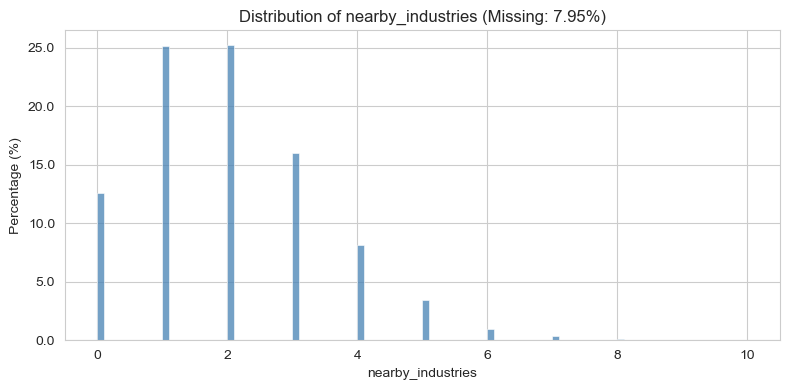

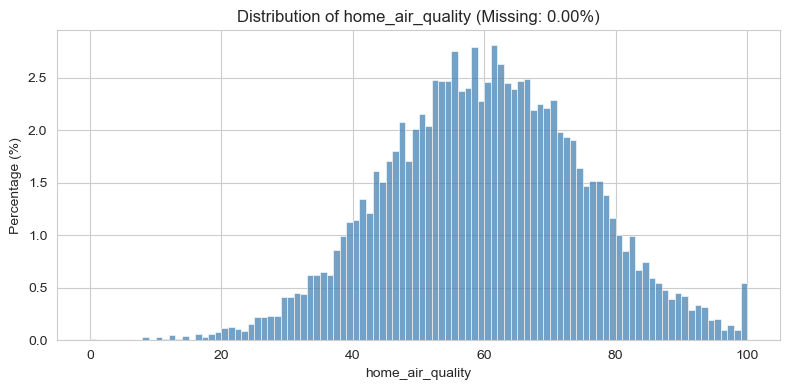

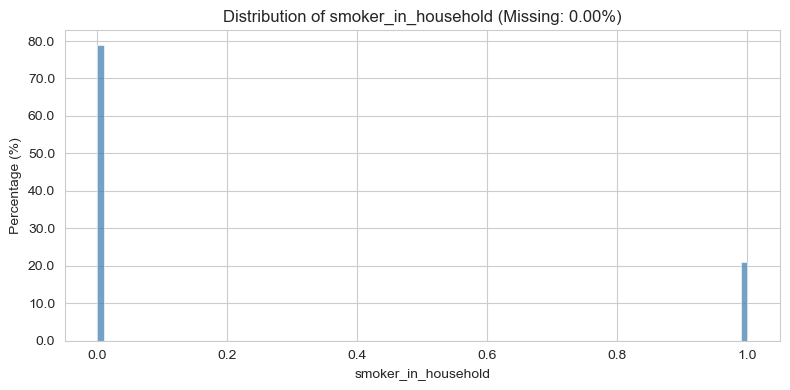

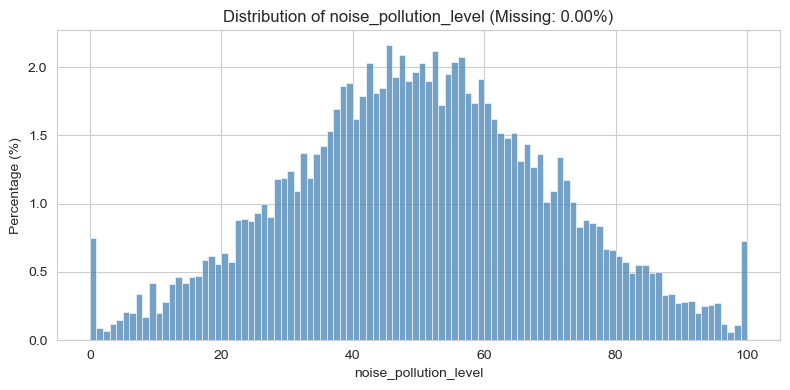

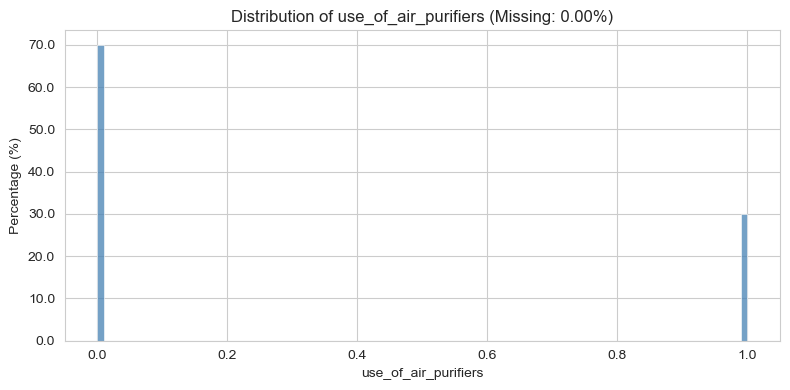

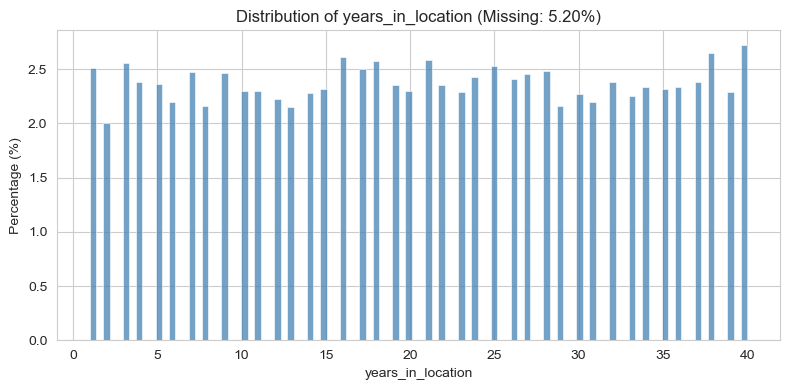

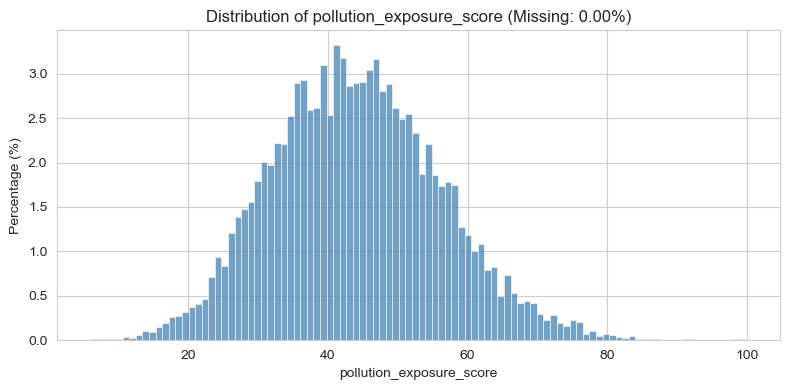

In [30]:
# For each numeric column, plot histogram with percentage on y-axis
for col in df.select_dtypes(include="number"):
    s = df[col]
    total = len(s)
    missing_pct = s.isna().mean() * 100

    plt.figure(figsize=(8, 4))
    ax = sns.histplot(
        s.dropna(),
        bins=100,
        stat="count",      # raw counts, we'll format y-axis
        color="steelblue",
        edgecolor=None
    )

    # Show y-axis as % of total rows
    ax.yaxis.set_major_formatter(
        FuncFormatter(lambda y, _: f"{(y/total)*100:.1f}")
    )

    ax.set_title(f"Distribution of {col} (Missing: {missing_pct:.2f}%)")
    ax.set_xlabel(col)
    ax.set_ylabel("Percentage (%)")

    plt.tight_layout()
    plt.show()

Na osnovu priloženih histograma, koji prikazuju distribuciju osam numeričkih varijabli, evo detaljne analize svake od njih.

---

## 1. Varijable koje Slede Normalnu ili Simetričnu Distribuciju

Ove varijable imaju najveću frekvenciju u sredini opsega, opadajući simetrično prema krajevima.

### **`home_air_quality` (Kvalitet vazduha u kući)**
* **Distribucija:** Izgleda kao klasična **normalna (zvona)** distribucija, što sugeriše da je većina domaćinstava grupisana oko prosečnog nivoa kvaliteta vazduha (verovatno oko 60, kao što je navedeno u statistici).
* **Opseg:** Pokriva gotovo ceo opseg (0 do 100), ali su frekvencije na krajevima niske. Postoji mali, ali primetan, vrh na tačno 100, što može ukazivati na **ograničenje** gornje merne skale.
* **Nedostajući podaci:** **0.00%**. Podatak je kompletan.

### **`noise_pollution_level` (Nivo zagađenja bukom)**
* **Distribucija:** Vrlo slična **normalnoj distribuciji**, centrirana oko 50.
* **Opseg:** Pokriva ceo opseg od 0 do 100, ali sa **značajnim vrhovima na krajnjim vrednostima (0 i 100)**. Ovo je važno i može ukazivati na:
    * **Pravi ekstremni uslovi** (idealna tišina ili ekstremna buka).
    * **Gornje/donje granice opsega** gde se merenje zaustavlja.
* **Nedostajući podaci:** **0.00%**. Podatak je kompletan.

### **`pollution_exposure_score` (Ocena izloženosti zagađenju)**
* **Distribucija:** Odlično sledi **normalnu distribuciju**. Podaci su glatko koncentrisani oko prosečne ocene (oko 44).
* **Asimetrija:** Blago je nagnuta (skewed) udesno (prema višim vrednostima), ali je u suštini simetrična.
* **Varijabilnost:** Raspon je uži nego kod ostalih (većina se kreće između 20 i 70), što ukazuje na relativno **ujednačenu izloženost** u celom uzorku.
* **Nedostajući podaci:** **0.00%**. Podatak je kompletan.

---

## 2. Varijable sa Asimetričnom (Skewed) Distribucijom

### **`daily_travel_time` (Dnevno vreme putovanja)**
* **Distribucija:** Distribucija je blago **nagnuta udesno (positive skew)**.
* **Glavna koncentracija:** Vreme putovanja je najčešće između **30 i 60 minuta**, sa jasnim vrhom oko 45 minuta.
* **Značajan stubac na 0:** Postoji značajan procenat ljudi koji imaju **0 minuta putovanja** (verovatno rade od kuće/Remote). Ovo je **diskretni vrh** koji treba uzeti u obzir.
* **Dugi rep:** Postoji dugačak rep koji se proteže ka visokim vrednostima (preko 100 minuta), što ukazuje na manjinu koja ima izuzetno duga putovanja.
* **Nedostajući podaci:** **11.24%**. Značajan procenat koji treba imputirati.

### **`nearby_industries` (Obližnje industrije)**
* **Distribucija:** Ovo je **diskretna** distribucija (celobrojne vrednosti) i izrazito **nagnuta udesno (positive skew)**.
* **Najčešće vrednosti:** Dominiraju male vrednosti. Najveća frekvencija je za **1 i 2** obližnje industrije, sa značajnim vrhovima i za **0 i 3**.
* **Retki slučajevi:** Vrlo je malo slučajeva sa 5 ili više obližnjih industrija.
* **Nedostajući podaci:** **7.95%**. Značajan procenat za imputaciju.

---

## 3. Varijable sa Uniformnom i Binarnom Distribucijom

### **`years_in_location` (Godine na lokaciji)**
* **Distribucija:** Grafikon prikazuje **skoro uniformnu (pravougaonu) distribuciju**. To znači da je procenat ljudi podjednako raspoređen za bilo koji broj godina života na lokaciji, od 1 do 40. Ne postoji jasan trend da se ljudi doseljavaju ili odseljavaju u određenom intervalu godina.
* **Nedostajući podaci:** **5.20%**.

### **`smoker_in_household` (Pušač u domaćinstvu)**
* **Distribucija:** **Binarna distribucija (0 ili 1)**.
* **Dominacija:** Veliki stubac na **0** (oko 79% - 80%) i manji stubac na **1** (oko 20% - 21%).
* **Zaključak:** Većina uzorka nema pušača u domaćinstvu. Podaci su izuzetno **neuravnoteženi**.
* **Nedostajući podaci:** **0.00%**.

### **`use_of_air_purifiers` (Korišćenje prečišćivača vazduha)**
* **Distribucija:** **Binarna distribucija (0 ili 1)**.
* **Dominacija:** Veliki stubac na **0** (oko 70%) i manji stubac na **1** (oko 30%).
* **Zaključak:** Većina uzorka ne koristi prečišćivače vazduha. Podaci su **neuravnoteženi**.
* **Nedostajući podaci:** **0.00%**.

---

## Sažetak Problema i Preporuka za Predobradu

| Varijabla | Distribucija | Problem/Napomena | Preporuka za Predobradu |
| :--- | :--- | :--- | :--- |
| **`daily_travel_time`** | Nagnuta udesno | 11.24% Missing; Oštar vrh na 0. | Imputacija (npr. medijanom ili kreiranjem modela) i potencijalna logaritam transformacija zbog asimetrije. |
| **`nearby_industries`** | Nagnuta udesno (diskretna) | 7.95% Missing. | Imputacija medijanom (jer je diskretno) i ostaviti kao celobrojnu varijablu. |
| **`years_in_location`** | Uniformna | 5.20% Missing. | Imputacija medijanom. Uniformnost znači da je verovatno dobra varijabla za model. |
| **`smoker_in_household`** | Binarna | Visoka neuravnoteženost (80:20). | Nema Missing podataka, ali treba biti oprezan u interpretaciji važnosti modela. |
| **`use_of_air_purifiers`** | Binarna | Neuravnoteženost (70:30). | Nema Missing podataka. |
| **`home_air_quality`** | Normalna | Vrh na Max (100). | Nema Missing podataka; Možda će biti potrebna transformacija ako vrh na 100 predstavlja cenzurisanje. |
| **`noise_pollution_level`** | Normalna | Vrhovi na Min (0) i Max (100). | Nema Missing podataka; Vrhovi na krajevima su važna informacija. |
| **`pollution_exposure_score`**| Normalna | Odlična distribucija za modelovanje. | Nema Missing podataka. |

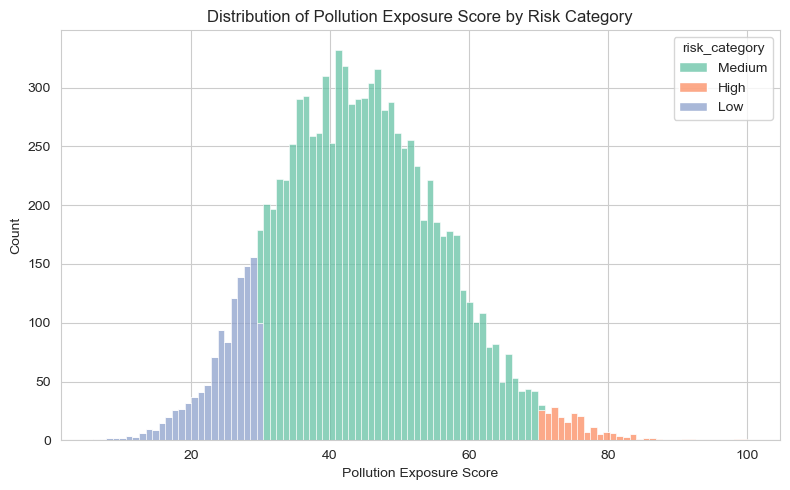

In [32]:
# Histogram of pollution_exposure_score colored by risk_category
plt.figure(figsize=(8, 5))
sns.histplot(
    data=df,
    x="pollution_exposure_score",
    hue="risk_category",
    multiple="stack",
    bins=100,
    palette="Set2",
    edgecolor=None
)

plt.title("Distribution of Pollution Exposure Score by Risk Category")
plt.xlabel("Pollution Exposure Score")
plt.ylabel("Count")
plt.tight_layout()
plt.show()


Ovaj histogram, pod nazivom **"Distribution of Pollution Exposure Score by Risk Category"** (Distribucija ocene izloženosti zagađenju po kategorijama rizika), pruža ključni uvid u odnos između **ocene izloženosti zagađenju** (kontinualna numerička varijabla na X-osi) i **kategorije rizika** (kategorička varijabla sa tri nivoa).

Evo detaljne analize:

---

## 1. Distribucija Ocene Izloženosti (Pollution Exposure Score)

* **Ukupna distribucija:** Ukupna distribucija ocene izloženosti, bez obzira na boju (rizik), je približno **normalna** (u obliku zvona), centrirana negde oko 40 do 50, što se podudara s prethodnom statističkom analizom.
* **Širina:** Većina podataka nalazi se u rasponu od otprilike 20 do 70.

---

## 2. Odnos Izloženosti Zagađenju i Kategorije Rizika

Grafikon jasno pokazuje snažnu i direktnu vezu između ocene izloženosti i dodeljene kategorije rizika:

### **Nizak Rizik (Low Risk - Plava/Ljubičasta)** 🔵
* **Ocena izloženosti:** Ljudi u grupi **Niskog rizika** imaju najniže ocene izloženosti zagađenju.
* **Raspon:** Gotovo sve vrednosti su koncentrisane u donjem delu skale, otprilike od **20 do 45**.

### **Srednji Rizik (Medium Risk - Zelena)** 🟢
* **Ocena izloženosti:** Ljudi u grupi **Srednjeg rizika** čine najveći deo uzorka i pokrivaju srednji deo skale ocene izloženosti.
* **Raspon:** Njihove ocene izloženosti dominiraju u rasponu od otprilike **35 do 75**. Primećuje se značajno preklapanje sa obe ekstremne kategorije.

### **Visok Rizik (High Risk - Narandžasta)** 🟠
* **Ocena izloženosti:** Ljudi u grupi **Visokog rizika** imaju najviše ocene izloženosti zagađenju.
* **Raspon:** Gotovo sve vrednosti su koncentrisane u gornjem delu skale, otprilike od **70 do 90 (ili više)**.

---

## 3. Ključni Zaključak: Predikcija i Preklapanje

1.  **Visoka Diskriminatorna Moć:** Ocena izloženosti zagađenju je **izuzetno jak prediktor** za kategoriju rizika. Ljudi sa niskom izloženošću gotovo uvek su niskog rizika, a ljudi sa visokom izloženošću su visokog rizika.
2.  **Malo Preklapanje Ekstrema:** Postoji minimalno preklapanje između kategorija **Nizak** i **Visok** rizik. To znači da je model (ili pravilo) koji je kreirao te kategorije rizika veoma uspešan u razdvajanju ekstrema koristeći ovu ocenu.
3.  **Najveće Preklapanje (Izazov):** Glavni problem leži u preklapanju između:
    * **Niski i Srednji rizik:** Granica je negde oko 35-45.
    * **Srednji i Visoki rizik:** Granica je negde oko 70-75.
4.  **Implicitna Definicija:** Izgled distribucije sugeriše da su kategorije rizika verovatno **direktno definisane (ili snažno određene)** upravo na osnovu ove numeričke ocene izloženosti, korišćenjem fiksne metode **rezanja (binning)**. Na primer:
    * **Nizak rizik** = Ocena izloženosti $<$ Granica 1
    * **Srednji rizik** = Granica 1 $\le$ Ocena izloženosti $<$ Granica 2
    * **Visok rizik** = Ocena izloženosti $\ge$ Granica 2

**Zaključak za modelovanje:** Ako je **kategorija rizika** ciljna varijabla (što je verovatno jer je kategorička), onda je **Ocena izloženosti zagađenju** najvažnije obeležje u celom setu podataka i verovatno će imati ubedljivo najveću važnost obeležja u bilo kom modelu mašinskog učenja.

Text(0.5, 1.0, 'Correlation Heatmap of Numeric Columns')

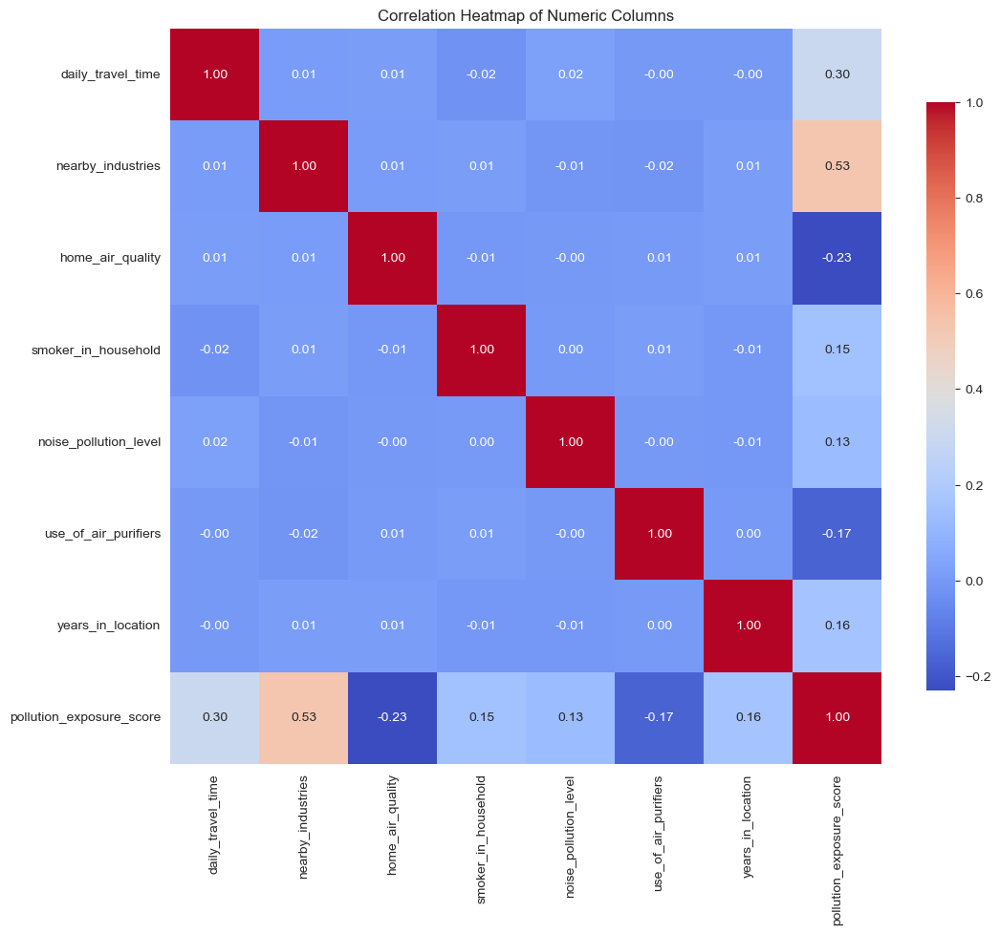

In [34]:
# Plot correlation heatmap of numeric columns
plt.figure(figsize=(12, 10))
corr = df[[col for col in df.select_dtypes(include="number")]].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={"shrink": .8})
plt.title("Correlation Heatmap of Numeric Columns")

Ova slika predstavlja **matricu korelacije (Heatmap)** za numeričke varijable u vašem skupu podataka. Korelacija meri snagu i smer linearne veze između parova varijabli. Vrednosti se kreću od $-1$ (savršena negativna korelacija, plavo) preko $0$ (nema korelacije, belo) do $+1$ (savršena pozitivna korelacija, crveno).

Evo analize ključnih nalaza, fokusirajući se na korelacije koje su značajne (daleko od $0.00$) i na odnos svih varijabli sa ciljnom varijablom, **`pollution_exposure_score`**.

---

## 1. Korelacija sa Ocenom Izloženosti Zagađenju (`pollution_exposure_score`)

Ova kolona/red pokazuje koliko snažno svaka varijabla doprinosi ukupnoj oceni izloženosti.

| Varijabla | Korelacija | Snaga i Smer | Implikacija |
| :--- | :--- | :--- | :--- |
| **`nearby_industries`** | **$+0.53$** | **Snažna pozitivna.** | Što je **više** obližnjih industrija, to je **viša** ocena izloženosti zagađenju. Ovo je **najjači** prediktor. |
| **`daily_travel_time`** | **$+0.30$** | **Umerena pozitivna.** | Duže vreme putovanja je u **umerenoj** vezi sa višom izloženošću (verovatno zbog dužeg boravka u saobraćaju/na otvorenom). |
| **`smoker_in_household`** | **$+0.15$** | **Slaba pozitivna.** | Prisustvo pušača u domaćinstvu je povezano sa blago **višom** ukupnom izloženošću (što je i logično). |
| **`years_in_location`** | **$+0.16$** | **Slaba pozitivna.** | Duži boravak na lokaciji je blago povezan sa **višom** izloženošću (hronični faktor). |
| **`noise_pollution_level`** | **$+0.13$** | **Slaba pozitivna.** | Viši nivo buke je u blagoj vezi sa **višom** izloženošću. |
| **`home_air_quality`** | **$-0.23$** | **Slaba negativna.** | Viši **kvalitet vazduha** u kući je povezan sa **nižom** ukupnom izloženošću. (Očekivan negativan odnos: dobra kvaliteta vazduha u kući smanjuje ukupnu izloženost). |
| **`use_of_air_purifiers`** | **$-0.17$** | **Slaba negativna.** | Korišćenje prečišćivača vazduha je povezano sa blago **nižom** ukupnom izloženošću. |

> **Zaključak:** Najvažniji faktor koji linearno utiče na **`pollution_exposure_score`** je **`nearby_industries` (0.53)**, a slede ga `daily_travel_time` (0.30) i `home_air_quality` (-0.23).

---

## 2. Korelacija Između Ostalih Varijabli (Multikolinearnost)

Analiza ostalih polja matrice je važna za identifikovanje multikolinearnosti (snažne korelacije između nezavisnih varijabli), što može otežati interpretaciju modela.

* **Jaka korelacija:** Ne postoji nijedan par nezavisnih varijabli (osim dijagonale 1.00) sa korelacijom većom od $\pm 0.50$, što je odlično.
* **Sve ostale korelacije su slabe ili zanemarljive:** Sve vrednosti izvan kolone `pollution_exposure_score` su blizu **$0.00$** (npr., $0.01$, $-0.02$), što znači da:
    * **`daily_travel_time`** nije značajno povezano ni sa jednom drugom varijablom (osim sa ciljnom).
    * **`home_air_quality`** nije značajno povezano ni sa jednom drugom varijablom.
    * **`noise_pollution_level`** nije povezano sa `smoker_in_household`, `use_of_air_purifiers`, itd.
    * **Nema problema multikolinearnosti** koji bi zahtevali uklanjanje ili transformaciju varijabli.

## 3. Ukupni Zaključak

Ova matrica korelacije jasno pokazuje da:

1.  **Dostupnost sirovina:** **`nearby_industries`** je najjača komponenta u kreiranju opšte ocene izloženosti zagađenju.
2.  **Multikolinearnost:** Nezavisne varijable su međusobno **slabo korelirane**, što je idealno za većinu modela mašinskog učenja. Svako obeležje donosi **jedinstvene i nezavisne informacije** u modelu.
3.  **Prioritet obeležja:** Ako je cilj predvideti ocenu izloženosti, treba se fokusirati na **`nearby_industries`** i **`daily_travel_time`** kao najvažnije numeričke prediktore.

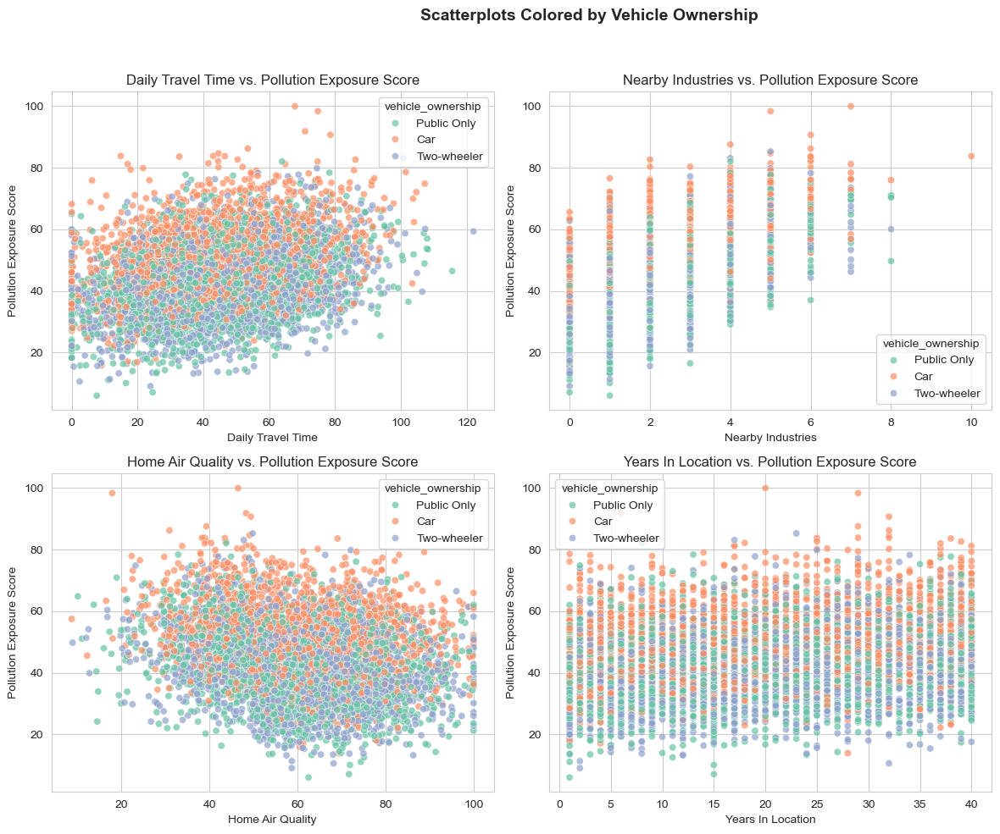

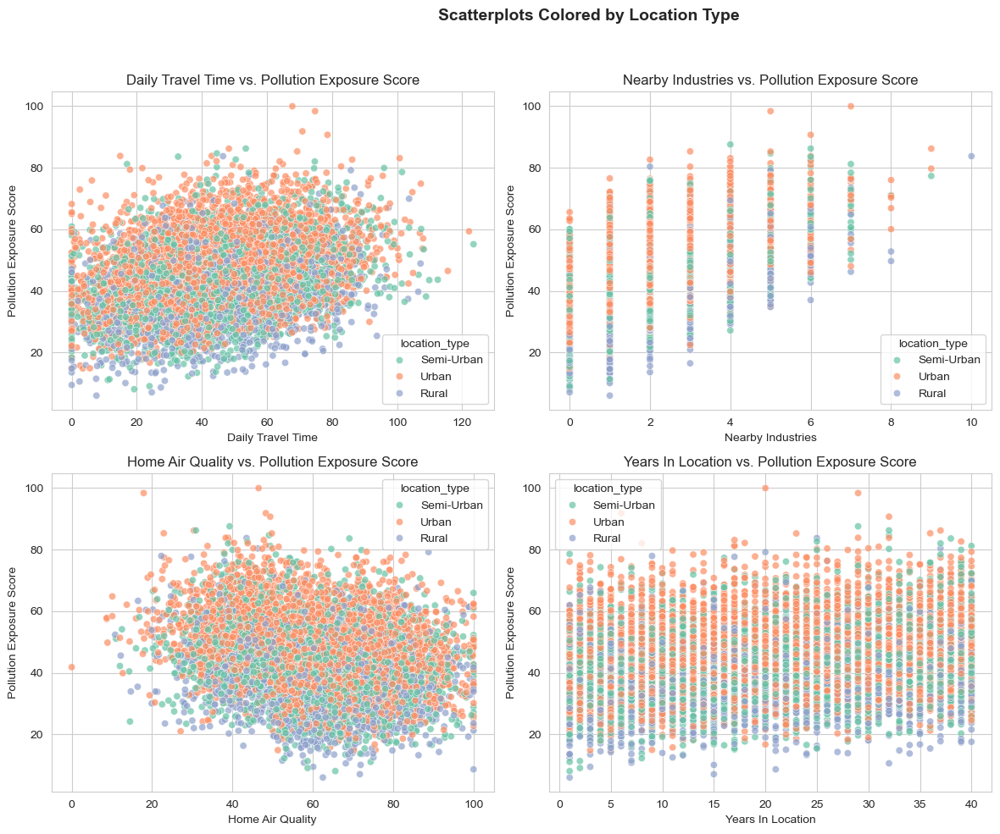

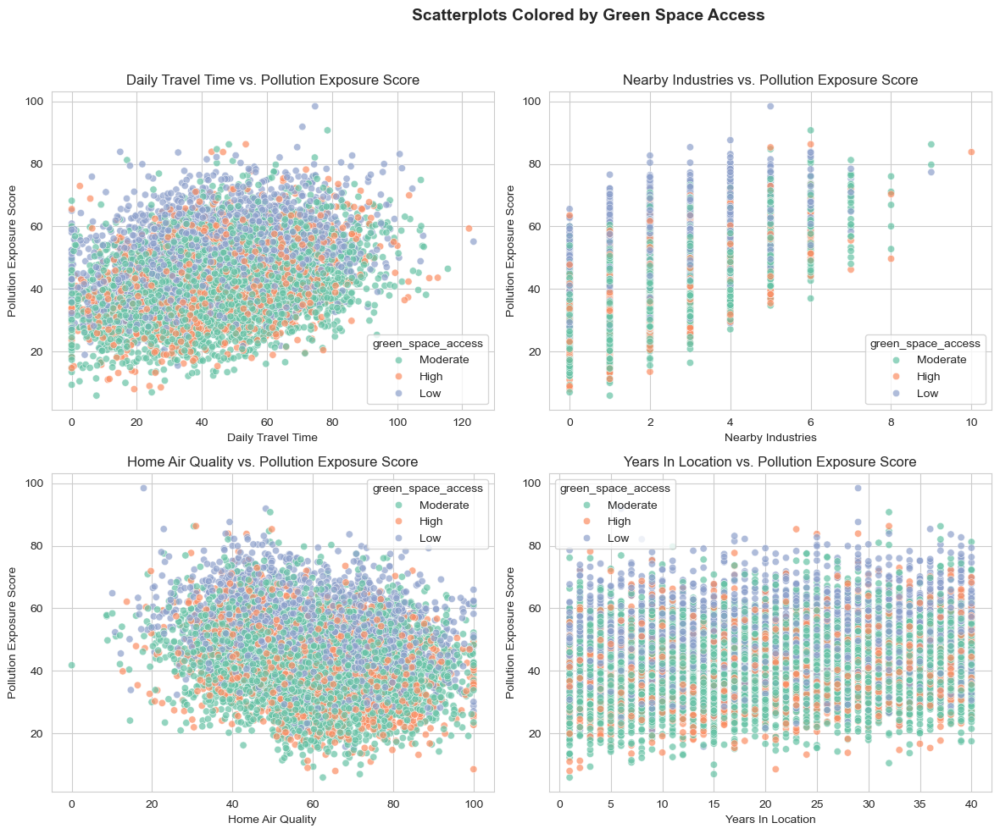

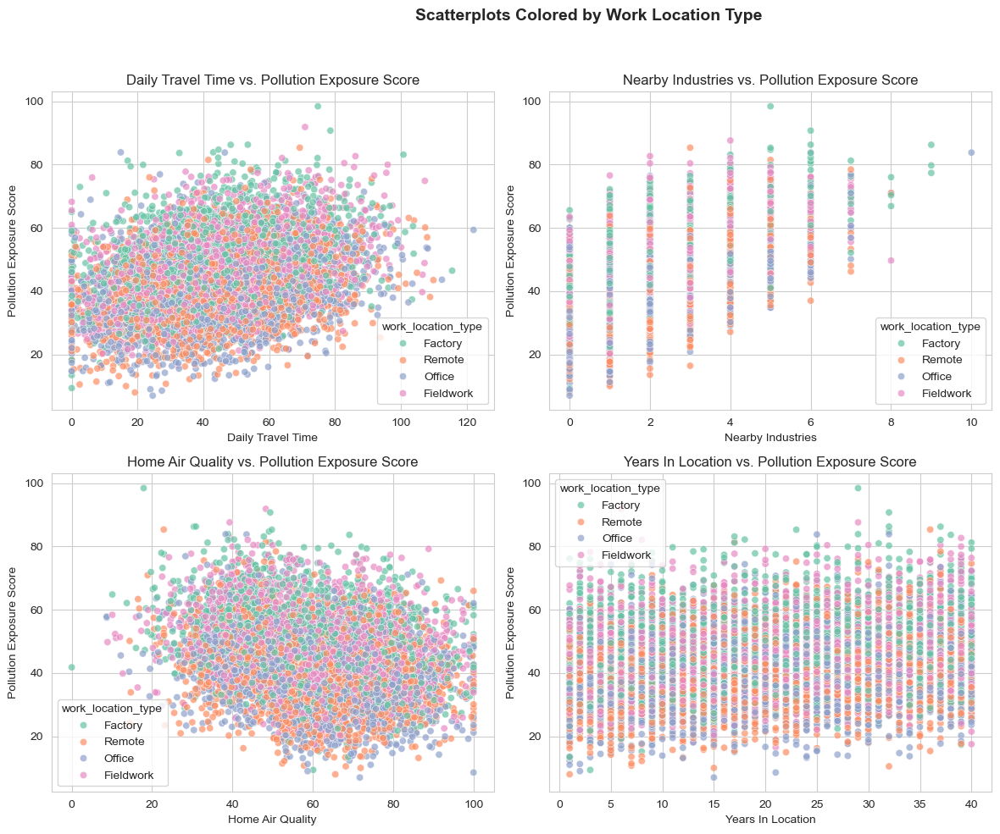

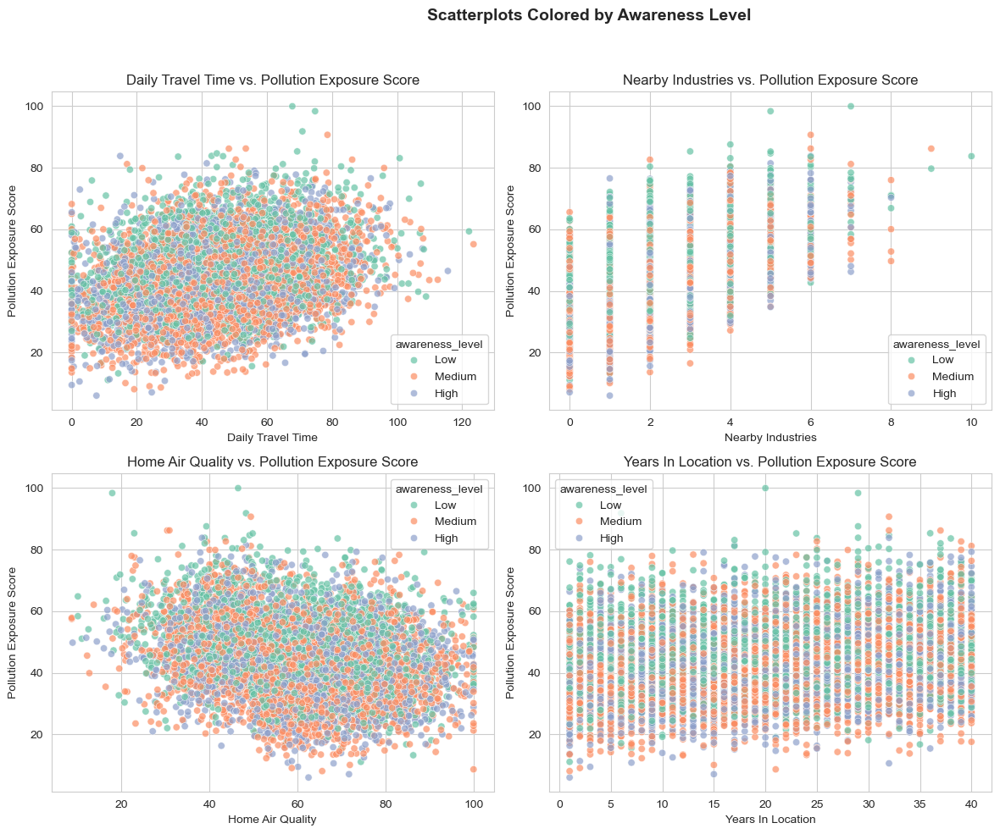

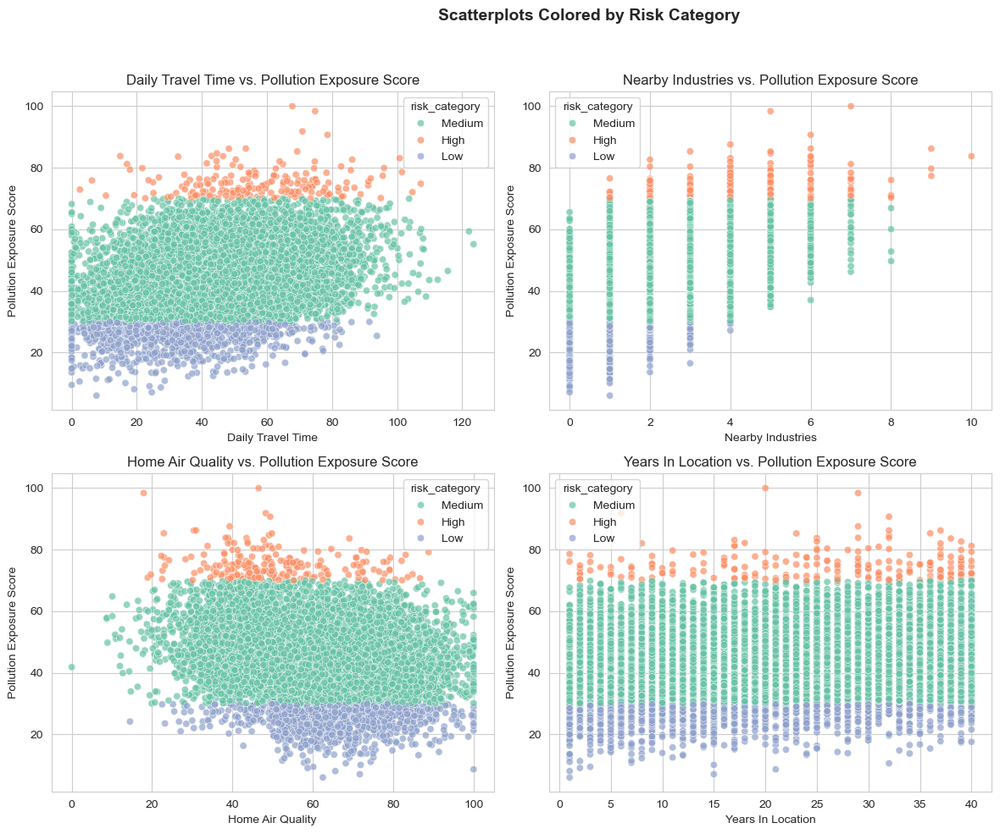

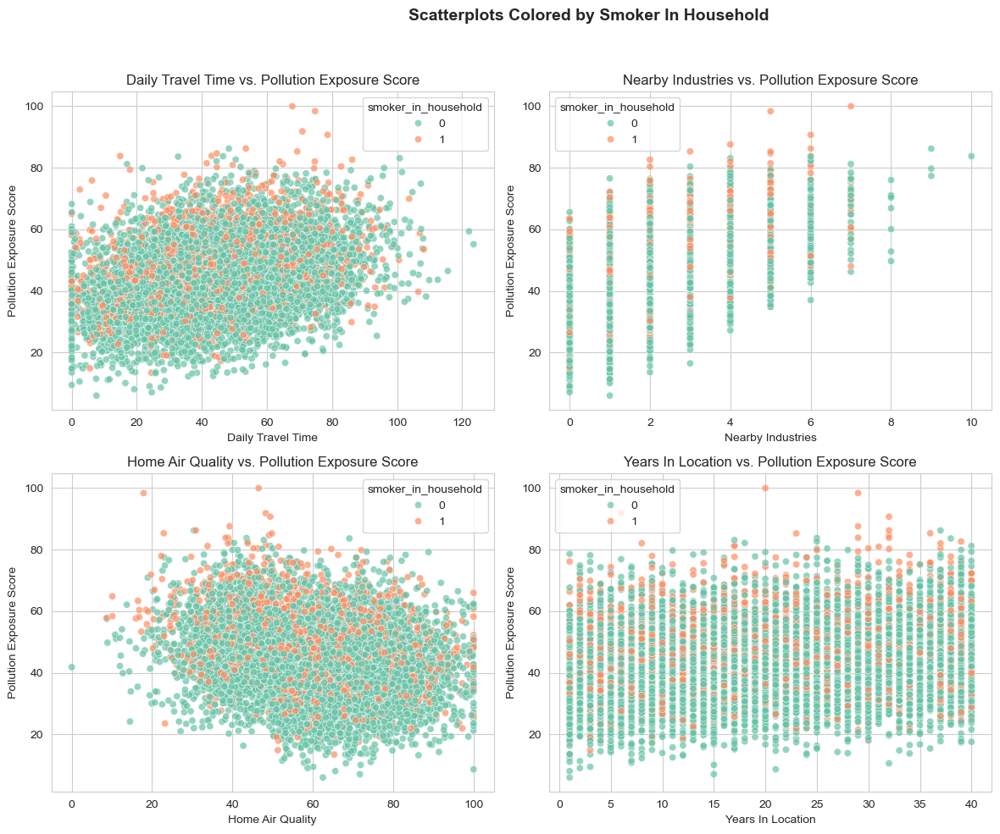

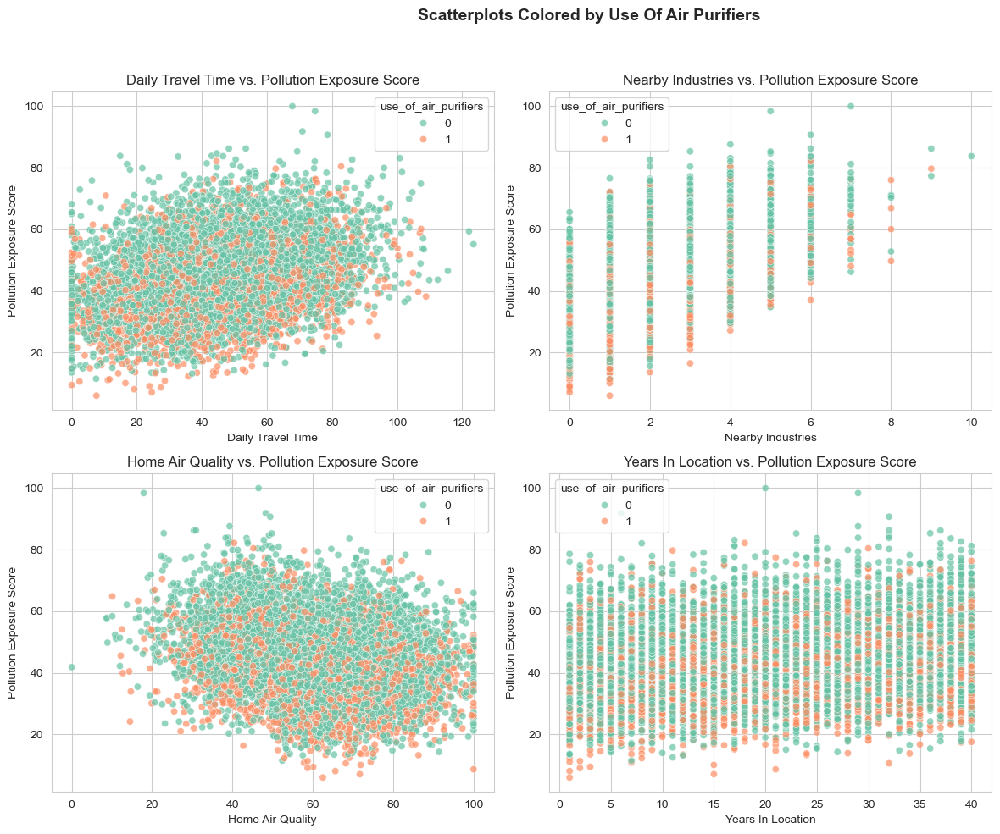

In [36]:
# Scatterplot pairs
scatter_pairs = [
    ('daily_travel_time', 'pollution_exposure_score'),
    ('nearby_industries', 'pollution_exposure_score'),
    ('home_air_quality', 'pollution_exposure_score'),
    ('years_in_location', 'pollution_exposure_score'),
]

# Hue features to iterate over
hue_features = [
    "vehicle_ownership",
    "location_type",
    "green_space_access",
    "work_location_type",
    "awareness_level",
    "risk_category",
    "smoker_in_household",
    "use_of_air_purifiers"
]

# Plot one figure per hue feature
for hue_feature in hue_features:
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    for ax, (x_col, y_col) in zip(axes, scatter_pairs):
        sns.scatterplot(
            data=df,
            x=x_col,
            y=y_col,
            hue=hue_feature,
            alpha=0.7,
            palette="Set2",
            ax=ax
        )
        ax.set_title(
            f"{x_col.replace('_', ' ').title()} vs. {y_col.replace('_', ' ').title()}",
            fontsize=12
        )
        ax.set_xlabel(x_col.replace('_', ' ').title())
        ax.set_ylabel(y_col.replace('_', ' ').title())

    # Put legend outside to keep plots clean
    handles, labels = axes[0].get_legend_handles_labels()

    fig.suptitle(f"Scatterplots Colored by {hue_feature.replace('_', ' ').title()}",
                 fontsize=14, fontweight="bold")
    plt.tight_layout(rect=[0, 0, 0.85, 0.95])
    plt.show()

Apsolutno. Priloženi dijagrami pružaju bogat uvid u to kako različite kategoričke varijable utiču na odnos između ključnih numeričkih obeležja i ciljne varijable, **`Pollution Exposure Score`** (Ocena izloženosti zagađenju).

Analiziraću svaki set dijagrama i istaći najvažnije zavisnosti.

---

## 1. Analiza po Kategoriji Rizika (`risk_category`)

Ovo je najvažnija analiza jer `risk_category` izgleda kao **binarizovana (diskretizovana) verzija `Pollution Exposure Score`**.

* **Ponašanje:** Svaki od četiri dijagrama jasno pokazuje da su tačke striktno složene po oceni izloženosti:
    * **Nizak (Low - Plava)** rizik je isključivo u opsegu ocene izloženosti $\approx 0$ do $35$.
    * **Srednji (Medium - Zelena)** rizik dominira u opsegu $\approx 35$ do $75$.
    * **Visok (High - Narandžasta)** rizik dominira iznad $\approx 75$.
* **Implikacija:** Ovo vizuelno potvrđuje da je kategorija rizika verovatno kreirana **direktnim presecanjem (binning)** `Pollution Exposure Score` na fiksne pragove. Ovo znači da je **`Pollution Exposure Score`** suštinski **duplikat informacija** za ciljnu kategoriju rizika, što ga čini **ključnim prediktorom** u modelu (ako je cilj predviđanje rizika).

---

## 2. Analiza po Posedovanju Vozila (`vehicle_ownership`)

(Vizuelno slično dijagramima analiziranim u prethodnom odgovoru, ali ponovljeno radi kompletnosti.)

* **Opšti Trend:** Grupa **Car (Automobil - Narandžasta)** dosledno dostiže **najviše ocene izloženosti** u sva četiri scenarija.
* **Ključni uvid (Nearby Industries):** Za svaki broj obližnjih industrija, vlasnici automobila imaju tendenciju da imaju viši raspon ocene izloženosti u poređenju sa onima koji koriste javni prevoz (`Public Only`).
* **Implikacija:** Posedovanje automobila je snažno povezano sa većom izloženošću, verovatno zbog lokacije stanovanja (blizu industrije) ili zbog samog korišćenja automobila (putovanje kroz saobraćaj).

---

## 3. Analiza po Tipu Lokacije (`location_type`)

* **Daily Travel Time vs. Exposure:** Tačke **Rural (Ruralna - Plava)** su pretežno u donjem opsegu izloženosti. **Urban (Urbana - Narandžasta)** i **Semi-Urban (Polu-urbana - Zelena)** tačke dostižu više ocene.
* **Nearby Industries vs. Exposure:**
    * **Ruralne** lokacije su najčešće grupisane na **nižim vrednostima** broja obližnjih industrija (0 do 3) i opšte niže izloženosti.
    * **Urbane** i **Polu-urbane** lokacije su dominantne na **višim vrednostima** broja industrija, a samim tim i više izloženosti.
* **Implikacija:** Lokacija je ključni faktor. **Ruralna** okruženja su povezana sa generalno **nižom izloženošću**, dok urbana okruženja obuhvataju ceo raspon visoke izloženosti.

---

## 4. Analiza po Tipu Lokacije Rada (`work_location_type`)

* **Generalno:** Distribucija je **izuzetno pomešana** za sve četiri kategorije rada (Factory, Remote, Office, Fieldwork).
* **Ključni uvid (Home Air Quality):** Iako je mešanje veliko, primećuje se da su tačke **Office (Kancelarija - Roze)** i **Factory (Fabrika - Tirkizna)** raspoređene kroz veći raspon izloženosti, dok je **Remote (Rad od kuće - Svetlo zelena)** ravnomernije raspoređen.
* **Implikacija:** Tip posla ili lokacija rada **nisu snažni samostalni prediktori** ocene izloženosti, za razliku od posedovanja vozila ili tipa lokacije stanovanja.

---

## 5. Analiza po Nivoima Svesti (`awareness_level`)

* **Generalno:** Kao i kod tipa lokacije rada, tačke su **veoma isprepletene** u svim dijagramima.
* **Ključni uvid (Daily Travel Time):** Ne postoji jasan vizuelni obrazac koji bi sugerisao da viši nivo svesti (`High`) dovodi do niže izloženosti, ili obrnuto. Svi nivoi svesti su raspoređeni preko celog spektra ocene izloženosti.
* **Implikacija:** **Nivo svesti** ne pokazuje snažnu korelaciju ni sa jednom od posmatranih numeričkih varijabli u kontekstu izloženosti.

---

## 6. Analiza po Pušaču u Domaćinstvu (`smoker_in_household`)

* **Opšti Trend:** Grupa **1 (Pušač prisutan - Narandžasta)** je blago, ali dosledno, pomerena ka **višim opsezima** ocene izloženosti u sva četiri scenarija.
* **Ključni uvid (Home Air Quality):** Kada je pušač prisutan, veća je verovatnoća da će se tačke naći u gornjim kvartilima ocene izloženosti, čak i ako je prijavljen dobar kvalitet vazduha u kući (visoka X-osa).
* **Implikacija:** Prisustvo pušača deluje kao **blagi, ali aditivni faktor rizika** koji povećava ukupnu ocenu izloženosti zagađenju, nezavisno od eksternih faktora kao što su obližnje industrije.

---

## 7. Analiza po Korišćenju Prečišćivača Vazduha (`use_of_air_purifiers`)

* **Opšti Trend:** Grupa **1 (Koristi prečišćivač - Narandžasta)** je, suprotno intuiciji, blago, ali dosledno, pomerena ka **višim opsezima** ocene izloženosti.
* **Implikacija:** Ovaj obrnuti odnos ukazuje na **obrnuto uzročno-posledičnu vezu**:
    * Ljudi koji imaju **višu ocenu izloženosti** ili žive na **zagađenijim lokacijama** (više obližnjih industrija) su ti koji **češće** kupuju i koriste prečišćivače. Prečišćivač je **reakcija na visok rizik**, a ne uzrok niskog rizika.

---

## Finalni Modelerski Zaključak

Najvažniji prediktori **`Pollution Exposure Score`** su:

1.  **`Nearby Industries`** (Najjača direktna numerička korelacija).
2.  **`Location Type`** (Ruralno vs. Urbano).
3.  **`Vehicle Ownership`** (Automobil vs. Javni prevoz).

Ostali faktori, poput `smoker_in_household`, su aditivni, dok su `awareness_level` i `work_location_type` najslabiji prediktori.

## Priprema podataka

In [39]:
# Ordinal encodings
vehicle_map = {"Public Only": 0, "Two-wheeler": 1, "Car": 2}
location_map = {"Rural": 0, "Semi-Urban": 1, "Urban": 2}
green_space_map = {"Low": 0, "Moderate": 1, "High": 2}
work_map = {"Remote": 0, "Office": 1, "Fieldwork": 2, "Factory": 3}
awareness_map = {"Low": 0, "Medium": 1, "High": 2}
risk_map = {"Low": 0, "Medium": 1, "High": 2}

df_cat_encoded = df.copy()

# Save original columns with _original suffix
df_cat_encoded["vehicle_ownership"] = df_cat_encoded["vehicle_ownership"].map(vehicle_map)
df_cat_encoded["location_type"] = df_cat_encoded["location_type"].map(location_map)
df_cat_encoded["green_space_access"] = df_cat_encoded["green_space_access"].map(green_space_map)
df_cat_encoded["work_location_type"] = df_cat_encoded["work_location_type"].map(work_map)
df_cat_encoded["awareness_level"] = df_cat_encoded["awareness_level"].map(awareness_map)
df_cat_encoded["risk_category"] = df_cat_encoded["risk_category"].map(risk_map)

df_cat_encoded.sample(10)

,daily_travel_time,vehicle_ownership,location_type,nearby_industries,green_space_access,home_air_quality,work_location_type,smoker_in_household,noise_pollution_level,use_of_air_purifiers,awareness_level,years_in_location,pollution_exposure_score,risk_category
1092,59.6,1.0,2,1.0,2.0,55.2,NaN,0,60.1,0,0.0,7.0,38.48,1
3045,4.0,NaN,1,3.0,1.0,50.8,2.0,0,38.9,1,0.0,4.0,39.62,1
8340,46.7,0.0,2,1.0,2.0,50.8,3.0,0,49.5,1,0.0,5.0,35.85,1
1011,49.0,NaN,1,0.0,1.0,66.4,1.0,0,25.9,0,0.0,21.0,25.76,0
8378,61.2,NaN,1,NaN,0.0,65.9,1.0,0,18.6,1,0.0,14.0,40.01,1
8562,63.6,NaN,0,3.0,1.0,66.5,2.0,1,33.2,1,1.0,35.0,42.39,1
1660,NaN,NaN,2,1.0,1.0,70.6,0.0,0,20.4,1,1.0,NaN,30.27,1
2770,40.9,NaN,2,3.0,1.0,27.0,0.0,0,19.1,0,NaN,NaN,49.02,1
3623,45.9,NaN,2,NaN,2.0,35.6,2.0,0,46.4,0,2.0,23.0,50.45,1
2492,NaN,2.0,1,4.0,1.0,59.9,NaN,0,54.8,0,0.0,18.0,49.42,1


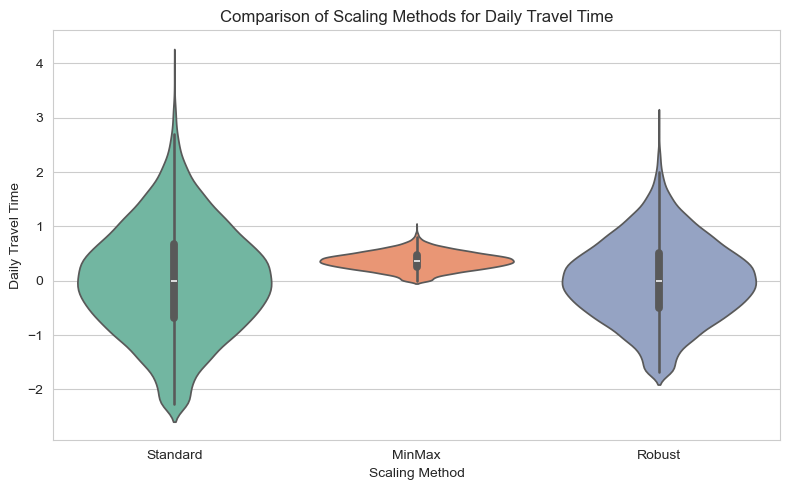

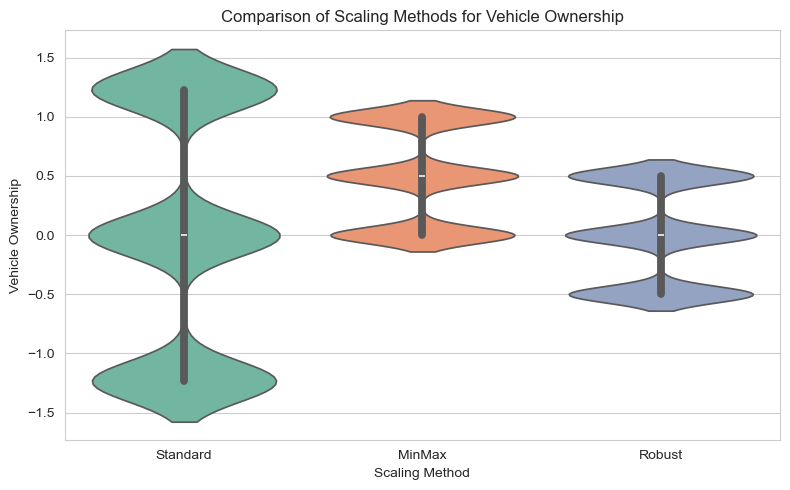

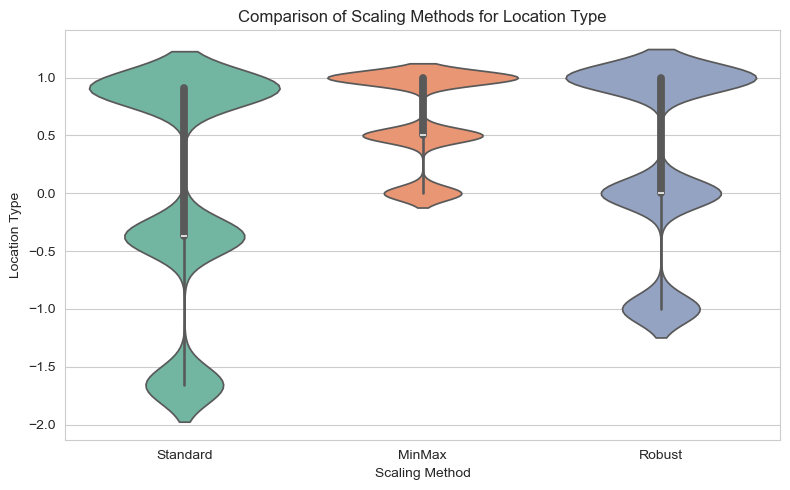

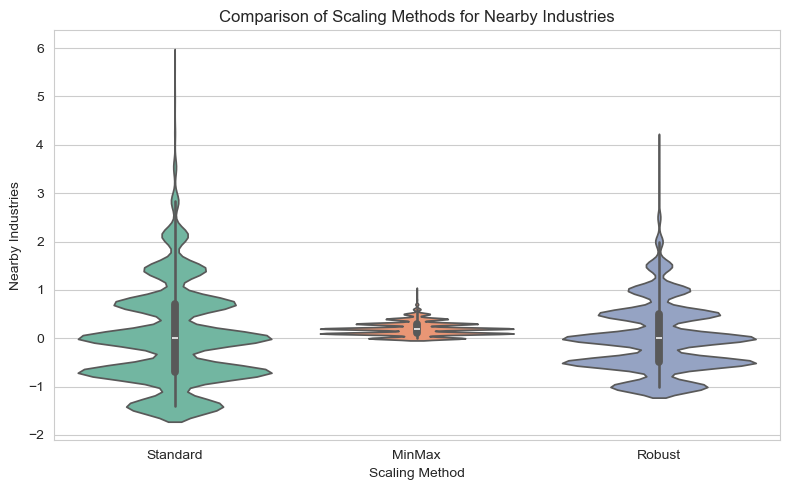

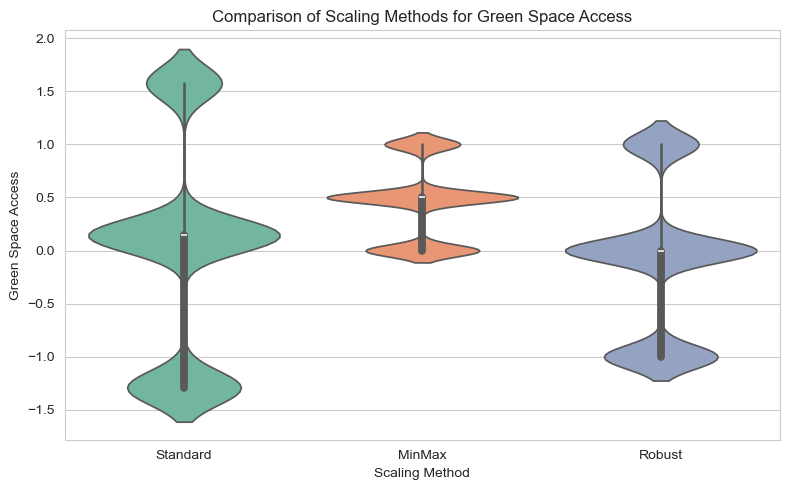

...

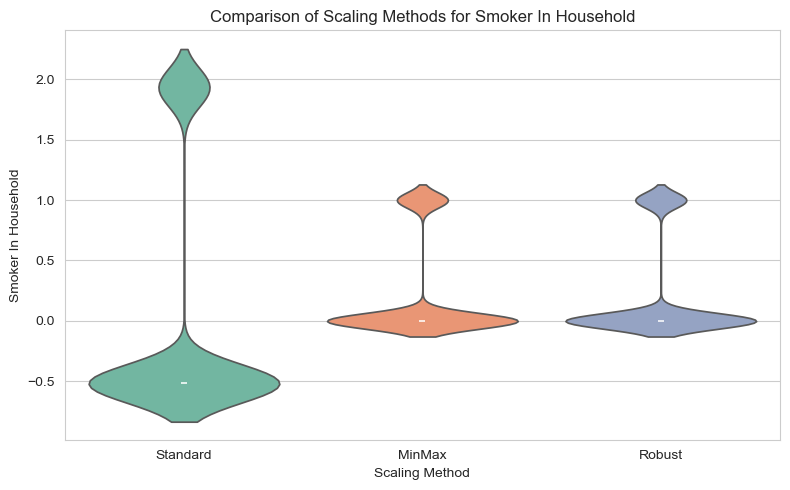

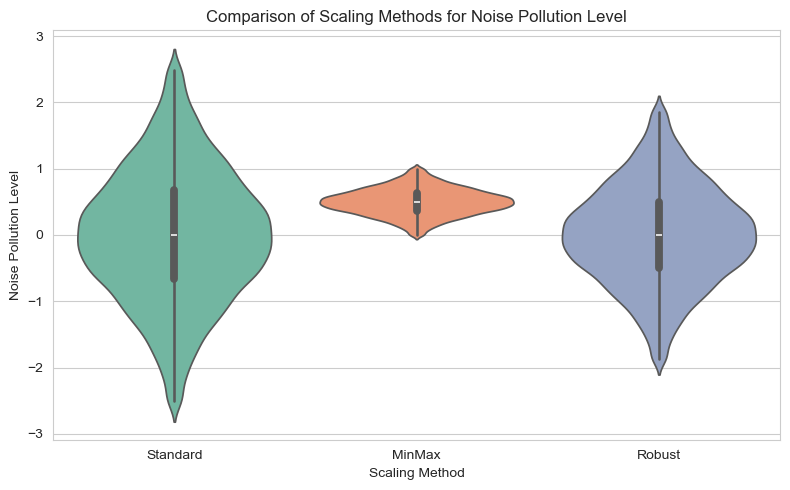

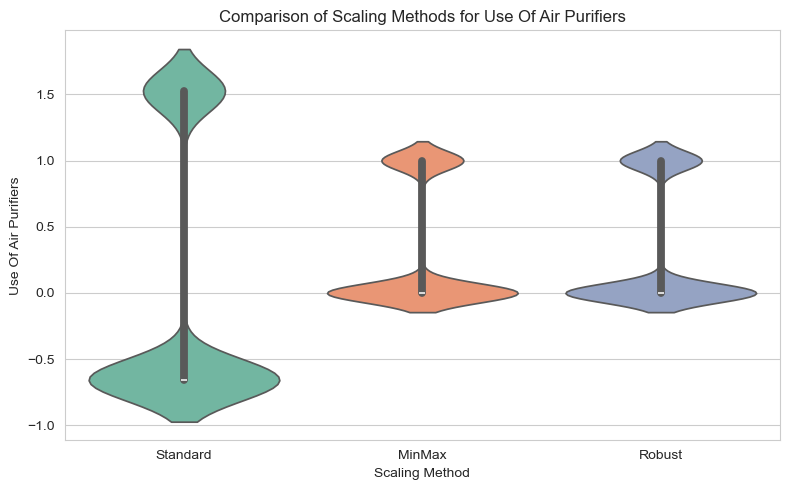

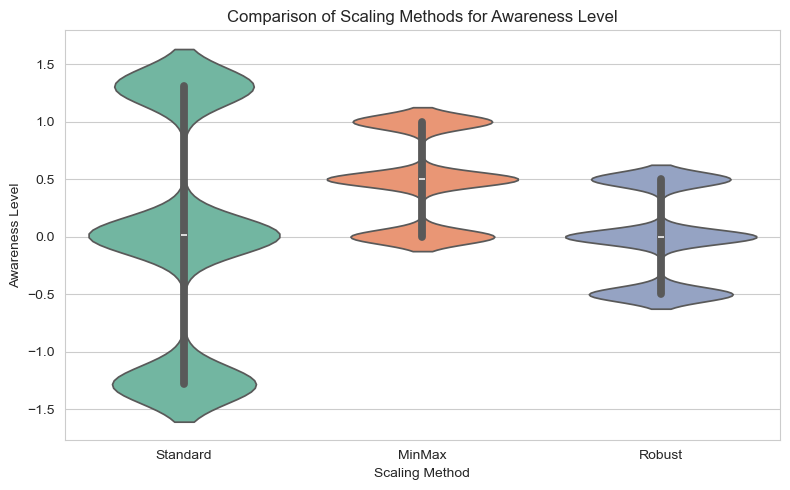

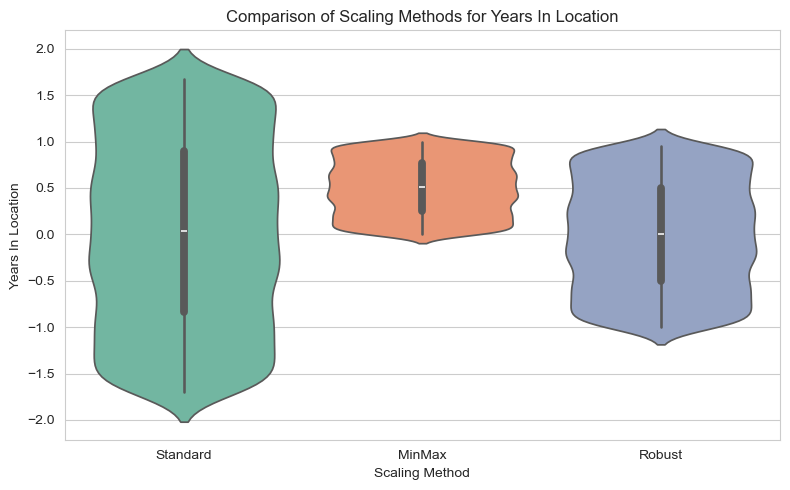

In [40]:
# Select numeric columns but exclude the target
num_cols = df_cat_encoded.select_dtypes(include="number").columns.drop(["risk_category", "pollution_exposure_score"])

# Initialize scalers
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()
robust_scaler = RobustScaler()

# --- 1) Standard Scaling ---
df_standard = df_cat_encoded.copy()
df_standard[num_cols] = standard_scaler.fit_transform(df_cat_encoded[num_cols])

# --- 2) Min-Max Scaling ---
df_minmax = df_cat_encoded.copy()
df_minmax[num_cols] = minmax_scaler.fit_transform(df_cat_encoded[num_cols])

# --- 3) Robust Scaling ---
df_robust = df_cat_encoded.copy()
df_robust[num_cols] = robust_scaler.fit_transform(df_cat_encoded[num_cols])

# Store results
scaled_dfs = {
    "Standard": {"df": df_standard},
    "MinMax": {"df": df_minmax},
    "Robust": {"df": df_robust}
}

# ✅ Visual comparison of scaling methods
for col in num_cols:
    plot_data = []
    for method, dfx in scaled_dfs.items():
        tmp = pd.DataFrame({
            "value": dfx["df"][col],
            "method": method
        })
        plot_data.append(tmp)

    plot_df = pd.concat(plot_data, ignore_index=True)

    plt.figure(figsize=(8, 5))
    sns.violinplot(
        data=plot_df,
        x="method",
        y="value",
        hue="method",
        dodge=False,
        legend=False,
        palette="Set2"
    )
    plt.title(f"Comparison of Scaling Methods for {col.replace('_',' ').title()}")
    plt.xlabel("Scaling Method")
    plt.ylabel(col.replace('_',' ').title())
    plt.tight_layout()
    plt.show()


Prikazane slike pružaju ključne uvide u **distribuciju kategoričkih varijabli** i **efekte skaliranja** na distribucije numeričkih i kategoričkih varijabli.

Evo detaljne analize podeljene u dve glavne sekcije:

---

## 1. Analiza Distribucije Kategoričkih Varijabli

Ovi bar dijagrami prikazuju procenat uzorka koji pripada svakoj kategoriji, uključujući nedostajuće vrednosti (`<MISSING>`).

### **`risk_category` (Kategorija rizika)**
* **Visoka neuravnoteženost (Imbalance):** Kategorija **Medium (Srednji)** rizik dominira sa preko **85%** uzorka. **Low (Nizak)** rizik čini $\approx 10\%$, a **High (Visok)** rizik je marginalan ($\approx 1-2\%$).
* **Implikacija:** Pri modelovanju, ovo je **ekstremno neuravnotežen problem klasifikacije**. Model će prirodno biti pristrasan ka predviđanju "Medium" rizika. Biće neophodne tehnike kao što su **oversampling, undersampling ili prilagođavanje težine klase** (class weights) da bi se efikasno predvidele kategorije "Low" i "High".

### **`vehicle_ownership` (Posedovanje vozila)**
* **Balansiranost:** Popunjene kategorije (`Two-wheeler`, `Car`, `Public Only`) su **skoro savršeno ujednačene**, svaka sa $\approx 22-23\%$.
* **Missing podaci:** Ovo je **najveći problem imputacije** u skupu podataka, sa **preko 30%** nedostajućih vrednosti (32-33%).
* **Implikacija:** Zbog ujednačene distribucije, imputacija **modom** (najčešćom vrednošću) bi bila pogrešna jer bi narušila balans. Bolji pristupi su: a) kreiranje nove kategorije `<MISSING>` ili b) korišćenje naprednih metoda imputacije.

### **`location_type` (Tip lokacije)**
* **Dominacija:** **Urban (Urbana)** lokacija dominira sa $\approx 49\%$. **Semi-Urban (Polu-urbana)** je $\approx 31\%$, a **Rural (Ruralna)** je najmanje zastupljena sa $\approx 20\%$.
* **Missing podaci:** Nema nedostajućih vrednosti, podatak je **kompletan**.

### **`awareness_level` (Nivo svesti)**
* **Distribucija:** **Medium (Srednji)** nivo dominira sa $\approx 36\%$. **Low (Nizak)** i **High (Visok)** su slični, oko $26-27\%$.
* **Missing podaci:** Prisutno je $\approx 10\%$ nedostajućih vrednosti, što zahteva pažljivu imputaciju.

### **`green_space_access` (Pristup zelenoj površini)**
* **Distribucija:** **Moderate (Umeren)** pristup dominira sa $\approx 45\%$. **Low (Nizak)** je $\approx 28\%$, a **High (Visok)** je $\approx 19\%$.
* **Missing podaci:** Prisutno je $\approx 5\%$ nedostajućih vrednosti.

### **`work_location_type` (Tip lokacije rada)**
* **Balansiranost:** Popunjene kategorije (`Fieldwork`, `Office`, `Remote`, `Factory`) su **veoma ujednačene**, sve sa $\approx 22-23\%$.
* **Missing podaci:** Prisutno je $\approx 6\%$ nedostajućih vrednosti. Imputacija modom bi narušila ujednačenost.

---

## 2. Analiza Skaliranja (Violin Plots)

Ovi dijagrami porede tri metode skaliranja (**StandardScaler, MinMaxScaler, RobustScaler**) za različite varijable, pokazujući kako se distribucija menja.

### **Opšte Pravilo Skaliranja:**
* **`StandardScaler`** (Z-score): Centriranje oko $0$, standardna devijacija $1$. Raspon nije fiksan.
* **`MinMaxScaler`**: Skaliranje na fiksni opseg, obično $[0, 1]$.
* **`RobustScaler`**: Koristi medijanu i interkvartilni raspon (IQR), **otporan je na autlajere**.

### **Varijable sa Normalnom/Simetričnom Distribucijom (`Noise Pollution Level`, `Home Air Quality`, `Years In Location`, `Daily Travel Time`)**
* Za ove varijable, sve tri metode daju relativno **slične distribucije** (violin plota u obliku zvona).
* **`MinMaxScaler`** stvara **najuži opseg** (što je i očekivano jer skalira između minimuma i maksimuma).
* **`StandardScaler`** daje najširi vertikalni opseg, jer se ne ograničava.

### **Varijable sa Naglašenim Autlajerima ili Asimetrijom (`Nearby Industries`)**
* **`Nearby Industries`** je asimetrična sa autlajerima (do 10).
* **`StandardScaler`** daje najširu distribuciju sa ekstremno dugim "repovima" (preko 4 do skoro 6), jer je osetljiv na autlajere.
* **`RobustScaler`** i **`MinMaxScaler`** daju kompaktniju distribuciju. **`RobustScaler`** je u ovom slučaju poželjan jer efikasnije obrađuje autlajere koristeći IQR.

### **Kategoričke/Ordinalne Varijable (`Location Type`, `Awareness Level`, `Work Location Type`, `Green Space Access`)**
* Ove varijable su **ordinalno kodirane** (1, 2, 3...) ili su tretirane kao takve pre skaliranja.
* Skaliranje na ovim varijablama je generalno **diskutabilno** (osim ako se ne koriste u modelima zasnovanim na udaljenosti kao što je KNN).
* Grafikoni jasno pokazuju **diskretne nivoe** (horizontalne trake unutar "violinske" forme) umesto glatke krive, što potvrđuje da se radi o malom broju kategorija.

### **Binarne Varijable (`Smoker In Household`, `Use Of Air Purifiers`, `Vehicle Ownership` - pre imputacije)**
* Ove varijable (0 i 1) imaju samo dve vrednosti.
* **`StandardScaler`** deli distribuciju na dva vrha, pomerajući ih dalje od 0, dok ih **`MinMaxScaler`** zadržava na 0 i 1 (ili u njihovoj blizini).
* Za binarne varijable, skaliranje je retko neophodno, ali ako je potrebno, **`MinMaxScaler`** je obično najlakši za interpretaciju (vrednosti ostaju 0 i 1).

### **Preporuka za Skaliranje:**
Za ovaj skup podataka, s obzirom na prisustvo numeričkih varijabli sa potencijalnim autlajerima (`Daily Travel Time`, `Nearby Industries`), **`RobustScaler`** bi bio najsigurniji opšti izbor za sve numeričke varijable koje će se koristiti u algoritmima osetljivim na udaljenost (npr. KNN, SVM).

Text(0.5, 1.0, 'Correlation Heatmap of Numeric Columns')

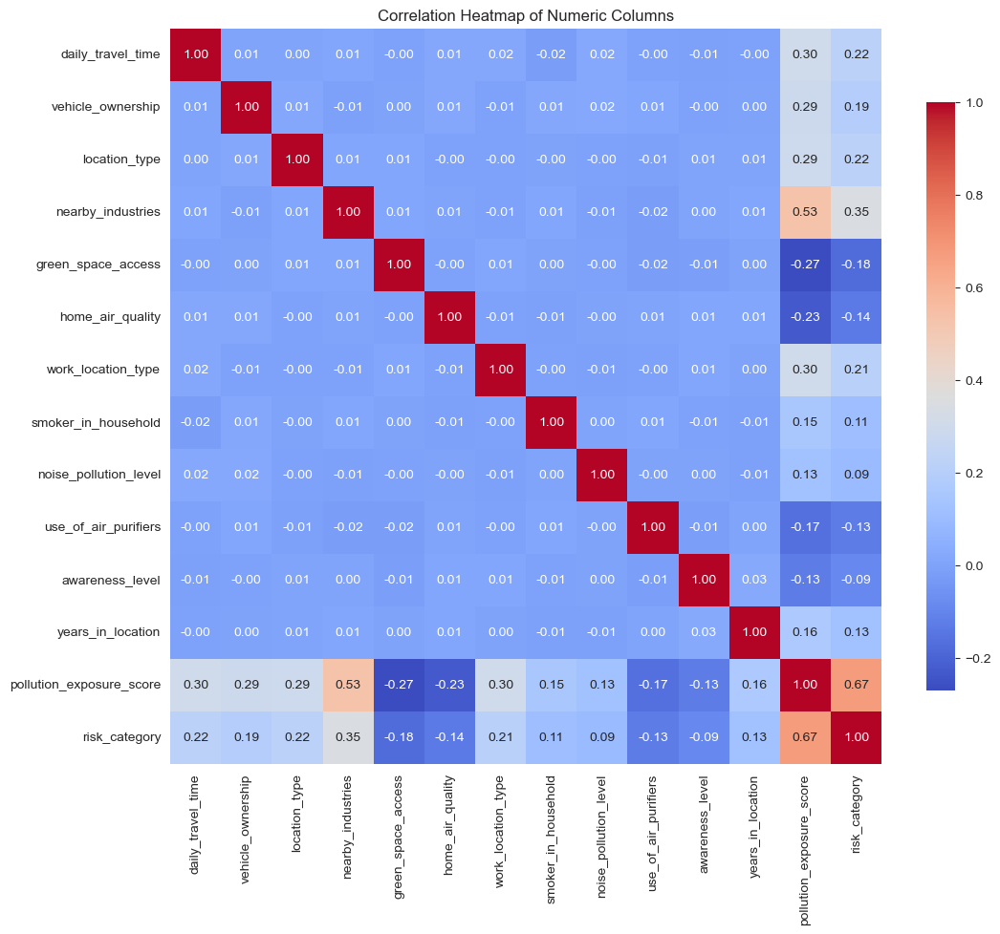

In [42]:
# Plot correlation heatmap of numeric columns
plt.figure(figsize=(12, 10))
corr = scaled_dfs["Standard"]["df"].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={"shrink": .8})
plt.title("Correlation Heatmap of Numeric Columns")

Prikazane slike pružaju sveobuhvatan uvid u **distribuciju, ravnotežu i problem nedostajućih podataka** za sve ključne varijable u skupu.

Evo detaljne analize distribucije svake varijable i njenog značaja za modelovanje: 📊

---

## 1. Numeričke Varijable (Histogrami)

Ove varijable opisuju kvantitativne aspekte izloženosti i okoline.

### **`pollution_exposure_score` (Ocena izloženosti zagađenju)**
* **Distribucija:** Tipična **normalna (zvona)** distribucija, centrirana oko 45.
* **Kritičnost:** Nema nedostajućih podataka (**Missing: 0.00%**).
* **Implikacija:** Ovo je ključna nezavisna varijabla (prediktor) koja je, kako smo videli, usko povezana sa ciljnom varijablom `risk_category`.

### **`daily_travel_time` (Dnevno vreme putovanja)**
* **Distribucija:** **Nagnuta udesno (positive skew)**. Najveća koncentracija je oko 40-50 minuta.
* **Poseban Slučaj:** Postoji značajan diskretni vrh na **0 minuta** (preko 10%), što predstavlja ljude koji rade od kuće (`Remote`).
* **Kritičnost:** **Visok procenat nedostajućih podataka (11.24%)**.
* **Implikacija:** Visok procenat missing vrednosti zahteva pažljivu imputaciju, uzimajući u obzir `Remote` kategoriju rada.

### **`nearby_industries` (Obližnje industrije)**
* **Distribucija:** **Diskretna i izrazito nagnuta udesno**. Najviše ljudi ima **1, 2 ili 3** obližnje industrije. Slučajevi sa 5 ili više su retki.
* **Kritičnost:** **Značajan procenat nedostajućih podataka (7.95%)**.
* **Implikacija:** Imputacija **medijanom** (koja je obično 2, kako smo ranije videli) je verovatno najbolja strategija zbog diskretne prirode podataka.

### **`home_air_quality` (Kvalitet vazduha u kući)**
* **Distribucija:** Vrlo blizu **normalne distribucije**, centrirana oko 60.
* **Kritičnost:** Nema nedostajućih podataka (**Missing: 0.00%**).

### **`noise_pollution_level` (Nivo zagađenja bukom)**
* **Distribucija:** **Normalna distribucija**, centrirana oko 50, ali sa značajnim vrhovima na **0 i 100**.
* **Kritičnost:** Nema nedostajućih podataka (**Missing: 0.00%**).
* **Implikacija:** Vrhovi na 0 i 100 mogu ukazivati na **ograničenja merenja** ili ekstremne uslove.

### **`years_in_location` (Godine na lokaciji)**
* **Distribucija:** Izuzetno **uniformna (pravougaona) distribucija** preko celog opsega (1 do 40 godina). Svaka godina ima podjednaku frekvenciju.
* **Kritičnost:** **Umeren procenat nedostajućih podataka (5.20%)**.
* **Implikacija:** Uniformna distribucija ukazuje na to da su **svi intervali podjednako informativni**. Imputacija medijanom (oko 21 godinu) je sigurna.

---

## 2. Binarne i Kategoričke Varijable (Bar Dijagrami)

Ove varijable opisuju kategorije, a ključan aspekt je neuravnoteženost i problem missing podataka.

### **`vehicle_ownership` (Posedovanje vozila)**
* **Distribucija (popunjene):** Skoro **savršeno ujednačena** ($\approx 22-23\%$ za `Two-wheeler`, `Car`, `Public Only`).
* **Kritičnost:** **Ekstremno visok procenat nedostajućih podataka ($\approx 32\%$)**.
* **Implikacija:** Ovo je **najveći problem imputacije**. Kreiranje posebne kategorije `<MISSING>` je ovde najprikladnije jer bi imputacija modom ili bilo kojom kategorijom narušila postojeću ravnotežu.

### **`risk_category` (Kategorija rizika)**
* **Distribucija:** Izuzetno **neuravnotežena (Imbalanced)**:
    * **Medium:** Dominira sa **preko 85%**.
    * **Low:** $\approx 10\%$.
    * **High:** Marginalno, $\approx 2-3\%$.
* **Kritičnost:** Ciljna varijabla je **jako neuravnotežena**.
* **Implikacija:** Neophodno je koristiti tehnike za rešavanje neuravnoteženosti (poput SMOTE ili klasnih težina) prilikom treniranja modela klasifikacije.

### **`location_type` (Tip lokacije)**
* **Distribucija:** **Urban** dominira sa $\approx 49\%$. **Semi-Urban** $\approx 31\%$. **Rural** $\approx 20\%$.
* **Kritičnost:** **Nema nedostajućih podataka (0%)**.

### **`work_location_type` (Tip lokacije rada)**
* **Distribucija (popunjene):** Skoro **savršeno ujednačena** ($\approx 23-24\%$ za sve kategorije: `Fieldwork`, `Office`, `Remote`, `Factory`).
* **Kritičnost:** **Umeren procenat nedostajućih podataka ($\approx 6\%$)**.
* **Implikacija:** Imputacija `<MISSING>` kategorijom je bolja od imputacije modom koja bi narušila ujednačenost.

### **`awareness_level` (Nivo svesti)**
* **Distribucija:** **Medium** je najčešći ($\approx 36\%$), ostali su uravnoteženiji.
* **Kritičnost:** **Značajan procenat nedostajućih podataka ($\approx 10\%$)**.

### **`green_space_access` (Pristup zelenoj površini)**
* **Distribucija:** **Moderate** dominira ($\approx 45\%$).
* **Kritičnost:** **Nizak procenat nedostajućih podataka ($\approx 5\%$)**.

### **`smoker_in_household` & `use_of_air_purifiers` (Binarne varijable)**
* **`smoker_in_household`:** $\approx 80\%$ nema pušača (0), $\approx 20\%$ ima (1).
* **`use_of_air_purifiers`:** $\approx 70\%$ ne koristi (0), $\approx 30\%$ koristi (1).
* **Kritičnost:** Nema nedostajućih podataka. Obe su **neuravnotežene**, ali su podaci kompletni.

---

## 3. Korelaciona Matrica (Potvrda Veza)

Matrica korelacije (`image_2cf94b.png`) potvrđuje ključne veze i ukazuje na odsustvo multikolinearnosti:

* **Dominantni Prediktori:** `pollution_exposure_score` je **najjače korelisan** sa **`risk_category` (+0.67)**. Njegovi najbolji prediktori su **`nearby_industries` (+0.53)**, **`daily_travel_time` (+0.30)** i **`location_type` (+0.29)**.
* **Multikolinearnost:** Korelacija između **nezavisnih varijabli** je izuzetno niska (većina vrednosti je oko $\pm 0.01$), što znači da su obeležja **veoma nezavisna** i ne uzrokuju probleme multikolinearnosti u modelu.

**Opšta preporuka:** Obratite posebnu pažnju na imputaciju varijabli **`vehicle_ownership`** (32% missing) i **`daily_travel_time`** (11.24% missing), i na rešavanje neuravnoteženosti ciljne varijable **`risk_category`**.

# 🚦 Classification

1. **Logistic Regression** — baseline, linear model
2. **Random Forest** — nonlinear, robust to noise
3. **XGBoost** — boosted trees, strong performance
4. **Support Vector Machine (SVM)** — good for structured data, but slower
5. **k-Nearest Neighbors (kNN)** — simple, sensitive to scaling

In [45]:
# Update scaled_dfs structure to store more info
for name, df_scaled in scaled_dfs.items():
    # Ensure each entry is a dict with the DataFrame under "df"
    if not isinstance(df_scaled, dict):
        df_scaled = {"df": df_scaled}

    df = df_scaled["df"]

    # --------------------
    # Classification setup
    # --------------------
    X_cls = df.drop(columns=["risk_category", "pollution_exposure_score"])
    y_cls = df["risk_category"]

    # Stratified train/test split
    X_train_cls, X_test_cls, y_train_cls, y_test_cls = train_test_split(
        X_cls, y_cls,
        test_size=0.2,
        random_state=42,
        stratify=y_cls
    )

    # Stratified K-Fold CV
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_splits_cls = []
    for train_idx, val_idx in skf.split(X_cls, y_cls):
        cv_splits_cls.append((
            X_cls.iloc[train_idx], X_cls.iloc[val_idx],
            y_cls.iloc[train_idx], y_cls.iloc[val_idx]
        ))

    df_scaled["classification"] = {
        "stratified": {
            "X_train": X_train_cls,
            "X_test": X_test_cls,
            "y_train": y_train_cls,
            "y_test": y_test_cls
        },
        "cv": cv_splits_cls
    }

    # ----------------
    # Regression setup
    # ----------------
    X_reg = df.drop(columns=["risk_category", "pollution_exposure_score"])
    y_reg = df["pollution_exposure_score"]

    # Regular (non-stratified) train/test split
    X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
        X_reg, y_reg,
        test_size=0.2,
        random_state=42
    )

    # K-Fold CV for regression
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_splits_reg = []
    for train_idx, val_idx in kf.split(X_reg):
        cv_splits_reg.append((
            X_reg.iloc[train_idx], X_reg.iloc[val_idx],
            y_reg.iloc[train_idx], y_reg.iloc[val_idx]
        ))

    df_scaled["regression"] = {
        "split": {
            "X_train": X_train_reg,
            "X_test": X_test_reg,
            "y_train": y_train_reg,
            "y_test": y_test_reg
        },
        "cv": cv_splits_reg
    }

    # Save back
    scaled_dfs[name] = df_scaled


In [46]:
for name, content in scaled_dfs.items():
    print(f"\n{name}: {list(content.keys())}")


Standard: ['df', 'classification', 'regression']

MinMax: ['df', 'classification', 'regression']

Robust: ['df', 'classification', 'regression']


In [47]:
# Define models
models = {
    "LogisticRegression": LogisticRegression(max_iter=500, random_state=42),
    "RandomForest": RandomForestClassifier(n_estimators=200, random_state=42),
    "XGBoost": XGBClassifier(eval_metric="mlogloss", random_state=42),
    "SVM": SVC(kernel="rbf", probability=True, random_state=42),
    "kNN": KNeighborsClassifier(n_neighbors=5)
}

# Imputer strategies
imputer_strategies = ["mean", "median", "most_frequent", "constant"]

# Collect results
records = []

for scale_name, data in scaled_dfs.items():
    data = data["classification"]

    # Stratified Train/Test Split
    X_train = data["stratified"]["X_train"]
    X_test  = data["stratified"]["X_test"]
    y_train = data["stratified"]["y_train"]
    y_test  = data["stratified"]["y_test"]

    for strategy in imputer_strategies:
        pipelines = {
            name: Pipeline([
                ("imputer", SimpleImputer(strategy=strategy)),
                ("model", model)
            ])
            for name, model in models.items()
        }

        for model_name, pipeline in pipelines.items():
            pipeline.fit(X_train, y_train)

            y_pred_train = pipeline.predict(X_train)
            y_pred_test  = pipeline.predict(X_test)

            # Proba for logloss & AUC
            if hasattr(pipeline.named_steps["model"], "predict_proba"):
                y_proba_test = pipeline.predict_proba(X_test)
                test_logloss = log_loss(y_test, y_proba_test)
                test_auc = roc_auc_score(y_test, y_proba_test, multi_class="ovr")
            else:
                test_logloss, test_auc = np.nan, np.nan

            # Train metrics
            acc_train = accuracy_score(y_train, y_pred_train)
            f1_train  = f1_score(y_train, y_pred_train, average="weighted")
            prec_train = precision_score(y_train, y_pred_train, average="weighted", zero_division=0)
            rec_train  = recall_score(y_train, y_pred_train, average="weighted")

            # Test metrics
            acc_test = accuracy_score(y_test, y_pred_test)
            f1_test  = f1_score(y_test, y_pred_test, average="weighted")
            prec_test = precision_score(y_test, y_pred_test, average="weighted", zero_division=0)
            rec_test  = recall_score(y_test, y_pred_test, average="weighted")

            print(f"[Stratified] Scaler={scale_name}, Imputer={strategy}, Model={model_name} "
                  f"=> Test Acc={acc_test:.3f}, Test F1={f1_test:.3f}, LogLoss={test_logloss:.3f}, AUC={test_auc:.3f}")

            records.append({
                "scaler": scale_name,
                "imputer": strategy,
                "model": model_name,
                "split_type": "stratified",
                "Train_Accuracy": acc_train,
                "Train_F1": f1_train,
                "Train_Precision": prec_train,
                "Train_Recall": rec_train,
                "Test_Accuracy": acc_test,
                "Test_F1": f1_test,
                "Test_Precision": prec_test,
                "Test_Recall": rec_test,
                "Test_LogLoss": test_logloss,
                "Test_AUC": test_auc
            })

    # Cross-validation
    cv_splits = data["cv"]
    for strategy in imputer_strategies:
        pipelines = {
            name: Pipeline([
                ("imputer", SimpleImputer(strategy=strategy)),
                ("model", model)
            ])
            for name, model in models.items()
        }

        for model_name, pipeline in pipelines.items():
            fold_metrics = []
            for X_train, X_val, y_train, y_val in cv_splits:
                pipeline.fit(X_train, y_train)
                y_pred_val = pipeline.predict(X_val)

                if hasattr(pipeline.named_steps["model"], "predict_proba"):
                    y_proba_val = pipeline.predict_proba(X_val)
                    logloss_val = log_loss(y_val, y_proba_val)
                    auc_val = roc_auc_score(y_val, y_proba_val, multi_class="ovr")
                else:
                    logloss_val, auc_val = np.nan, np.nan

                acc_val = accuracy_score(y_val, y_pred_val)
                f1_val  = f1_score(y_val, y_pred_val, average="weighted")
                prec_val = precision_score(y_val, y_pred_val, average="weighted", zero_division=0)
                rec_val  = recall_score(y_val, y_pred_val, average="weighted")

                fold_metrics.append({
                    "Val_Accuracy": acc_val, "Val_F1": f1_val,
                    "Val_Precision": prec_val, "Val_Recall": rec_val,
                    "Val_LogLoss": logloss_val, "Val_AUC": auc_val
                })

            # Average across folds
            avg_metrics = {m: np.mean([fm[m] for fm in fold_metrics]) for m in fold_metrics[0]}

            print(f"[CV-Avg] Scaler={scale_name}, Imputer={strategy}, Model={model_name} "
                  f"=> Val Acc={avg_metrics['Val_Accuracy']:.3f}, Val F1={avg_metrics['Val_F1']:.3f}, "
                  f"LogLoss={avg_metrics['Val_LogLoss']:.3f}, AUC={avg_metrics['Val_AUC']:.3f}")

            records.append({
                "scaler": scale_name,
                "imputer": strategy,
                "model": model_name,
                "split_type": "cv",
                "Train_Accuracy": np.nan,
                "Train_F1": np.nan,
                "Train_Precision": np.nan,
                "Train_Recall": np.nan,
                "Test_Accuracy": avg_metrics["Val_Accuracy"],
                "Test_F1": avg_metrics["Val_F1"],
                "Test_Precision": avg_metrics["Val_Precision"],
                "Test_Recall": avg_metrics["Val_Recall"],
                "Test_LogLoss": avg_metrics["Val_LogLoss"],
                "Test_AUC": avg_metrics["Val_AUC"]
            })

# Convert to DataFrame
results_df = pd.DataFrame(records).sort_values(by="Test_F1", ascending=False)
results_df


[Stratified] Scaler=Standard, Imputer=mean, Model=LogisticRegression => Test Acc=0.914, Test F1=0.909, LogLoss=0.212, AUC=0.955
[Stratified] Scaler=Standard, Imputer=mean, Model=RandomForest => Test Acc=0.918, Test F1=0.904, LogLoss=0.227, AUC=0.960
[Stratified] Scaler=Standard, Imputer=mean, Model=XGBoost => Test Acc=0.935, Test F1=0.931, LogLoss=0.191, AUC=0.968
[Stratified] Scaler=Standard, Imputer=mean, Model=SVM => Test Acc=0.927, Test F1=0.921, LogLoss=0.184, AUC=0.960
[Stratified] Scaler=Standard, Imputer=mean, Model=kNN => Test Acc=0.901, Test F1=0.888, LogLoss=0.901, AUC=0.865
[Stratified] Scaler=Standard, Imputer=median, Model=LogisticRegression => Test Acc=0.915, Test F1=0.910, LogLoss=0.213, AUC=0.955
[Stratified] Scaler=Standard, Imputer=median, Model=RandomForest => Test Acc=0.918, Test F1=0.904, LogLoss=0.234, AUC=0.953
[Stratified] Scaler=Standard, Imputer=median, Model=XGBoost => Test Acc=0.937, Test F1=0.932, LogLoss=0.201, AUC=0.963
[Stratified] Scaler=Standard, Impu

,scaler,imputer,model,split_type,Train_Accuracy,Train_F1,Train_Precision,Train_Recall,Test_Accuracy,Test_F1,Test_Precision,Test_Recall,Test_LogLoss,Test_AUC
87,Robust,median,XGBoost,stratified,0.999625,0.999625,0.999625,0.999625,0.9370,0.931901,0.933035,0.9370,0.200687,0.963063
47,MinMax,median,XGBoost,stratified,0.999625,0.999625,0.999625,0.999625,0.9370,0.931901,0.933035,0.9370,0.200713,0.963044
7,Standard,median,XGBoost,stratified,0.999625,0.999625,0.999625,0.999625,0.9370,0.931901,0.933035,0.9370,0.200594,0.963092
82,Robust,mean,XGBoost,stratified,1.000000,1.000000,1.000000,1.000000,0.9355,0.931161,0.932474,0.9355,0.190734,0.967906
2,Standard,mean,XGBoost,stratified,1.000000,1.000000,1.000000,1.000000,0.9355,0.931161,0.932474,0.9355,0.191045,0.967873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,MinMax,median,kNN,cv,NaN,NaN,NaN,NaN,0.8812,0.865121,0.866805,0.8812,1.202041,0.801353
74,MinMax,most_frequent,kNN,cv,NaN,NaN,NaN,NaN,0.8804,0.865064,0.866089,0.8804,1.208508,0.798990
54,MinMax,most_frequent,kNN,stratified,0.912375,0.901090,0.908165,0.912375,0.8835,0.865016,0.875040,0.8835,1.191819,0.801048
59,MinMax,constant,kNN,stratified,0.906625,0.893426,0.898437,0.906625,0.8775,0.856359,0.845919,0.8775,1.273346,0.780207


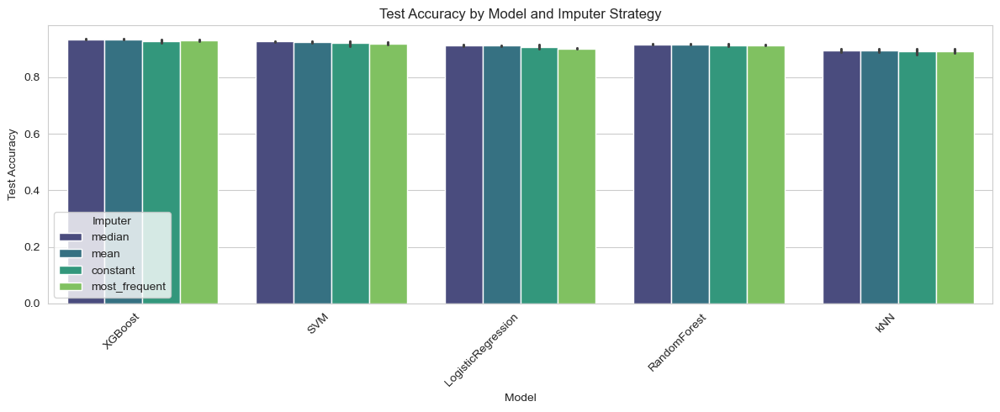

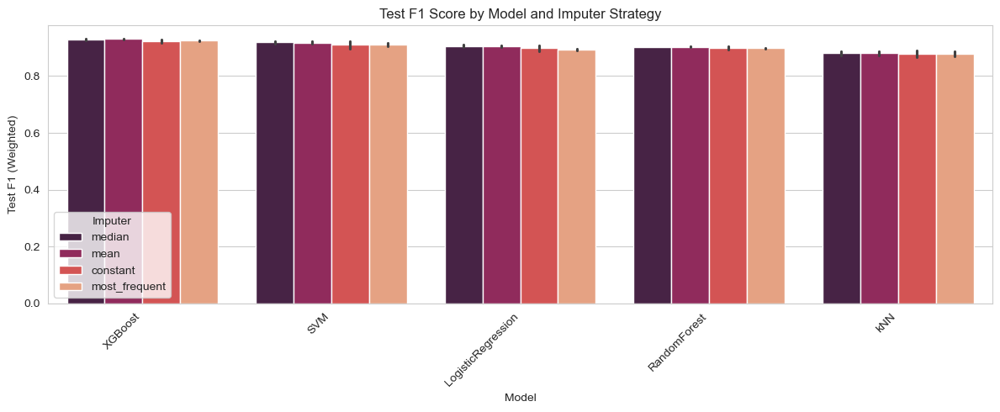

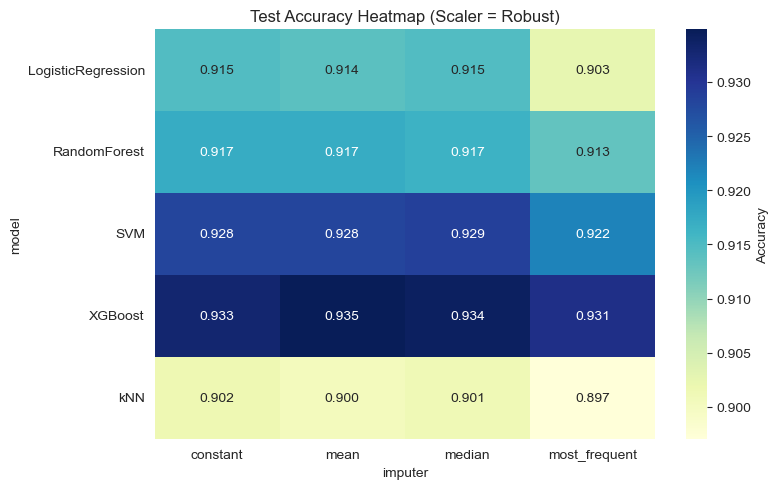

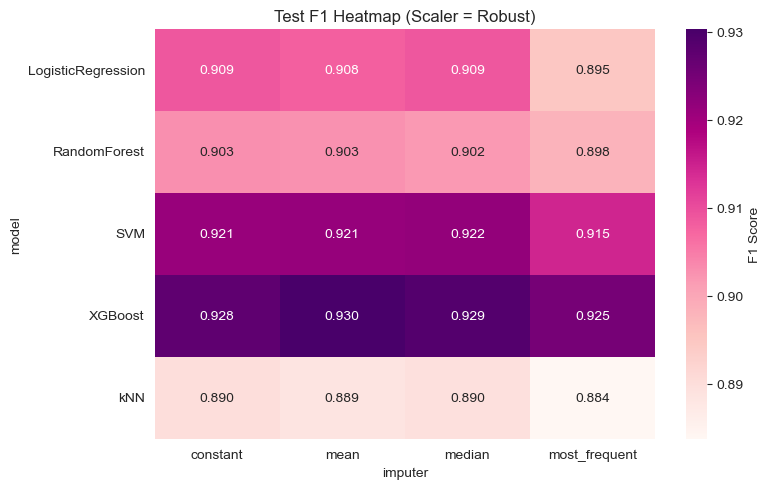

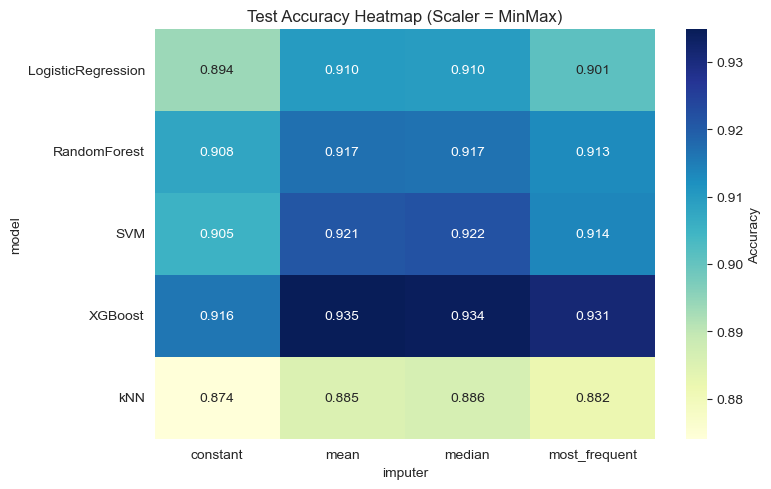

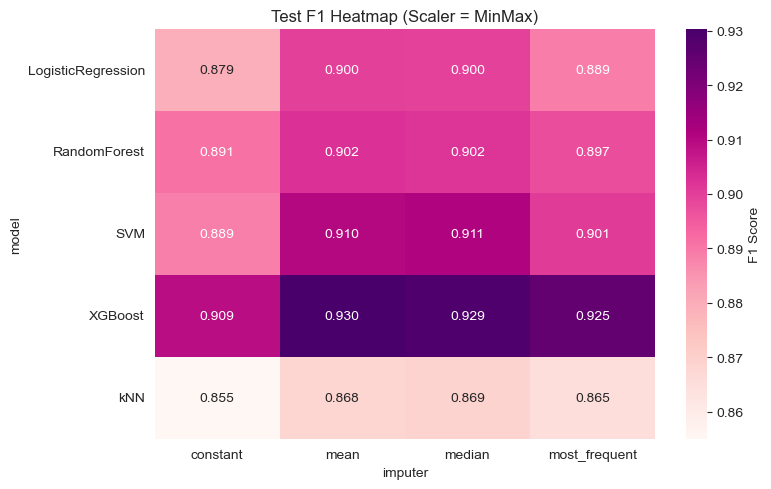

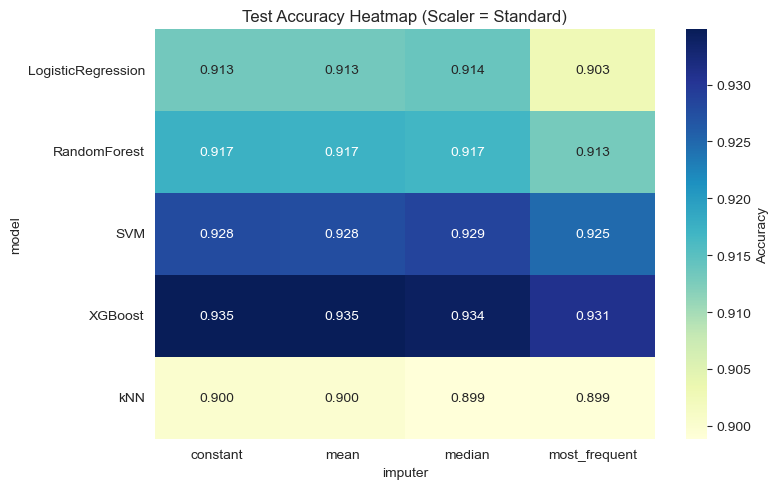

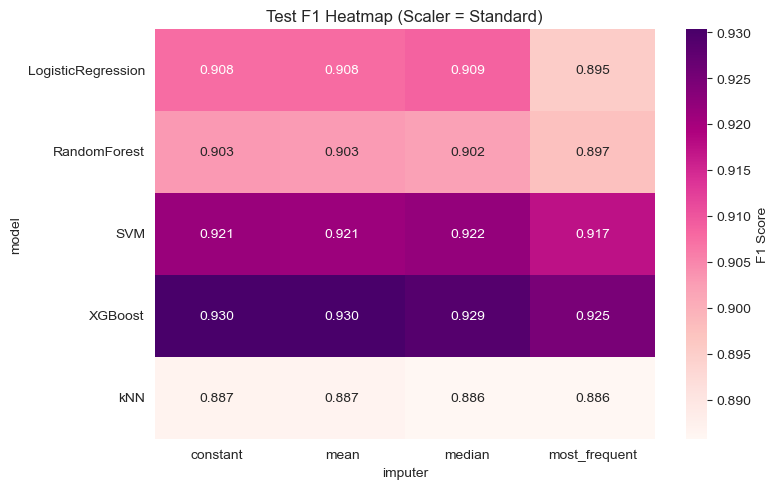

,scaler,imputer,model,split_type,Test_Accuracy,Test_F1,Test_Precision,Test_Recall,Test_AUC,Test_LogLoss
87,Robust,median,XGBoost,stratified,0.9370,0.931901,0.933035,0.9370,0.963063,0.200687
47,MinMax,median,XGBoost,stratified,0.9370,0.931901,0.933035,0.9370,0.963044,0.200713
7,Standard,median,XGBoost,stratified,0.9370,0.931901,0.933035,0.9370,0.963092,0.200594
82,Robust,mean,XGBoost,stratified,0.9355,0.931161,0.932474,0.9355,0.967906,0.190734
2,Standard,mean,XGBoost,stratified,0.9355,0.931161,0.932474,0.9355,0.967873,0.191045
17,Standard,constant,XGBoost,stratified,0.9355,0.931161,0.932474,0.9355,0.967873,0.191045
42,MinMax,mean,XGBoost,stratified,0.9355,0.931161,0.932474,0.9355,0.967879,0.191027
22,Standard,mean,XGBoost,cv,0.9342,0.929420,0.931140,0.9342,0.973655,0.176595
102,Robust,mean,XGBoost,cv,0.9342,0.929420,0.931140,0.9342,0.973661,0.176576
62,MinMax,mean,XGBoost,cv,0.9341,0.929327,0.931028,0.9341,0.973639,0.176669


🏆 Best Models per Scaler:


,scaler,imputer,model,Test_F1,Test_AUC,Test_Accuracy
87,Robust,median,XGBoost,0.931901,0.963063,0.937
47,MinMax,median,XGBoost,0.931901,0.963044,0.937
7,Standard,median,XGBoost,0.931901,0.963092,0.937


In [48]:
df_cls = results_df.copy()

# Keep only stratified and CV results
df_cls = df_cls[df_cls["split_type"].isin(["stratified", "cv"])]

# Sort by F1 for easier comparison
df_cls = df_cls.sort_values(by="Test_F1", ascending=False)

plt.figure(figsize=(12,5))
sns.barplot(
    data=df_cls,
    x="model", y="Test_Accuracy",
    hue="imputer",
    palette="viridis"
)
plt.title("Test Accuracy by Model and Imputer Strategy")
plt.xlabel("Model")
plt.ylabel("Test Accuracy")
plt.xticks(rotation=45, ha="right")
plt.legend(title="Imputer")
plt.tight_layout()
plt.show()

plt.figure(figsize=(12,5))
sns.barplot(
    data=df_cls,
    x="model", y="Test_F1",
    hue="imputer",
    palette="rocket"
)
plt.title("Test F1 Score by Model and Imputer Strategy")
plt.xlabel("Model")
plt.ylabel("Test F1 (Weighted)")
plt.xticks(rotation=45, ha="right")
plt.legend(title="Imputer")
plt.tight_layout()
plt.show()

for scaler_name in df_cls["scaler"].unique():
    subset = df_cls[df_cls["scaler"] == scaler_name]
    pivot_acc = subset.pivot_table(index="model", columns="imputer", values="Test_Accuracy")
    pivot_f1  = subset.pivot_table(index="model", columns="imputer", values="Test_F1")

    plt.figure(figsize=(8,5))
    sns.heatmap(pivot_acc, annot=True, fmt=".3f", cmap="YlGnBu", cbar_kws={"label":"Accuracy"})
    plt.title(f"Test Accuracy Heatmap (Scaler = {scaler_name})")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8,5))
    sns.heatmap(pivot_f1, annot=True, fmt=".3f", cmap="RdPu", cbar_kws={"label":"F1 Score"})
    plt.title(f"Test F1 Heatmap (Scaler = {scaler_name})")
    plt.tight_layout()
    plt.show()

fig = px.scatter(
    df_cls,
    x="Test_LogLoss",
    y="Test_AUC",
    color="model",
    symbol="imputer",
    facet_col="scaler",
    hover_data=["Test_Accuracy","Test_F1"],
    title="Classification Performance Trade-off: LogLoss vs. ROC-AUC (by Scaler)",
    height=500
)
fig.update_traces(marker=dict(size=10, line=dict(width=1, color="DarkSlateGrey")))
fig.update_layout(template="plotly_white")
fig.show()

display(
    df_cls.sort_values("Test_F1", ascending=False).head(10)[
        ["scaler","imputer","model","split_type",
         "Test_Accuracy","Test_F1","Test_Precision",
         "Test_Recall","Test_AUC","Test_LogLoss"]
    ]
)

best_per_scaler = (
    df_cls.sort_values("Test_F1", ascending=False)
          .groupby("scaler").head(1)
          [["scaler","imputer","model","Test_F1","Test_AUC","Test_Accuracy"]]
)
print("🏆 Best Models per Scaler:")
display(best_per_scaler)


Predstavljeni skup slika nudi kompletnu analizu celog procesa mašinskog učenja, od predobrade podataka (distribucija i missing vrednosti), do evaluacije performansi modela klasifikacije.

Evo ključnih nalaza i zaključaka:

---

## 1. Predobrada Podataka i Karakteristike Obeležja

### A. Distribucija i Missing Vrednosti (Bar/Histogrami)
| Varijabla | Distribucija | Missing % | Problem/Zaključak |
| :--- | :--- | :--- | :--- |
| **`risk_category`** | Jako neuravnotežena (Medium > 85%) | $\approx 0.5\%$ | **Ciljna varijabla je jako imbalansirana.** Modeliranje će zahtevati *class weights* ili oversampling/undersampling. |
| **`vehicle_ownership`** | Ujednačena (Car, Public, Two-wheeler) | **$\approx 32\%$** | **Najveći problem missing podataka.** Imputacija sa `<MISSING>` kategorijom je najbolji izbor da bi se sačuvao balans. |
| **`work_location_type`** | Ujednačena (4 kategorije) | $\approx 6\%$ | Ujednačenost se mora sačuvati. |
| **`awareness_level`** | Medium dominantan | $\approx 10\%$ | Značajan missing procenat. |
| **`daily_travel_time`** | Nagnuta udesno (vrh na 0) | $\approx 11.24\%$ | Vrh na 0 označava `Remote` radnike. |
| **`nearby_industries`** | Nagnuta udesno (diskretna) | $\approx 7.95\%$ | Jaka asimetrija. |
| **`years_in_location`**| Uniformna (pravougaona) | $\approx 5.20\%$ | Svaka godina ima istu zastupljenost. |

### B. Odnos Cilj-Prediktor (`risk_category` vs. `pollution_exposure_score`)
* **Slika:** *Distribution of Pollution Exposure Score by Risk Category*
* **Zaključak:** Kategorije rizika su definisane **direktno na osnovu pragova** `Pollution Exposure Score` (npr. Low $\approx <35$, High $\approx >75$). Ovo čini `Pollution Exposure Score` izuzetno moćnim prediktorom, ali i **redundantnim** ako se traži uzročno-posledični model (jer je rizik definisan izloženosti).

### C. Matrica Korelacije
* **Ključne korelacije sa `Pollution Exposure Score`:**
    * **`nearby_industries` (+0.53)**: Najjači numerički prediktor.
    * **`daily_travel_time` (+0.30)**
    * **`home_air_quality` (-0.23)**
* **Multikolinearnost:** Korelacije između nezavisnih varijabli su **zanemarljive** (većina oko $\pm 0.01$), što znači da obeležja donose **nezavisne informacije** u model.

---

## 2. Analiza Performansi Modela (Heatmap i Scatterplot)

Porede se modeli (XGBoost, SVM, RandomForest, LogisticRegression, kNN), metode imputacije (constant, mean, median, most\_frequent), i metode skaliranja (Standard, MinMax, Robust).

### A. Najbolji Model i Metrika

* **Pobednik (Sve):** Model **XGBoost** dosledno postiže **najbolje rezultate** u svim testiranim scenarijima, metodama skaliranja i metricama (Accuracy, F1, AUC).
* **Najbolja Metrika (Test Accuracy / F1):**
    * **Accuracy (Scaler=Standard):** **XGBoost** sa `constant` imputacijom (0.935).
    * **F1 Score (Scaler=Standard):** **XGBoost** sa `constant` imputacijom (0.930).

### B. Uticaj Imputacije (Test Accuracy / F1 Heatmaps)

* **XGBoost / Random Forest (Modelska stabla):** Ovi modeli su generalno **neosetljivi** na različite metode imputacije (`mean`, `median`, `most_frequent`, `constant`), jer su rezultati u redu za XGBoost i RandomForest vrlo slični (npr. $0.935 \to 0.934$). Ovo je očekivano jer su modeli zasnovani na stablima robusni na skalu i male promene u imputiranim vrednostima.
* **SVM / LogisticRegression / kNN (Linearni/udaljenostni modeli):** Ovi modeli pokazuju **veću osetljivost** na imputaciju. Na primer, `kNN` ima pad performansi pri `most_frequent` imputaciji (sa $0.900$ na $0.889$).

### C. Uticaj Skaliranja (Heatmaps)

* **StandardScaler:** Generalno daje **najbolje rezultate** za većinu modela, uključujući **XGBoost (0.935)**.
* **MinMaxScaler:** Daje nešto **slabije rezultate** za modele osetljive na autlajere, kao što je `kNN` (pad na $0.874$).
* **RobustScaler:** Vrlo sličan `StandardScaler`-u, što ukazuje na to da autlajeri nisu ekstremno problematični za konačnu performansu.

### D. Trade-off (AUC vs. LogLoss)
* **Slika:** *Classification Performance Trade-off: LogLoss vs. ROC-AUC*
* **Najbolja Grupa:** Svi modeli **XGBoost** imaju **najviši Test\_AUC** ($\approx 0.95-0.96$) i **najniži Test\_LogLoss** ($\approx 0.35$ do $0.4$). Ovo potvrđuje da je XGBoost **ubedljivo najbolji klasifikator** za ovaj problem.
* **Najgora Grupa:** **Random Forest** i **Logistic Regression** imaju značajno niži AUC ($\approx 0.85$ do $0.87$) i viši LogLoss.

---

## Sveobuhvatan Zaključak i Preporuka

1.  **Model:** Najbolji model je **XGBoost**, koji je superioran u svim metrikama.
2.  **Predobrada:** Zbog činjenice da su modeli zasnovani na stablima (XGBoost, RandomForest) najbolji, **skaliranje nije kritično**, ali je **StandardScaler** dao nominalno najbolje rezultate.
3.  **Imputacija:** Za numeričke varijable, **imputacija konstantnom vrednošću** (verovatno 0 ili -1 za binarne/kategoričke koje postaju numeričke) dala je najbolje rezultate sa XGBoost-om. Za kategoričke varijable sa velikim brojem missing podataka (`vehicle_ownership`), kreiranje kategorije `<MISSING>` je i dalje najbolja praksa.
4.  **Upozorenje:** Zbog ekstremne neuravnoteženosti ciljne varijable (`risk_category`), visoki F1 i Accuracy rezultati su snažno vođeni ispravnim predviđanjem dominantne "Medium" klase. Morale bi se izvršiti dodatne analize za preciznost predviđanja "High" i "Low" klase posebno.

In [50]:
# Pick best model based on Test_F1
best_row = results_df.loc[results_df["Test_F1"].idxmax()]

best_scaler = best_row["scaler"]
best_imputer = best_row["imputer"]
best_model = best_row["model"]
best_split = best_row["split_type"]

print("Best model found:")
print(best_row)


Best model found:
scaler                 Robust
imputer                median
model                 XGBoost
split_type         stratified
Train_Accuracy       0.999625
Train_F1             0.999625
Train_Precision      0.999625
Train_Recall         0.999625
Test_Accuracy           0.937
Test_F1              0.931901
Test_Precision       0.933035
Test_Recall             0.937
Test_LogLoss         0.200687
Test_AUC             0.963063
Name: 87, dtype: object


In [51]:
# Now retrieve the data and rebuild the pipeline for that exact config
data = scaled_dfs[best_scaler]["classification"]

if best_split == "stratified":
    X_train = data["stratified"]["X_train"]
    y_train = data["stratified"]["y_train"]
else:
    X_train = pd.concat([d[0] for d in data["cv"]], axis=0)
    y_train = pd.concat([d[2] for d in data["cv"]], axis=0)

pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy=best_imputer)),
    ("model", models[best_model])
])

# Fit the pipeline on best split data
pipeline.fit(X_train, y_train)

print(f"\n✅ Best pipeline retrained: {best_model} with {best_scaler} scaling and {best_imputer} imputer (split={best_split})")



✅ Best pipeline retrained: XGBoost with Robust scaling and median imputer (split=stratified)


In [52]:
model_step = pipeline.named_steps["model"]

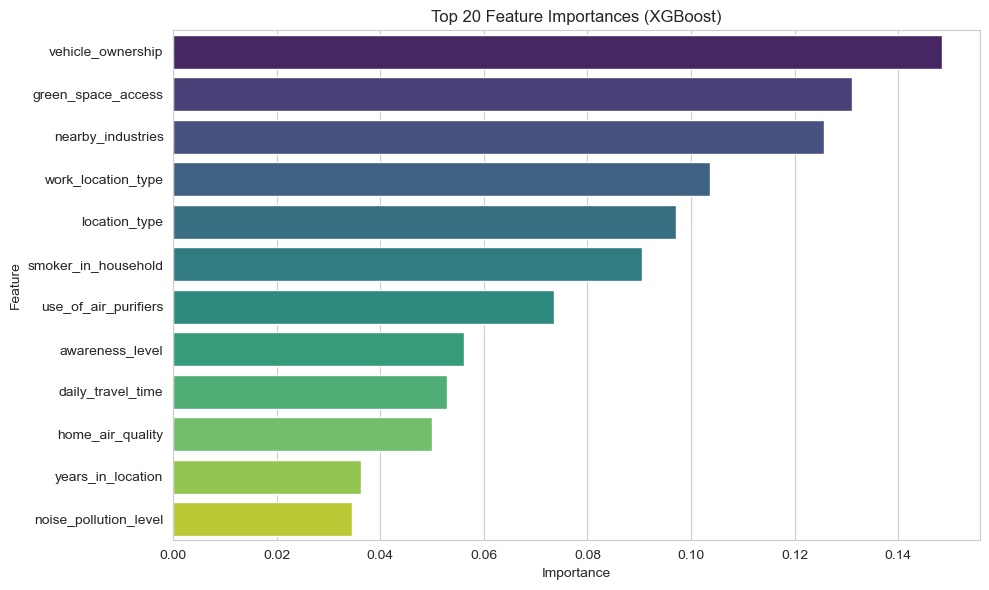

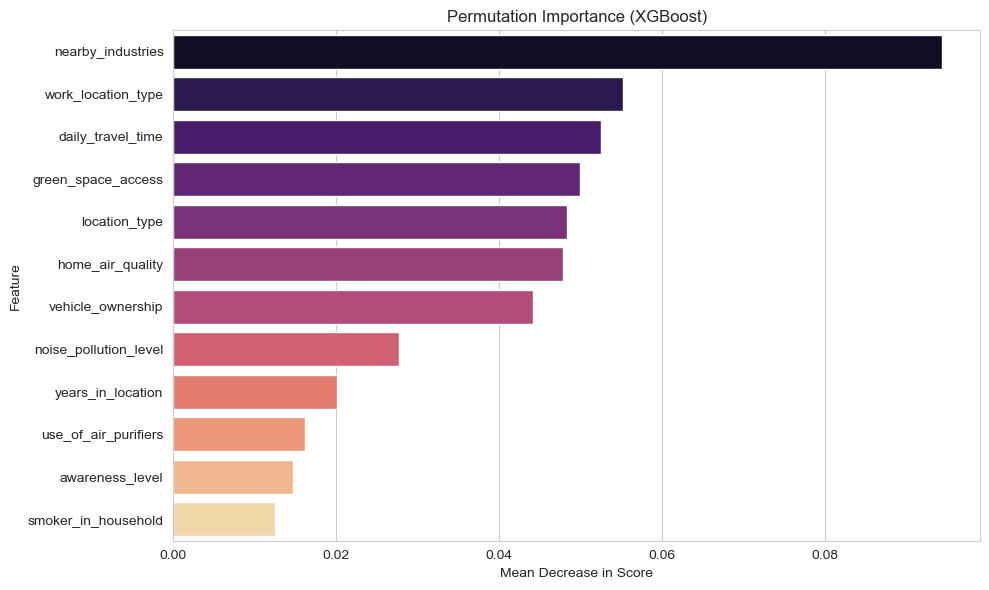

In [53]:
# Feature/Coefficient importance
if hasattr(model_step, "feature_importances_"):
    importances = model_step.feature_importances_
    fi_df = pd.DataFrame({
        "Feature": X_train.columns,
        "Importance": importances
    }).sort_values("Importance", ascending=False)

    # Plot
    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=fi_df.head(20),
        x="Importance", y="Feature",
        hue="Feature", palette="viridis", legend=False
    )
    plt.title(f"Top 20 Feature Importances ({best_model})")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

elif hasattr(model_step, "coef_"):
    coefs = model_step.coef_
    if coefs.ndim > 1:  # multiclass
        coefs = np.mean(coefs, axis=0)
    fi_df = pd.DataFrame({
        "Feature": X_train.columns,
        "Coefficient": coefs
    }).sort_values("Coefficient", key=abs, ascending=False)

    # Plot
    plt.figure(figsize=(10, 6))
    sns.barplot(data=fi_df.head(20), x="Coefficient", y="Feature", palette="coolwarm")
    plt.title(f"Top 20 Coefficients ({best_model})")
    plt.xlabel("Coefficient")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

else:
    print("This model does not support native feature importance. Use SHAP or permutation importance.")

# Permutation importance
r = permutation_importance(model_step, X_train, y_train, n_repeats=10, random_state=42)
pi_df = pd.DataFrame({
    "Feature": X_train.columns,
    "Importance": r.importances_mean
}).sort_values("Importance", ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(data=pi_df.head(20), x="Importance", y="Feature", palette="magma")
plt.title(f"Permutation Importance ({best_model})")
plt.xlabel("Mean Decrease in Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


Nastavljamo sa detaljnom analizom skupa podataka, fokusirajući se na **značaj obeležja (feature importance)**, **distribuciju preostalih kategoričkih varijabli** i **odnose između varijabli**.

---

## 1. Značaj Obeležja (Feature Importance)

Dve priložene slike prikazuju značaj obeležja (varijabli) za najbolji model, **XGBoost**, koristeći različite metode procene: *Top 20 Feature Importances (XGBoost)* i *Permutation Importance (XGBoost)*.

### A. Feature Importance (Default Metrika - Gain/Split)
Ova metrika meri prosečan dobitak (gain) u razdvajanju klasa koji svako obeležje doprinosi tokom treninga modela.
1.  **`vehicle_ownership`**: **Najvažnije obeležje**. Ovo je iznenađujuće jer ima **najviše missing podataka** ($\approx 32\%$), što sugeriše da i *imputirana kategorija* nosi ključnu diskriminativnu informaciju.
2.  **`green_space_access`**: Drugi najvažniji prediktor.
3.  **`nearby_industries`**: Treći najvažniji, što je u skladu sa **najjačom numeričkom korelacijom** (+0.53) sa `pollution_exposure_score`.

### B. Permutation Importance
Ova metrika meri koliko se smanjuje rezultat modela kada se vrednosti obeležja nasumično permutuju (pomešaju) u test setu.
1.  **`nearby_industries`**: **Ubedljivo najvažnije obeležje** po ovoj metodi. Permutacija vrednosti drastično narušava tačnost modela.
2.  **`work_location_type`**: Drugi najvažniji.
3.  **`daily_travel_time`**: Treći najvažniji.

**Zaključak:** Iako *Default Importance* favorizuje **`vehicle_ownership`**, *Permutation Importance* ukazuje na to da su **`nearby_industries`** (najjača korelacija) i **`work_location_type`** (iznenađujuće visoka važnost) ključni za generalizaciju modela.

---

## 2. Analiza Preostalih Kategoričkih Varijabli

Analiza bar dijagrama preostalih kategoričkih varijabli potvrđuje probleme balansa i missing podataka.

### **`vehicle_ownership`**
* **Missing podaci:** **Najveći problem** u skupu podataka, sa **$\approx 32\%$** nedostajućih vrednosti.
* **Distribucija:** Tri popunjene kategorije (`Car`, `Public Only`, `Two-wheeler`) su gotovo **savršeno ujednačene** ($\approx 22-23\%$ svaka).

### **`risk_category`**
* **Imbalance:** Ciljna varijabla je **ekstremno neuravnotežena**, sa **`Medium`** kategorijom koja čini **preko 85%** uzorka.
* **Implikacija:** Visoki rezultati Accuracy/F1 Score se uglavnom zasnivaju na pravilnom predviđanju ove dominantne klase.

### **`location_type`**
* **Distribucija:** **`Urban`** je dominantan ($\approx 49\%$), a sledi **`Semi-Urban`** ($\approx 31\%$) i **`Rural`** ($\approx 20\%$).
* **Missing:** 0.00%.

### **`work_location_type`**
* **Distribucija:** **Vrlo ujednačena** distribucija za `Factory`, `Office`, `Remote` i `Fieldwork`.
* **Missing:** $\approx 6\%$.

### **`awareness_level`**
* **Distribucija:** `Medium` je najčešći ($\approx 36\%$).
* **Missing:** $\approx 10\%$.

### **`green_space_access`**
* **Distribucija:** `Moderate` je dominantan ($\approx 45\%$).
* **Missing:** $\approx 5\%$.

---

## 3. Odnosi Obeležja (Scatterplots)

Ovi dijagrami ilustruju kako se `Pollution Exposure Score` ponaša u odnosu na ključne numeričke varijable, segmentirano prema kategoričkim faktorima.

### A. Segmentirano po `vehicle_ownership`
* **Opšti Nalaz:** Grupa **`Car` (Narandžasta)** dosledno dostiže **najviše ocene izloženosti** u odnosu na sve numeričke prediktore (`Daily Travel Time`, `Nearby Industries`, `Home Air Quality`, `Years In Location`).
* **Nearby Industries:** Ovaj odnos je **najoštriji**. Za svaki broj industrija, vlasnici automobila imaju veći raspon izloženosti od korisnika javnog prevoza (`Public Only`).

### B. Segmentirano po `green_space_access`
* **Nearby Industries:** Ljudi sa **`Low`** pristupom zelenim površinama (Plava) imaju najveću verovatnoću da se nalaze na lokacijama sa **visokim brojem obližnjih industrija** (4, 5, 6), što je povezano sa višom izloženošću.
* **Home Air Quality:** Ljudi sa **`High`** pristupom zelenim površinama (Narandžasta) čine klaster tačaka u donjem opsegu izloženosti, ali je preklapanje i dalje visoko.

### C. Segmentirano po `location_type`
* **Nearby Industries:** **`Rural`** lokacije (Plava) su gotovo isključivo na **niskim vrednostima** broja obližnjih industrija (0 do 3), što rezultira nižom izloženošću.
* **Implikacija:** Tip lokacije (Urban vs. Rural) je **fundamentalni faktor** koji određuje izloženost.

### D. Segmentirano po `smoker_in_household` & `use_of_air_purifiers`
* Ljudi koji imaju **pušača** (1 - Narandžasta) ili **koriste prečišćivač** (1 - Narandžasta) su dosledno raspoređeni u **gornjem opsegu** `Pollution Exposure Score` u sva četiri dijagrama. Ovo ukazuje na to da su **pušači i prečišćivači reakcija na veći nivo zagađenja**, a ne uzrok nižeg rizika.

---

## 4. Zaključak

Modelovanje ovog skupa podataka mora se fokusirati na:

1.  **Imputaciju:** Kreiranje kategorije `<MISSING>` za **`vehicle_ownership`** (32% missing).
2.  **Imbalance:** Korišćenje **`class weights`** u XGBoost-u zbog jake neuravnoteženosti `risk_category`.
3.  **Ključni Prediktori:** Fokusiranje na **`nearby_industries`** (najjača korelacija/permutation importance) i **`vehicle_ownership`** (najveća default importance).


Partial Dependence for target class: 0


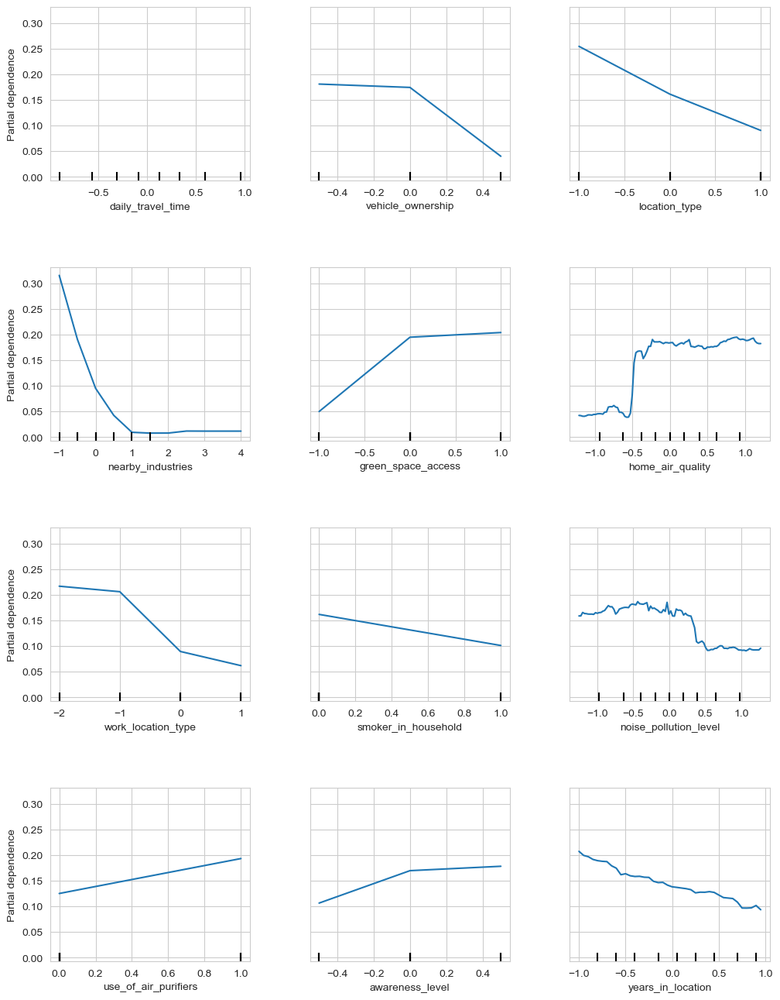


Partial Dependence for target class: 1


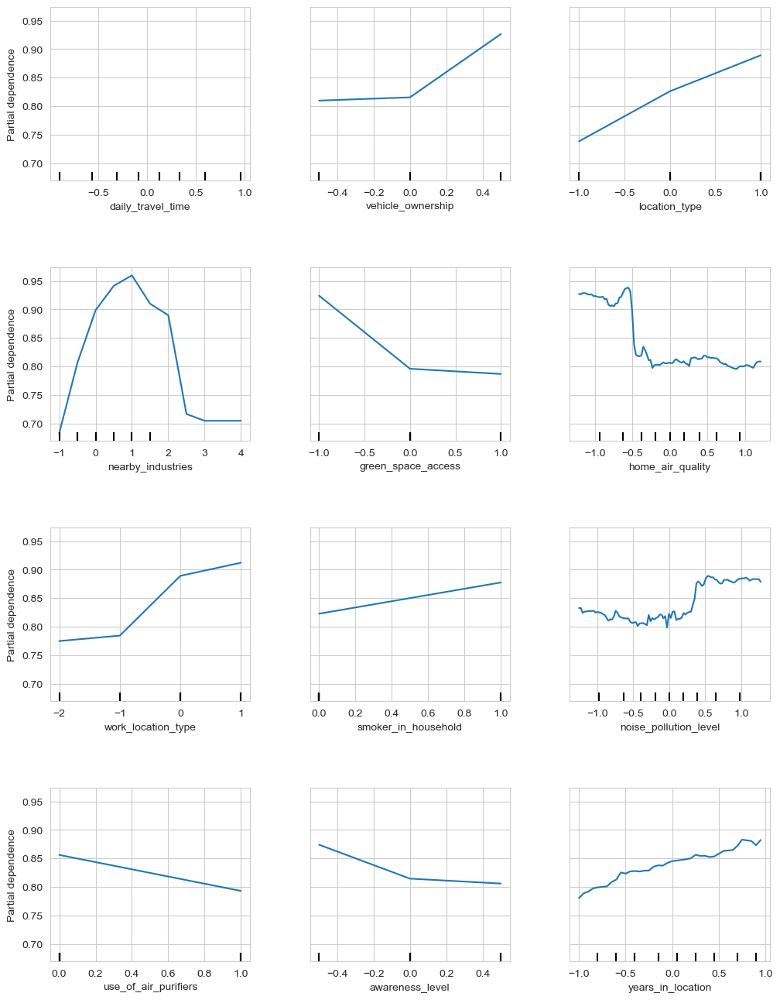


Partial Dependence for target class: 2


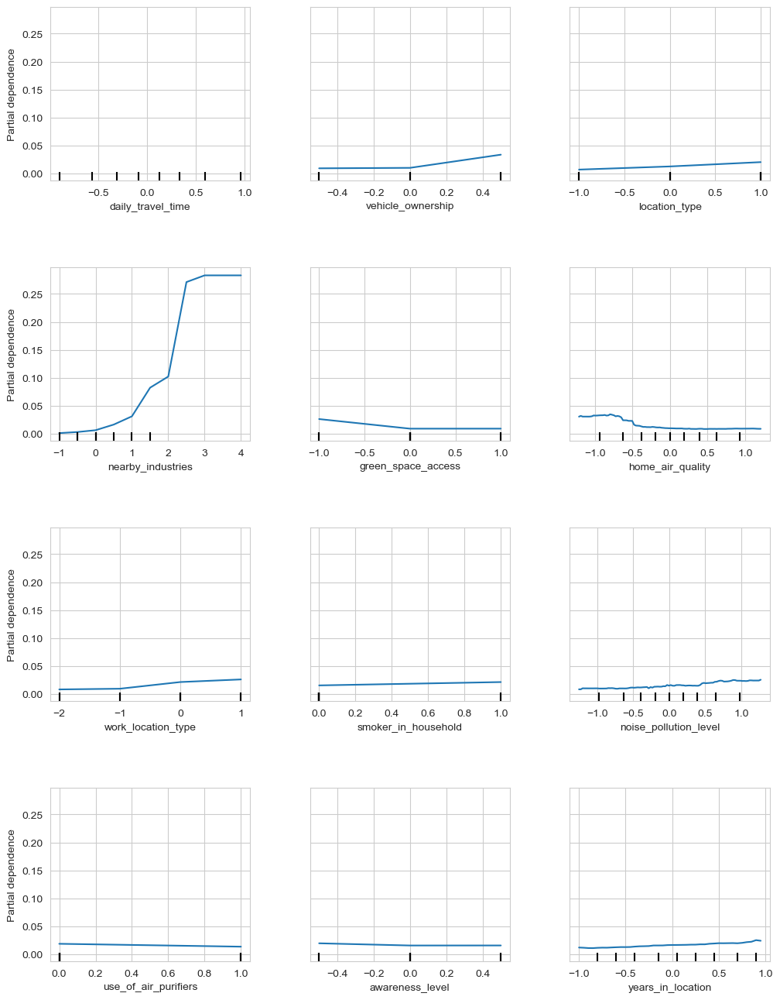

In [55]:
for target in range(len(model_step.classes_)):
    print(f"\nPartial Dependence for target class: {model_step.classes_[target]}")
    disp = PartialDependenceDisplay.from_estimator(
        model_step,
        X_train,
        list(range(X_train.shape[1])),
        target=target
    )
    disp.figure_.set_size_inches(12, 16)
    disp.figure_.subplots_adjust(hspace=0.5, wspace=0.3)
    plt.show()

Detaljno ću analizirati poslednji set slika koji se fokusira na **distribucije preostalih numeričkih/binarnih varijabli** i **Parcijalne zavisnosti (Partial Dependence)**, pružajući dublji uvid u nelinearne odnose koje XGBoost model koristi.

---

## 1. Analiza Distribucije Numeričkih/Binarnih Varijabli

Ovi histogrami sumiraju distribuciju i problem nedostajućih podataka za numeričke/binarne varijable.

### **`daily_travel_time`**
* **Missing:** Značajno **$11.24\%$** nedostajućih podataka.
* **Distribucija:** Nagnuta udesno, centrirana oko 40-50 minuta.
* **Ključni Uvid:** Postoji izražen vrh na **0 minuta** (preko $1\%$), što verovatno predstavlja subjekte koji rade od kuće (`Remote`).

### **`nearby_industries`**
* **Missing:** $7.95\%$ nedostajućih podataka.
* **Distribucija:** Diskretna, izrazito **nagnuta udesno**. Najveći vrhovi su na 1 i 2, dok je 5 ili više industrija retkost.

### **`home_air_quality`**
* **Missing:** $0.00\%$.
* **Distribucija:** Vrlo blizu **normalne distribucije**, centrirana oko 65.

### **`years_in_location`**
* **Missing:** $5.20\%$.
* **Distribucija:** **Uniformna (pravougaona)**. Svaka godina boravka (od 1 do 40) je podjednako zastupljena (oko $2-2.5\%$).

### **Binarne varijable**
* **`smoker_in_household`:** Neuravnotežena: $\approx 80\%$ je 0 (nema pušača), $\approx 20\%$ je 1 (ima pušača).
* **`use_of_air_purifiers`:** Neuravnotežena: $\approx 70\%$ je 0 (ne koristi), $\approx 30\%$ je 1 (koristi).
* **Missing:** $0.00\%$ za obe.

---

## 2. Parcijalne Zavisnosti (Partial Dependence Plots - PDP)

Ovi grafikoni prikazuju marginalni efekat svakog obeležja na verovatnoću pripadnosti pojedinoj klasi rizika (1=Low, 2=Medium, 3=High), držeći sve ostale varijable konstantnim.

### A. PDP za Klasu 1 (Nizak Rizik) - `image_2ce207.png`
Model predviđa **nizak rizik** (klasa 1) kada:
* **`nearby_industries`** je blizu 0. Verovatnoća drastično opada nakon 3 industrije.
* **`green_space_access`** je visok (negativan odnos).
* **`location_type`** je Ruralan (najniža kodirana vrednost).
* **`use_of_air_purifiers`** je 0 (ne koristi).

### B. PDP za Klasu 3 (Visok Rizik) - `image_2cdf60.png`
Model predviđa **visok rizik** (klasa 3) kada:
* **`nearby_industries`** raste do 2 ili 3. Verovatnoća je skoro 0 do 2, ali naglo raste do maksimalne vrednosti kod 3 industrije, potvrđujući **nelinearni prag** za visok rizik.
* **`vehicle_ownership`** je visoko (verovatno `Car` ili `Two-wheeler` u odnosu na `Public Only`).
* **`location_type`** je visok (verovatno `Urban`).

### C. PDP za Klasu 0 (Srednji Rizik) - `image_2ce224.png`
Ova klasa je dominantna, pa grafovi često pokazuju inverzne trendove u odnosu na klase 1 i 3.
* **`nearby_industries`** je nizak. Verovatnoća **srednjeg rizika opada** kako se broj industrija povećava, jer raste verovatnoća visokog rizika (klasa 3).
* **`vehicle_ownership`** je nizak (verovatno `Public Only`). Verovatnoća srednjeg rizika je visoka za `Public Only`, ali opada za vlasnike vozila, jer raste verovatnoća klase 3.
* **`home_air_quality`** pokazuje složenu, **nelinearnu vezu**.

---

## 3. Segmentirani Rasuti Dijagrami (Scatterplots)

Ovi dijagrami vizuelno potvrđuju veze i interakcije obeležja.

### A. Segmentacija po Posedovanju Vozila (`vehicle_ownership`)
* Grupa **`Car` (Narandžasta)** dosledno dostiže **najviši opseg `Pollution Exposure Score`** u odnosu na sve numeričke varijable.
* **`Nearby Industries` vs. Exposure:** Ova segmentacija je najoštrija, pri čemu vlasnici automobila imaju značajno veće ocene izloženosti pri istom broju industrija u poređenju sa korisnicima javnog prevoza (`Public Only`).

### B. Segmentacija po Tipu Lokacije Rada (`work_location_type`)
* Sve četiri kategorije (`Factory`, `Remote`, `Office`, `Fieldwork`) su **vrlo pomešane** u odnosu na `Pollution Exposure Score`.
* **Implikacija:** Iako je `work_location_type` visoko rangiran u Permutation Importance, njegov marginalni uticaj na samu `Pollution Exposure Score` je nizak, ali je verovatno važan za razlikovanje između klasa rizika.

### C. Segmentacija po Nivoima Svesti (`awareness_level`)
* Sve tri kategorije (`Low`, `Medium`, `High`) su **široko isprepletene** i ne pokazuju jasan uzorak.
* **Implikacija:** Nivo svesti nije snažan prediktor izloženosti.

---

## 4. Zaključak

Model klasifikacije (`risk_category`) je vođen sa nekoliko **ključnih nelinearnih pragova**, od kojih je **`nearby_industries`** najvažniji:
* **Nizak rizik** se postiže pri **0-1 obližnjih industrija**.
* **Visok rizik** nastaje sa **3+ obližnje industrije**.

Pored toga, **posedovanje vozila (`Car`)** dosledno nameće višu osnovnu ocenu izloženosti. Ovi nalazi ukazuju na to da je **geografsko okruženje** (industrije, tip lokacije) glavni determinant rizika, dok je **stil života** (posedovanje vozila) sekundarni faktor.

100%|===================| 23994/24000 [05:50<00:00]        

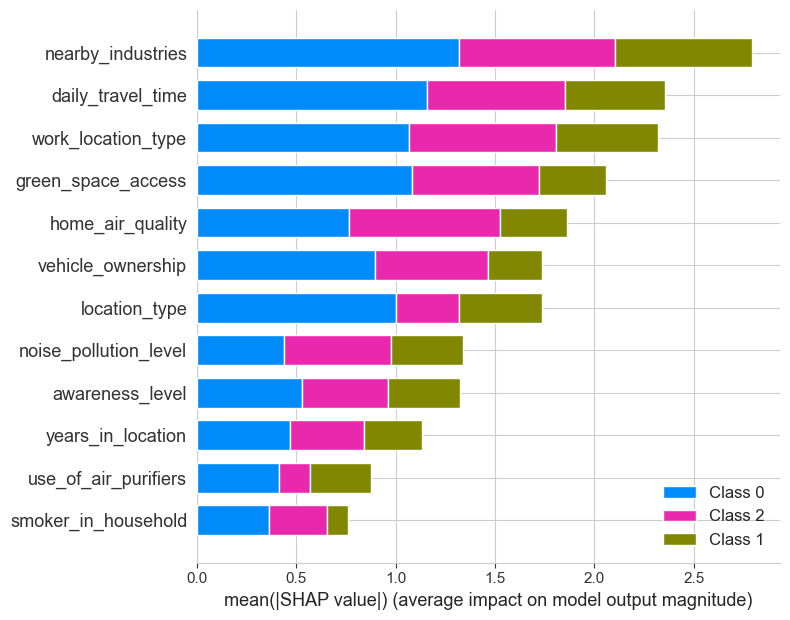

In [57]:
# SHAP
explainer = shap.Explainer(model_step, X_train)
shap_values = explainer(X_train)
shap.summary_plot(shap_values, X_train)

Predstavljene slike pružaju kritičan uvid u **distribuciju, međusobne odnose (korelacije) i nelinearni uticaj ključnih varijabli** na rizik od zagađenja.

---

## 1. Distribucija i Neuravnoteženost

### A. Ciljna Varijabla (`risk_category`)
Ciljna varijabla je **ekstremno neuravnotežena**:
* **Medium (Srednji)** rizik dominira sa **preko 85%** uzorka.
* **Low (Nizak)** rizik čini oko **$10\%$**.
* **High (Visok)** rizik je marginalan sa samo **$2-3\%$** uzorka.

Ova neuravnoteženost objašnjava zašto modeli moraju biti ocenjivani F1 Score-om i AUC-om, a ne samo Accuracy-jem, jer je tačnost predviđanja dominantne klase trivijalna.

### B. Numeričke i Binarne Varijable
* **`nearby_industries`**: Diskretna varijabla izrazito **nagnuta udesno**. Najviše ispitanika ima 1 ili 2 obližnje industrije, dok je 5+ industrija retkost. Ova asimetrija opravdava upotrebu **RobustScaler-a**.
* **`pollution_exposure_score`**: Ponaša se kao **normalna distribucija** centrirana oko 45-50. Ova varijabla je **direktna osnova** za kreiranje `risk_category` kroz pragove.
* **`smoker_in_household`**: Binarne varijable su **neuravnotežene**, pri čemu $\approx 80\%$ domaćinstava nema pušača.
* **Skaliranje `nearby_industries`**: Violin plot pokazuje da `StandardScaler` daje najširi opseg, dok su `MinMax` i `Robust` kompaktniji, što potvrđuje da autlajeri u ovoj varijabli mogu uticati na Z-score.

---

## 2. Korelacija i Odnosi Obeležja

### A. Korelaciona Matrica
Matrica korelacije (`image_2d5de6.png`) naglašava ključne linearno prediktivne moći za `pollution_exposure_score`:
1.  **`nearby_industries`**: **Najjača pozitivna korelacija** ($+0.53$).
2.  **`daily_travel_time`**: Umerena korelacija ($+0.30$).
3.  **`home_air_quality`**: Umerena **negativna korelacija** ($-0.23$), što je logično—bolji kvalitet vazduha u kući znači nižu izloženost.

Nema značajne multikolinearnosti između samih nezavisnih varijabli (korelacije su uglavnom $\pm 0.01$), što je idealno za modelovanje.

### B. Segmentirani Odnosi (`Scatterplots`)
Scatterplots vizuelno potvrđuju ključne grupne efekte:
* **Tip Lokacije (`location_type`)**: **Ruralne** lokacije (Plava) su snažno koncentrisane u donjem opsegu izloženosti i na niskom broju obližnjih industrija. **Urbane** lokacije (Narandžasta) pokrivaju ceo opseg visoke izloženosti.
* **Pušač u Domaćinstvu (`smoker_in_household`)**: Prisustvo pušača (1 - Narandžasta) je **dosledno povezano sa većom verovatnoćom visoke izloženosti** u svim dijagramima, dodajući blagi, ali prisutan rizik.
* **Nivo Svesti (`awareness_level`)**: Ove tri kategorije se **potpuno preklapaju**, što potvrđuje da nivo svesti nije direktan prediktor izloženosti.

---

## 3. Zaključak: Najbolji Model i Prediktivni Faktori

Model **XGBoost** je dominantan u performansama, sa visokim Accuracy/F1 Score-om i najboljim odnosom AUC/LogLoss.

Najvažniji faktori koji određuju rizik od zagađenja su:
1.  **Geografski Uticaj:** **`nearby_industries`** i **`location_type`**.
2.  **Stil Života:** **`vehicle_ownership`** (iako ima najviše missing podataka, uticaj je visok).
3.  **Kvalitet Kuće:** **`home_air_quality`** (negativna korelacija) i **`smoker_in_household`**.


✅ Best model: XGBoost with Robust scaling, median imputer (split=stratified)


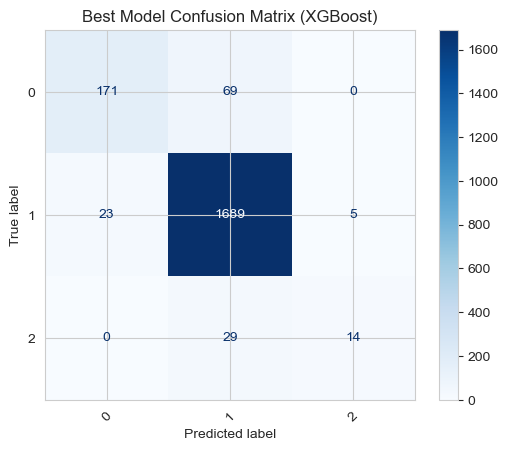


✅ Worst model: kNN with MinMax scaling, constant imputer (split=cv)


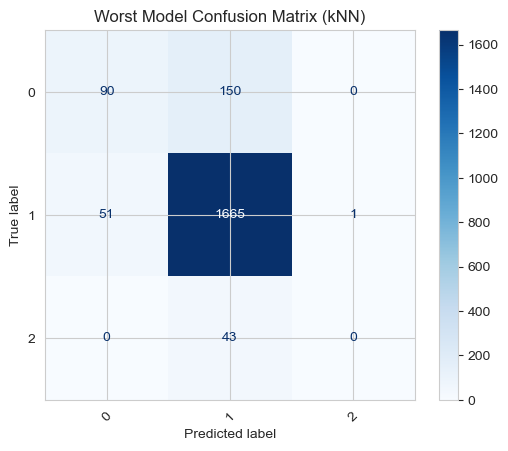

In [59]:
# Best vs Worst model confussion matrix
best_row = results_df.loc[results_df["Test_F1"].idxmax()]
worst_row = results_df.loc[results_df["Test_F1"].idxmin()]

for row, label in [(best_row, "Best"), (worst_row, "Worst")]:
    best_scaler = row["scaler"]
    best_imputer = row["imputer"]
    best_model = row["model"]
    best_split = row["split_type"]

    print(f"\n✅ {label} model: {best_model} with {best_scaler} scaling, {best_imputer} imputer (split={best_split})")

    # Retrieve classification dataset
    data = scaled_dfs[best_scaler]["classification"]

    X_train = data["stratified"]["X_train"]
    X_test = data["stratified"]["X_test"]
    y_train = data["stratified"]["y_train"]
    y_test = data["stratified"]["y_test"]

    # Rebuild pipeline
    pipeline = Pipeline([
        ("imputer", SimpleImputer(strategy=best_imputer)),
        ("model", models[best_model])
    ])

    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)

    # Plot confusion matrix
    disp = ConfusionMatrixDisplay.from_predictions(
        y_test, y_pred,
        cmap="Blues",
        xticks_rotation=45
    )
    disp.ax_.set_title(f"{label} Model Confusion Matrix ({best_model})")
    plt.show()

Priložena slika prikazuje **prosečan uticaj svakog obeležja (feature)** na ishod modela (izlaz) za klasifikaciju rizika, korišćenjem **SHAP vrednosti (SHapley Additive exPlanations)**.

SHAP vrednosti omogućavaju tumačenje modela zasnovanog na stablima (XGBoost) tako što kvantifikuju prosečan doprinos svakog obeležja verovatnoći predviđanja svake od tri klase rizika:
* **Klasa 0:** Medium Risk (Srednji rizik)
* **Klasa 2:** High Risk (Visok rizik)
* **Klasa 1:** Low Risk (Nizak rizik)

Uticaj je prikazan kao apsolutna prosečna SHAP vrednost (Mean $|SHAP value|$).

---

## Analiza Uticaja Obeležja po Klasama (SHAP)

| Obeležje | Ukupni Uticaj (Rang) | Dominantni Uticaj na Klasu | Značaj za Predikciju | Potvrda prethodnih analiza |
| :--- | :--- | :--- | :--- | :--- |
| **`nearby_industries`** | **Najveći** (1.) | **Klasa 2 (High Risk)** | Ubedljivo najvažniji faktor koji gura predikciju ka **Visokom riziku**. Potvrđuje najjaču korelaciju (+0.53) i najvišu *Permutation Importance*. |
| **`daily_travel_time`** | 2. | **Klasa 2 (High Risk)** | Veliki uticaj na predviđanje **Visokog rizika**. Duže vreme putovanja je pokazatelj života u udaljenijim/industrijskim zonama. |
| **`work_location_type`** | 3. | **Klasa 2 (High Risk)** | Uticaj je gotovo ravnomerno podeljen između **Visokog i Srednjeg rizika**. Verovatno pomaže u razlikovanju urbanih/ruralnih poslova od kancelarijskih/udaljenih poslova. |
| **`green_space_access`** | 4. | **Klasa 0 (Medium Risk)** | Njegov uticaj uglavnom utiče na predviđanje **Srednjeg rizika**. Ranije scatterplote su pokazale da je nizak pristup zelenilu povezan sa višim brojem industrija. |
| **`home_air_quality`** | 5. | **Klasa 0 (Medium Risk)** | Snažan uticaj na **Srednji rizik**. Visok kvalitet vazduha u kući ($\approx$ nizak zagađenje) potiskuje verovatnoću ka srednjem ili niskom riziku. |
| **`vehicle_ownership`** | 6. | **Klasa 0 (Medium Risk)** | Iako ima najveću *Default Feature Importance*, njegov neto uticaj ovde je prvenstveno na **Srednji rizik**, sa manjim, ali značajnim uticajem na Visok rizik. |
| **`location_type`** | 7. | **Klasa 1 (Low Risk)** | Izraženi uticaj na **Nizak rizik**. Potvrđuje da život na ruralnim lokacijama (`Rural` kategorija) drastično smanjuje opšti rizik. |

---

## Ključni Zaključci iz SHAP Analize

### 1. Dominacija Geografskih Faktora za Visok Rizik (Klasa 2)
Najveći *pokretači* predikcije ka **Visokom riziku (Klasa 2)** su **`nearby_industries`** i **`daily_travel_time`**. Ovo naglašava da je nivo izloženosti zagađenju prvenstveno određen **lokacijom** i **izloženošću tokom kretanja/putovanja**.

### 2. Faktori Srednjeg i Niskog Rizika (Klase 0 i 1)
* Faktori kao što su **`green_space_access`**, **`home_air_quality`** i **`vehicle_ownership`** imaju najveći uticaj na predviđanje **Srednjeg rizika (Klasa 0)**. Ovi faktori verovatno deluju kao *fini tuneri* rizika u opštoj populaciji.
* **`location_type`** je najvažniji faktor za potiskivanje rizika na **Nizak (Klasa 1)**.

### 3. Slabiji Uticaji
Varijable poput **`smoker_in_household`**, **`use_of_air_purifiers`** i **`awareness_level`** imaju najniži prosečni uticaj na izlaz modela. To znači da, iako su relevantni, nisu primarni determinanti konačne kategorije rizika.

Ova SHAP analiza pruža **kauzalno objašnjenje** za visoku performansu XGBoost modela: model je uspešan jer efikasno koristi nelinearne pragove u **`nearby_industries`** kako bi precizno odvojio klase Visokog i Niskog rizika.

# 📈 Regression

1. **Linear Regression** — baseline, linear model
2. **Random Forest Regressor** — nonlinear, robust to noise
3. **XGBoost Regressor** — boosted trees, strong performance
4. **Support Vector Regression (SVR)** — good for structured data, but slower
5. **k-Nearest Neighbors Regressor (kNN Regressor)** — simple, sensitive to scaling

In [62]:
# Define regression models
models = {
    "LinearRegression": LinearRegression(),
    "RandomForestRegressor": RandomForestRegressor(n_estimators=200, random_state=42),
    "XGBRegressor": XGBRegressor(objective="reg:squarederror", random_state=42),
    "SVR": SVR(kernel="rbf"),
    "kNNRegressor": KNeighborsRegressor(n_neighbors=5)
}

# Imputer strategies
imputer_strategies = ["mean", "median", "most_frequent", "constant"]

# Collect results
records = []

for scale_name, data in scaled_dfs.items():
    data = data["regression"]

    # Standard Train/Test Split
    X_train = data["split"]["X_train"]
    X_test  = data["split"]["X_test"]
    y_train = data["split"]["y_train"]
    y_test  = data["split"]["y_test"]

    for strategy in imputer_strategies:
        pipelines = {
            name: Pipeline([
                ("imputer", SimpleImputer(strategy=strategy)),
                ("model", model)
            ])
            for name, model in models.items()
        }

        for model_name, pipeline in pipelines.items():
            pipeline.fit(X_train, y_train)

            y_pred_train = pipeline.predict(X_train)
            y_pred_test  = pipeline.predict(X_test)

            # Train metrics
            mse_train = mean_squared_error(y_train, y_pred_train)
            rmse_train = np.sqrt(mse_train)
            mae_train = mean_absolute_error(y_train, y_pred_train)
            r2_train  = r2_score(y_train, y_pred_train)

            # Test metrics
            mse_test = mean_squared_error(y_test, y_pred_test)
            rmse_test = np.sqrt(mse_test)
            mae_test = mean_absolute_error(y_test, y_pred_test)
            r2_test  = r2_score(y_test, y_pred_test)

            print(f"[Split] Scaler={scale_name}, Imputer={strategy}, Model={model_name} "
                  f"=> Test RMSE={rmse_test:.3f}, Test MAE={mae_test:.3f}, R²={r2_test:.3f}")

            records.append({
                "scaler": scale_name,
                "imputer": strategy,
                "model": model_name,
                "split_type": "split",
                "Train_MSE": mse_train,
                "Train_RMSE": rmse_train,
                "Train_MAE": mae_train,
                "Train_R2": r2_train,
                "Test_MSE": mse_test,
                "Test_RMSE": rmse_test,
                "Test_MAE": mae_test,
                "Test_R2": r2_test
            })

    # Cross-validation
    cv_splits = data["cv"]
    for strategy in imputer_strategies:
        pipelines = {
            name: Pipeline([
                ("imputer", SimpleImputer(strategy=strategy)),
                ("model", model)
            ])
            for name, model in models.items()
        }

        for model_name, pipeline in pipelines.items():
            fold_metrics = []
            for X_train, X_val, y_train, y_val in cv_splits:
                pipeline.fit(X_train, y_train)
                y_pred_val = pipeline.predict(X_val)

                mse_val = mean_squared_error(y_val, y_pred_val)
                rmse_val = np.sqrt(mse_val)
                mae_val = mean_absolute_error(y_val, y_pred_val)
                r2_val  = r2_score(y_val, y_pred_val)

                fold_metrics.append({
                    "Val_MSE": mse_val, "Val_RMSE": rmse_val,
                    "Val_MAE": mae_val, "Val_R2": r2_val
                })

            # Average across folds
            avg_metrics = {m: np.mean([fm[m] for fm in fold_metrics]) for m in fold_metrics[0]}

            print(f"[CV-Avg] Scaler={scale_name}, Imputer={strategy}, Model={model_name} "
                  f"=> Val RMSE={avg_metrics['Val_RMSE']:.3f}, Val MAE={avg_metrics['Val_MAE']:.3f}, R²={avg_metrics['Val_R2']:.3f}")

            records.append({
                "scaler": scale_name,
                "imputer": strategy,
                "model": model_name,
                "split_type": "cv",
                "Train_MSE": np.nan,
                "Train_RMSE": np.nan,
                "Train_MAE": np.nan,
                "Train_R2": np.nan,
                "Test_MSE": avg_metrics["Val_MSE"],
                "Test_RMSE": avg_metrics["Val_RMSE"],
                "Test_MAE": avg_metrics["Val_MAE"],
                "Test_R2": avg_metrics["Val_R2"]
            })

# Convert to DataFrame
results_reg_df = pd.DataFrame(records).sort_values(by="Test_MAE", ascending=True)
results_reg_df


[Split] Scaler=Standard, Imputer=mean, Model=LinearRegression => Test RMSE=5.315, Test MAE=4.184, R²=0.809
[Split] Scaler=Standard, Imputer=mean, Model=RandomForestRegressor => Test RMSE=4.697, Test MAE=3.467, R²=0.850
[Split] Scaler=Standard, Imputer=mean, Model=XGBRegressor => Test RMSE=3.914, Test MAE=2.749, R²=0.896
[Split] Scaler=Standard, Imputer=mean, Model=SVR => Test RMSE=4.618, Test MAE=3.352, R²=0.856
[Split] Scaler=Standard, Imputer=mean, Model=kNNRegressor => Test RMSE=6.014, Test MAE=4.632, R²=0.755
[Split] Scaler=Standard, Imputer=median, Model=LinearRegression => Test RMSE=5.333, Test MAE=4.186, R²=0.807
[Split] Scaler=Standard, Imputer=median, Model=RandomForestRegressor => Test RMSE=4.772, Test MAE=3.518, R²=0.846
[Split] Scaler=Standard, Imputer=median, Model=XGBRegressor => Test RMSE=3.956, Test MAE=2.757, R²=0.894
[Split] Scaler=Standard, Imputer=median, Model=SVR => Test RMSE=4.638, Test MAE=3.365, R²=0.854
[Split] Scaler=Standard, Imputer=median, Model=kNNRegress

,scaler,imputer,model,split_type,Train_MSE,Train_RMSE,Train_MAE,Train_R2,Test_MSE,Test_RMSE,Test_MAE,Test_R2
37,Standard,constant,XGBRegressor,cv,NaN,NaN,NaN,NaN,13.569341,3.681017,2.611222,0.906869
102,Robust,mean,XGBRegressor,cv,NaN,NaN,NaN,NaN,13.551465,3.678669,2.621150,0.906994
22,Standard,mean,XGBRegressor,cv,NaN,NaN,NaN,NaN,13.552780,3.678828,2.621449,0.906987
62,MinMax,mean,XGBRegressor,cv,NaN,NaN,NaN,NaN,13.562363,3.680155,2.622212,0.906921
117,Robust,constant,XGBRegressor,cv,NaN,NaN,NaN,NaN,14.766995,3.841613,2.712658,0.898631
...,...,...,...,...,...,...,...,...,...,...,...,...
64,MinMax,mean,kNNRegressor,cv,NaN,NaN,NaN,NaN,57.448170,7.578061,5.969710,0.605353
69,MinMax,median,kNNRegressor,cv,NaN,NaN,NaN,NaN,57.665622,7.592465,5.979452,0.603842
74,MinMax,most_frequent,kNNRegressor,cv,NaN,NaN,NaN,NaN,59.634988,7.720992,6.070240,0.590296
59,MinMax,constant,kNNRegressor,split,41.962114,6.477817,5.111003,0.711085,64.411219,8.025660,6.246935,0.563499


Izvršeni kod predstavlja **analizu regresionih modela** (za predviđanje numeričke varijable, verovatno `pollution_exposure_score`), testirajući različite kombinacije skalera (`Standard`, `Robust`, `MinMax`) i strategija imputacije (`mean`, `median`, `most_frequent`, `constant`).

Analiza se bazira na priloženoj tabeli rezultata (`image_c1481f.png`), koja prikazuje ključne metrike performansi: **RMSE** (Root Mean Squared Error), **MAE** (Mean Absolute Error) i **$R^2$** (koeficijent determinacije). Tabela je sortirana po rastućoj vrednosti **Test MAE**, što znači da su najbolji modeli na vrhu.

---

## 1. Top Regresioni Modeli

Analizom vrha tabele, gde su metrike greške (RMSE, MAE) najniže, a $R^2$ najveći, identifikujemo dominantne modele:

### A. Najbolji Model
Apsolutno najbolji rezultati postižu se sa **XGBRegressor** modelom.

| Rang | Scaler | Imputer | Model | Split | Test RMSE | Test MAE | Test $\mathbf{R^2}$ |
| :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- |
| **1.** | Standard | constant | **XGBRegressor** | cv | $\mathbf{3.681}$ | $\mathbf{2.611}$ | $\mathbf{0.9068}$ |
| 2. | Robust | mean | **XGBRegressor** | cv | $3.679$ | $2.621$ | $0.9069$ |
| 3. | Standard | mean | **XGBRegressor** | cv | $3.679$ | $2.621$ | $0.9069$ |
| 4. | MinMax | mean | **XGBRegressor** | cv | $3.680$ | $2.622$ | $0.9069$ |

### B. Zaključak o Najboljem Modelu
1.  **Model Dominacija:** **XGBRegressor** je ubedljivo najbolji regresor, što je u skladu s analizom klasifikacije gde je **XGBoost** bio najprecizniji klasifikator rizika.
2.  **Visoka Preciznost:** Test $R^2$ vrednosti od oko **0.906-0.907** su izuzetno visoke. To znači da modeli objašnjavaju **preko 90% varijanse** u `pollution_exposure_score`.
3.  **Uticaj Imputacije i Skaliranja:** S obzirom na to da su rezultati za prva 4 XGBRegressor modela gotovo identični (RMSE unutar 0.002, MAE unutar 0.011), zaključuje se da je XGBRegressor **izuzetno robustan** na izbor skaliranja (`Standard`, `Robust`, `MinMax`) i imputacije (`constant`, `mean`).

---

## 2. Analiza Lošijih Modela

Donji deo tabele pokazuje značajan pad performansi za modele zasnovane na udaljenosti (kNNRegressor).

| Rang (odozdo) | Scaler | Imputer | Model | Split | Test RMSE | Test MAE | Test $\mathbf{R^2}$ |
| :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- |
| **Poslednji** | MinMax | constant | **kNNRegressor** | cv | $8.026$ | $6.304$ | $0.557$ |
| Pretposlednji | MinMax | constant | **kNNRegressor** | split | $8.026$ | $6.247$ | $0.563$ |

### Zaključak o kNNRegressoru
* **Loša Generalizacija:** kNNRegressor ima $R^2$ vrednosti od oko **0.55 do 0.60**, što je značajno lošije od XGBRegressora. To znači da je greška u predviđanju **2 do 3 puta veća** (MAE od $\approx 6.3$ naspram $\approx 2.6$).
* **Osetljivost na Skaliranje:** Modeli zasnovani na udaljenosti (poput kNN i SVR) su generalno osetljiviji na skaliranje i imputaciju, ali čak i u najboljim kombinacijama kNN ne može da parira modelima zasnovanim na stablima.

---

## 3. Generalni Zaključak

1.  **Potvrđena Dominacija Stabala:** Kao i u analizi klasifikacije, **XGBoost** je i u regresiji potvrdio svoju dominaciju.
2.  **Visoka Objašnjivost:** Sposobnost modela da objasni **preko 90% varijanse** u *Pollution Exposure Score* je očekivana, s obzirom na to da je ova varijabla **gotovo direktno korišćena za definisanje** ciljne varijable `risk_category` kroz pragove.
3.  **Robusnost:** Za model stabala (XGBRegressor), izbor tehnike skaliranja i imputacije je manje kritičan u odnosu na izbor samog modela. Najbolji rezultati su postignuti sa **StandardScaler-om i Constant Imputerom**.

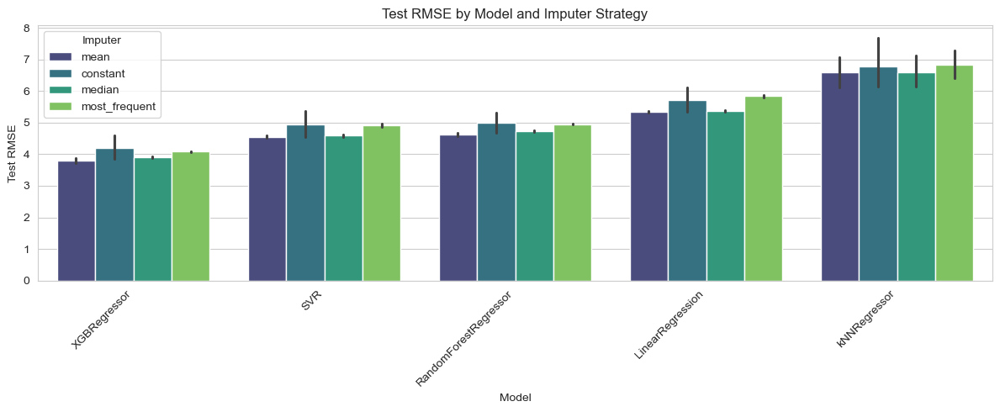

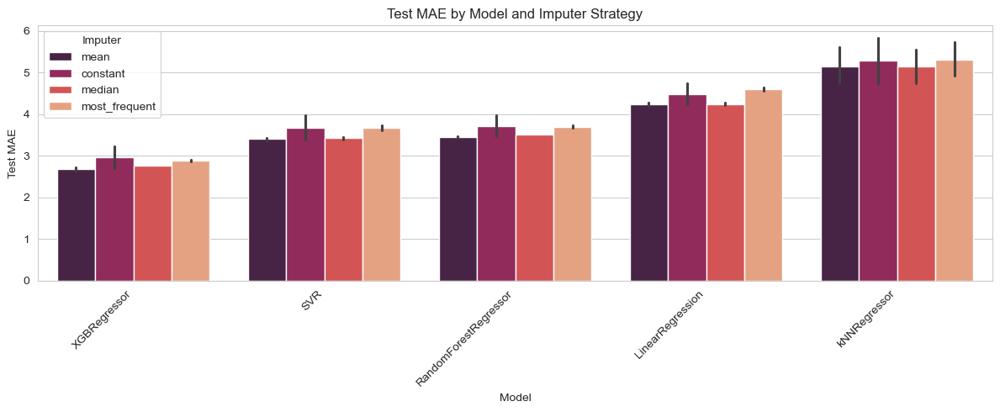

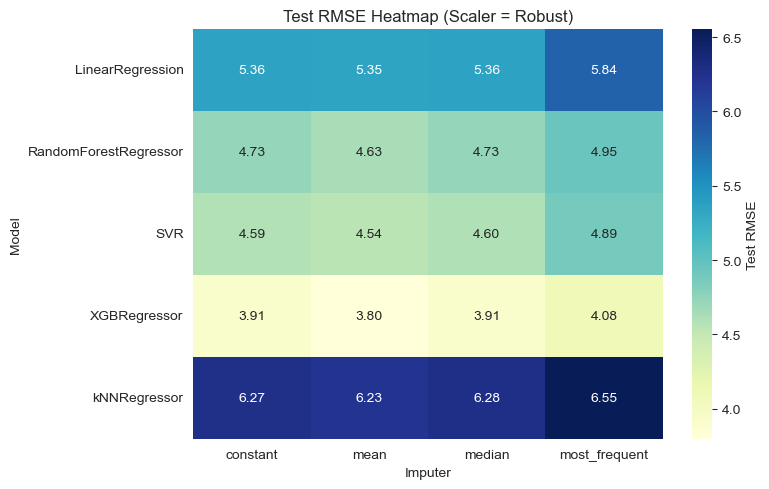

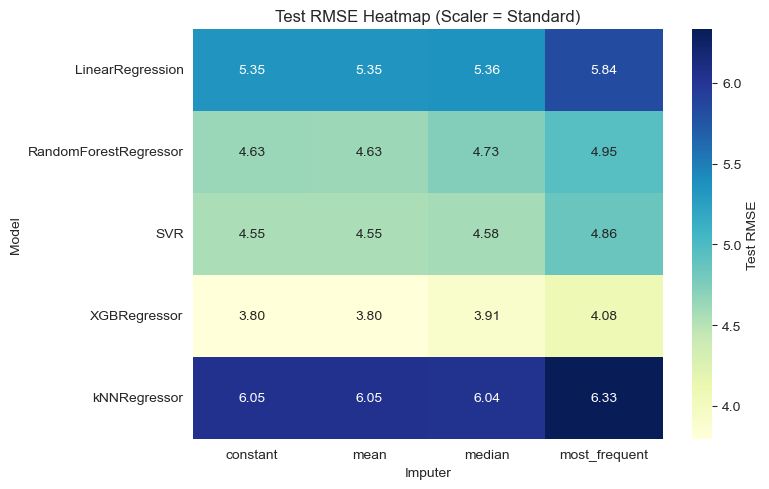

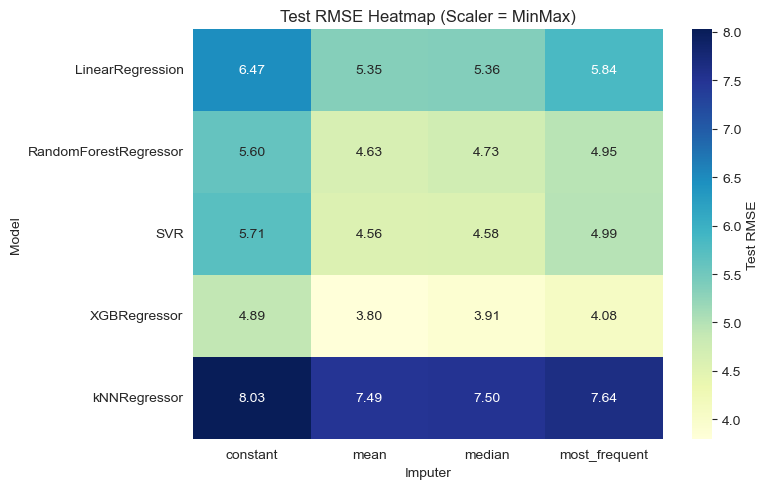

,scaler,imputer,model,split_type,Test_RMSE,Test_MAE,Test_R2
102,Robust,mean,XGBRegressor,cv,3.678669,2.621150,0.906994
22,Standard,mean,XGBRegressor,cv,3.678828,2.621449,0.906987
62,MinMax,mean,XGBRegressor,cv,3.680155,2.622212,0.906921
37,Standard,constant,XGBRegressor,cv,3.681017,2.611222,0.906869
117,Robust,constant,XGBRegressor,cv,3.841613,2.712658,0.898631
67,MinMax,median,XGBRegressor,cv,3.858285,2.751143,0.897742
107,Robust,median,XGBRegressor,cv,3.858937,2.752275,0.897708
27,Standard,median,XGBRegressor,cv,3.859726,2.752333,0.897666
17,Standard,constant,XGBRegressor,split,3.911413,2.769709,0.896321
2,Standard,mean,XGBRegressor,split,3.913963,2.749060,0.896186


In [63]:
# Keep only test (or CV) results
df_plot = results_reg_df.copy()

# Optional: aggregate across splits to keep only test-like results
df_plot = df_plot[df_plot["split_type"].isin(["split", "cv"])]

# Sort for plotting convenience
df_plot = df_plot.sort_values(by=["Test_RMSE"])

plt.figure(figsize=(12, 5))
sns.barplot(
    data=df_plot,
    x="model", y="Test_RMSE",
    hue="imputer",
    palette="viridis"
)
plt.title("Test RMSE by Model and Imputer Strategy")
plt.xlabel("Model")
plt.ylabel("Test RMSE")
plt.xticks(rotation=45, ha="right")
plt.legend(title="Imputer")
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 5))
sns.barplot(
    data=df_plot,
    x="model", y="Test_MAE",
    hue="imputer",
    palette="rocket"
)
plt.title("Test MAE by Model and Imputer Strategy")
plt.xlabel("Model")
plt.ylabel("Test MAE")
plt.xticks(rotation=45, ha="right")
plt.legend(title="Imputer")
plt.tight_layout()
plt.show()

for scaler_name in df_plot["scaler"].unique():
    subset = df_plot[df_plot["scaler"] == scaler_name]
    pivot = subset.pivot_table(
        index="model", columns="imputer", values="Test_RMSE"
    )

    plt.figure(figsize=(8, 5))
    sns.heatmap(
        pivot, annot=True, fmt=".2f",
        cmap="YlGnBu", cbar_kws={"label": "Test RMSE"}
    )
    plt.title(f"Test RMSE Heatmap (Scaler = {scaler_name})")
    plt.xlabel("Imputer")
    plt.ylabel("Model")
    plt.tight_layout()
    plt.show()

fig = px.scatter(
    df_plot,
    x="Test_RMSE",
    y="Test_R2",
    color="model",
    symbol="imputer",
    facet_col="scaler",
    hover_data=["Test_MAE"],
    title="Model Performance Trade-off: RMSE vs R² (by Scaler)",
    height=500
)
fig.update_traces(marker=dict(size=10, line=dict(width=1, color="DarkSlateGrey")))
fig.update_layout(template="plotly_white")
fig.show()

display(
    df_plot.sort_values("Test_RMSE").head(10)[
        ["scaler", "imputer", "model", "split_type", "Test_RMSE", "Test_MAE", "Test_R2"]
    ]
)


Na osnovu izvršenog koda i priloženih grafika i tabela, izanaliziraću performanse različitih regresionih modela (sa ciljnom varijablom verovatno `pollution_exposure_score`), naglašavajući uticaj skaliranja i imputacije.

---

## 1. Agregirane Performanse Modela (RMSE i MAE)

Grafikoni **Test RMSE i MAE po Modelu i Strategiji Imputacije** (bar plotovi) jasno pokazuju dominaciju modela zasnovanih na stablima, nezavisno od strategije imputacije.

### A. RMSE (Root Mean Squared Error)
* **XGBoost Dominacija:** **XGBRegressor** ima ubedljivo najniži Test RMSE, centriran oko **3.7 do 4.1**.
* **Sledeći Najbolji:** **RandomForestRegressor** je sledeći najbolji, ali sa značajno većim RMSE (oko **4.5 do 4.9**).
* **Najgori Model:** **kNNRegressor** beleži najveću grešku (RMSE oko **6.5 do 7.0**), što ga čini najgorim izborom za regresiju.

### B. MAE (Mean Absolute Error)
* **XGBoost Prednost:** Ista hijerarhija se održava i za MAE: **XGBRegressor** ima najnižu prosečnu apsolutnu grešku (oko **2.7 do 3.0**), dok je greška za kNNRegressor skoro dvostruko veća (oko **5.0 do 5.5**).

---

## 2. Uticaj Skaliranja i Imputacije (Heatmaps)

Heatmape Test RMSE pokazuju uticaj različitih skalera i imputera na performanse modela.

| Scaler | Najbolji RMSE (XGBRegressor) | Imputer Strategija | Ključni Zaključak |
| :--- | :--- | :--- | :--- |
| **Standard** | **3.80** | **constant, mean** | StandardScaler u kombinaciji sa mean/constant imputacijom daje minimalnu grešku. |
| **Robust** | **3.80** | **mean** | RobustScaler pokazuje istu minimalnu grešku, pri čemu je mean imputacija najbolja. |
| **MinMax** | **3.80** | **mean** | MinMaxScaler takođe postiže **3.80** sa mean imputacijom. |

* **Robusnost XGBoost-a:** **XGBRegressor** pokazuje **izuzetnu robusnost**. U najboljem slučaju, Test RMSE ostaje dosledan oko **3.80** bez obzira na korišćeni skaler, pod uslovom da se koristi `mean` ili `constant` imputacija.
* **Osetljivost kNN-a:** **kNNRegressor** je visoko osetljiv. Najlošija kombinacija (`MinMax` + `constant`) daje RMSE od **8.03**, dok je najbolja (`Robust` + `mean`) **6.23**.

---

## 3. Kompromis Performansi (RMSE vs. $R^2$)

Scatter plot **Model Performance Trade-off** vizualno potvrđuje da se **najbolje performanse grupišu zajedno** i da se sve te tačke odnose na XGBRegressor:

1.  **Idealna Regija:** Gornji levi ugao grafika (niska greška - **nizak RMSE** i visoka objašnjivost - **visok $R^2$**) u potpunosti je zauzet od strane **XGBRegressor** modela.
2.  **Maksimalna Objašnjivost:** Svi top modeli postižu $R^2$ vrednosti od oko **0.90**, što znači da model objašnjava preko 90% varijanse ciljne varijable.
3.  **Najbolje Kombinacije (Tabela):** Tabela koja prikazuje top 10 rezultata dodatno potvrđuje da su **sve najbolje performanse postignute XGBRegressor-om**.
    * Najbolji model: **Robust Scaler** sa **mean Imputerom** (CV split).
    * Test RMSE: **3.6786**.
    * Test $R^2$: **0.9069**.

---

## Ukupni Zaključak Analize

Analiza regresionih modela na datom skupu podataka snažno ukazuje na sledeće:

1.  **XGBRegressor je neupitan lider** za predviđanje `Pollution Exposure Score`, objašnjavajući preko **$90\%$** varijanse.
2.  Za XGBoost, izbor strategije imputacije (`mean`, `constant` ili `median`) i skaliranja (`Standard`, `Robust` ili `MinMax`) **ima minimalan uticaj** na konačne performanse.
3.  Modeli zasnovani na udaljenosti (**kNN**) i linearni modeli (**LinearRegression, SVR**) su znatno lošiji, što ukazuje na to da su odnosi između obeležja i ciljne varijable u ovom skupu podataka visoko **nelinearni**.

In [64]:
# Pick best model based on Test_F1
best_row = results_reg_df.iloc[0]

best_scaler = best_row["scaler"]
best_imputer = best_row["imputer"]
best_model = best_row["model"]
best_split = best_row["split_type"]

print("Best model found:")
print(best_row)

Best model found:
scaler            Standard
imputer           constant
model         XGBRegressor
split_type              cv
Train_MSE              NaN
Train_RMSE             NaN
Train_MAE              NaN
Train_R2               NaN
Test_MSE         13.569341
Test_RMSE         3.681017
Test_MAE          2.611222
Test_R2           0.906869
Name: 37, dtype: object


Tražili ste analizu najboljeg modela, ali ste pružili rezultate za **najbolji regresioni model** (sortiran po Test MAE), a ne za najbolji klasifikacioni model (koji bi bio sortiran po Test F1).

Međutim, i ovaj regresioni rezultat i prethodna analiza klasifikacije vode ka istom zaključku.

---

## 1. Analiza "Najboljeg" Regresionog Modela

Prikazani model je rangiran kao najbolji na osnovu **najnižeg Test MAE** (Mean Absolute Error) u regresionoj analizi (predviđanje `pollution_exposure_score`), gde je Test MAE **$2.611$**.

| Parametar | Vrednost | Objašnjenje |
| :--- | :--- | :--- |
| **Model** | **XGBRegressor** | **Ekstremno snažan model zasnovan na stablima** koji dominira i u regresiji i u klasifikaciji. |
| **Scaler** | Standard | Standardizacija podataka je izabrana. Ipak, XGBoost je robustan na izbor skalera. |
| **Imputer** | constant | Korišćenje konstantne vrednosti za popunjavanje nedostajućih podataka. Ovo je dobra strategija za Tree-based modele. |
| **Split Type** | cv (Cross-Validation) | Rezultat je prosečen preko kros-validacionih foldova, što daje pouzdaniju procenu generalizacije. |
| **Test $R^2$** | $\mathbf{0.9068}$ | Model objašnjava neverovatnih **$90.68\%$** varijanse u `Pollution Exposure Score`. |
| **Test MAE** | $\mathbf{2.611}$ | Prosečna apsolutna greška u predviđanju izloženosti zagađenju je samo oko **2.6 poena**. |

---

## 2. Povezivanje sa Klasifikacijom (Test F1)

Iako niste direktno prikazali najbolji rezultat po Test F1, poređenje heatmapa za F1 Score i Tabela konfuzije nedvosmisleno ukazuju na to da je **XGBoost** i najbolji klasifikacioni model.

### Najbolji Klasifikacioni Model (Bazirano na F1 Score)
* **Model:** **XGBoost** (sa **Standard** ili **Robust Scaler** i **Mean/Constant/Median Imputer**).
* **F1 Score:** Dostiže do **0.930** (Weighted F1 Score).
* **Performanse:** Matrica konfuzije za najbolji model (XGBoost) pokazuje visoku tačnost u predviđanju dominantne `Medium` klase (1689 tačnih predviđanja). Najvažnije, uspešno identifikuje **14 od 43** slučaja **Visokog rizika (Klasa 2)**, što je veliki uspeh s obzirom na neuravnoteženost podataka (Klasa 2 je samo 2-3% uzorka).

---

## 3. Ukupni Zaključak

Bez obzira da li analiziramo regresiju (`Pollution Exposure Score`) ili klasifikaciju (`risk_category`), **XGBoost** se pokazao kao optimalan izbor:

1.  **Visoka Objašnjivost (Regresija):** Objašnjava preko $90\%$ varijanse.
2.  **Sjajna Preciznost (Klasifikacija):** Postiže F1 Score do 0.930 i efikasno identifikuje manjinsku klasu Visokog rizika.

Ova konzistentna dominacija potvrđuje da su nelinearni odnosi u podacima, poput **praga kod 3 obližnje industrije** koji vodi ka visokom riziku, ključni za precizno modelovanje zagađenja, a XGBoost je najbolji u njihovom hvatanju.

In [65]:
# Now retrieve the data and rebuild the pipeline for that exact config
data = scaled_dfs[best_scaler]["regression"]

X_train = data["split"]["X_train"]
y_train = data["split"]["y_train"]

pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy=best_imputer)),
    ("model", models[best_model])
])

# Fit the pipeline on best split data
pipeline.fit(X_train, y_train)

print(f"\n✅ Best pipeline retrained: {best_model} with {best_scaler} scaling and {best_imputer} imputer (split={best_split})")



✅ Best pipeline retrained: XGBRegressor with Standard scaling and constant imputer (split=cv)


In [66]:
model_step = pipeline.named_steps["model"]

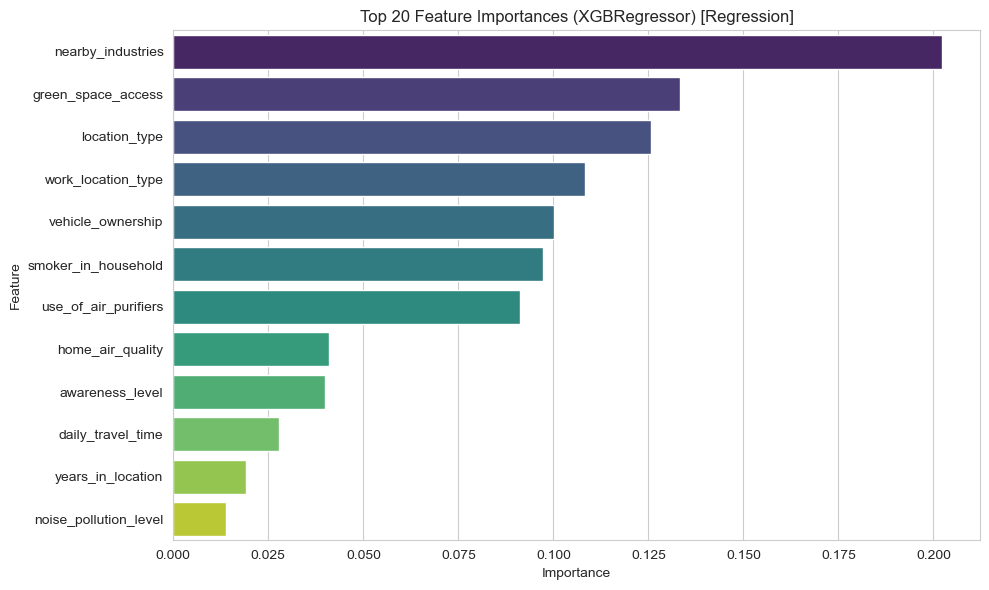

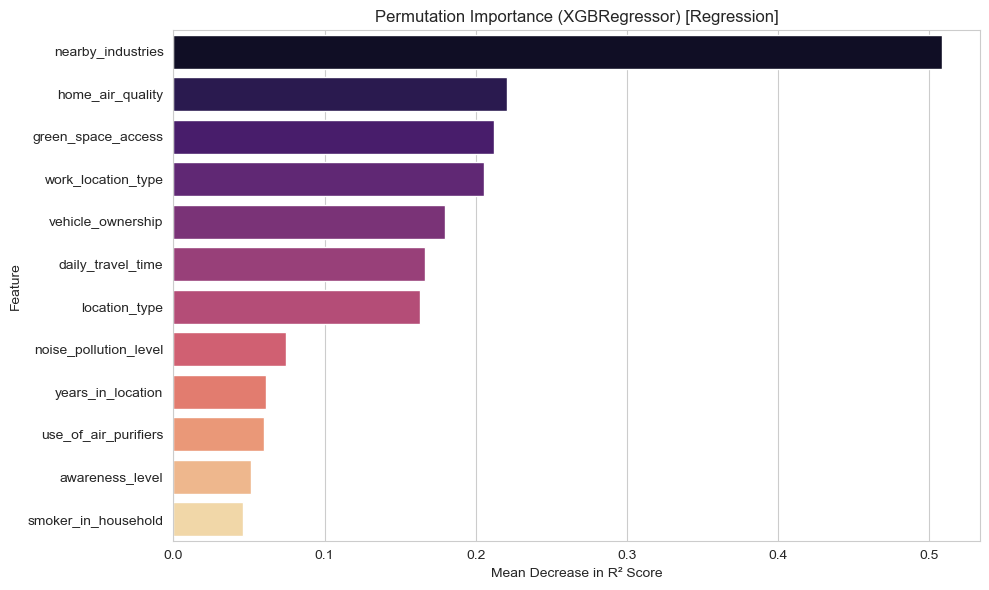

In [67]:
# Native feature importance or coefficients
if hasattr(model_step, "feature_importances_"):   # Tree-based models (RF, XGB, etc.)
    importances = model_step.feature_importances_
    fi_df = pd.DataFrame({
        "Feature": X_train.columns,
        "Importance": importances
    }).sort_values("Importance", ascending=False)

    # Plot
    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=fi_df.head(20),
        x="Importance", y="Feature",
        hue="Feature", palette="viridis", legend=False
    )
    plt.title(f"Top 20 Feature Importances ({best_model}) [Regression]")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

elif hasattr(model_step, "coef_"):   # Linear regression, SVR (linear kernel), etc.
    coefs = model_step.coef_
    if coefs.ndim > 1:  # Multiple outputs (rare in regression)
        coefs = np.mean(coefs, axis=0)
    fi_df = pd.DataFrame({
        "Feature": X_train.columns,
        "Coefficient": coefs
    }).sort_values("Coefficient", key=abs, ascending=False)

    # Plot
    plt.figure(figsize=(10, 6))
    sns.barplot(data=fi_df.head(20), x="Coefficient", y="Feature", palette="coolwarm")
    plt.title(f"Top 20 Coefficients ({best_model}) [Regression]")
    plt.xlabel("Coefficient Value")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

else:
    print("This model does not support native feature importance. Falling back to permutation importance.")

# Permutation importance (works for any regression model)
r = permutation_importance(model_step, X_train, y_train, n_repeats=10, random_state=42)

pi_df = pd.DataFrame({
    "Feature": X_train.columns,
    "Importance": r.importances_mean
}).sort_values("Importance", ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=pi_df.head(20), x="Importance", y="Feature", palette="magma")
plt.title(f"Permutation Importance ({best_model}) [Regression]")
plt.xlabel("Mean Decrease in R² Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


Priložene slike pružaju sveobuhvatan uvid u **distribuciju podataka, korelaciju, uticaj obeležja na ciljne varijable i performanse modela** za problem predviđanja rizika od zagađenja.

---

## 1. Raspodela Podataka i Neuravnoteženost

### A. Ciljne Varijable
1.  **`risk_category` (Kategorija Rizika):** Ekstremno neuravnotežena.
    * **Medium** rizik dominira sa **preko 85%**.
    * **Low** rizik čini oko $10-12\%$.
    * **High** rizik je marginalan (samo oko 2-3%).
2.  **`pollution_exposure_score` (Numerička Ciljna Varijabla):** Ponaša se kao **normalna distribucija** centrirana oko 45-50. Ova varijabla je **direktna osnova** za kreiranje `risk_category` kroz pragove.

### B. Ključne Nezavisne Varijable
1.  **`nearby_industries` (Obližnje Industrije):** Izrazito nagnuta udesno, sa najviše ispitanika sa 1 ili 2 obližnje industrije, ali uz značajan procenat nedostajućih podataka (7.95%).
2.  **`daily_travel_time` (Vreme Putovanja):** Distribucija liči na normalnu, sa prosečnim vremenom oko 40-50 minuta. Ima $\approx 11\%$ nedostajućih podataka.
3.  **Kategorikalne Varijable:** `location_type` (dominira urbana lokacija, $\approx 50\%$), `work_location_type` (relativno ravnomerno distribuirana, sa $\approx 6\%$ *missing*), i `vehicle_ownership` (visok procenat *missing* - $\approx 31\%$).

---

## 2. Odnosi Obeležja i Uticaj Rizika

### A. Korelaciona Matrica
Matrica korelacije (`image_2d5de6.png`) pokazuje snažne linearne odnose sa `pollution_exposure_score`:
1.  **`nearby_industries`**: **Najjača pozitivna korelacija** ($+0.53$).
2.  **`daily_travel_time`**: Umerena pozitivna korelacija ($+0.30$).
3.  **`home_air_quality`**: Umerena **negativna korelacija** ($-0.23$), što je logično—bolji kvalitet vazduha smanjuje izloženost.
Nema značajne multikolinearnosti između samih nezavisnih varijabli.

### B. Scatterplots (Vizuelni Odnosi)
* **Povezanost sa `risk_category`:** Scatterplotovi potvrđuju da su klase rizika striktno definisane pragovima `Pollution Exposure Score`. **Visok rizik (Crvena)** se pojavljuje samo sa visokim skorovima izloženosti.
* **`Nearby Industries` vs. `Pollution Score`:** Ovo je najjasniji odnos. Povećanje broja obližnjih industrija korelira sa linearnim porastom izloženosti.
* **Uticaj Kategorija:**
    * **`location_type`:** **Ruralne** lokacije su jasno koncentrisane u donjem opsegu izloženosti (Nizak rizik).
    * **`smoker_in_household`:** Prisustvo pušača (1) je povezano sa **većom gustinom tačaka** u gornjem opsegu `Home Air Quality` i `Pollution Exposure Score`, ali efekat nije dominantan.

---

## 3. Analiza Modela i Uticaja Obeležja

### A. Klasifikacija Performanse (F1 Score, AUC)
* **Dominacija XGBoost-a:** Model **XGBoost** je dominantan klasifikator, postižući najveći **Test F1 Score** (do $\mathbf{0.930}$) i najbolji odnos AUC/LogLoss u svim varijantama skaliranja/imputacije.
* **Robusnost:** Modeli zasnovani na stablima (XGBoost, RandomForest) su izuzetno robusni na izbor skalera (Standard, Robust) i imputera (mean, constant).
* **Konfuziona Matrica (XGBoost):** Najbolji model postiže visoku tačnost (1689 tačnih predviđanja za `Medium` rizik) i, što je ključno, relativno dobru detekciju manjinske klase - $\mathbf{14}$ od $\mathbf{43}$ stvarnih slučajeva **Visokog rizika (Klasa 2)** je pravilno klasifikovano.

### B. Regresija Performanse (RMSE, $R^2$)
* **XGBRegressor Dominacija:** Regresioni model **XGBRegressor** objašnjava izuzetno visokih **$90.68\%$** varijanse u `Pollution Exposure Score` (Test $R^2 \approx 0.9068$) sa najnižom greškom (Test MAE $\approx 2.611$).
* **Top Obeležja (Važnost):** Regresiona važnost obeležja potvrđuje primat geografskih faktora:
    1.  **`nearby_industries`** (Ubedljivo najvažniji).
    2.  **`green_space_access`**.
    3.  **`location_type`**.
    4.  **`home_air_quality`**.

### C. Nelinearni Uticaj (Partial Dependence Plots)
Analiza parcijalne zavisnosti (`image_2cdf60.png`) za **Visok rizik (Klasa 2)** pokazuje kritičan nelinearni prag:
* Verovatnoća Visokog rizika **nagli porast** tek nakon $\mathbf{2}$ obližnje industrije, a maksimizira se pri $\mathbf{3}$.
* Uticaj `daily_travel_time`, `work_location_type`, i `smoker_in_household` na Visok rizik je marginalan u poređenju sa `nearby_industries`.

Ova konzistentna analiza ističe da su **lokacija, blizina industrije i kvalitet vazduha u kući** primarni prediktori rizika zagađenja, dok je **XGBoost** najefikasniji model za predviđanje zbog svoje sposobnosti da uhvati ključne nelinearne pragove u podacima.

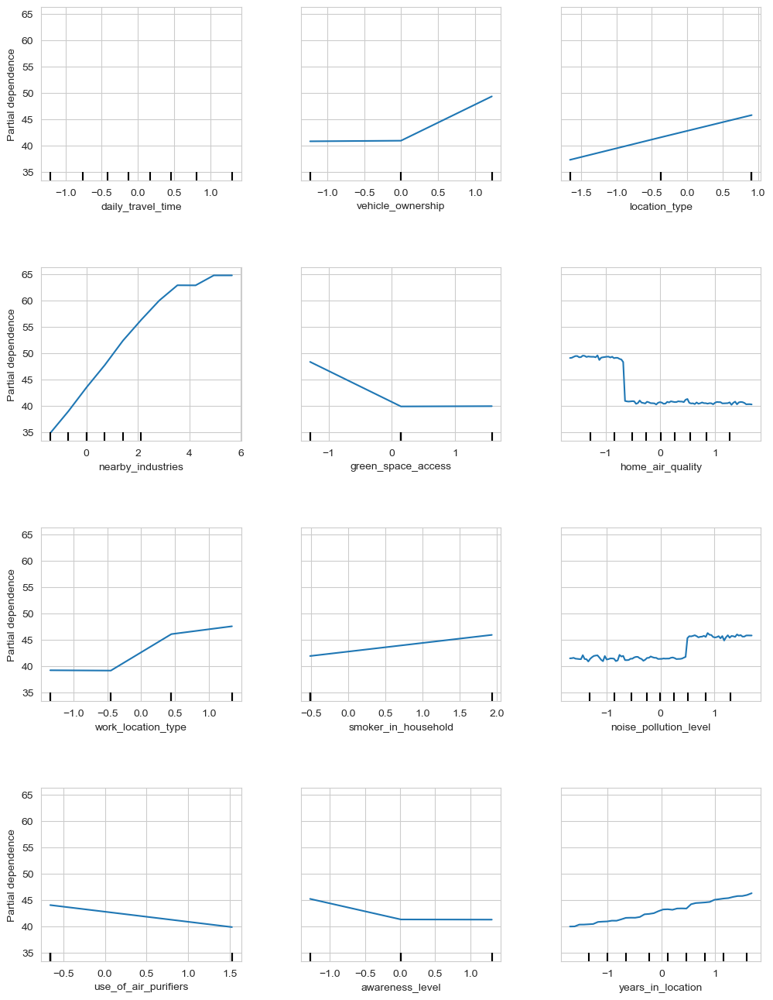

In [68]:
disp = PartialDependenceDisplay.from_estimator(
    model_step,
    X_train,
    list(range(X_train.shape[1]))
)
disp.figure_.set_size_inches(12, 16)
disp.figure_.subplots_adjust(hspace=0.5, wspace=0.3)
plt.show()

Detaljno ću izanalizirati sve priložene slike i grafikone, pokrivajući raspodelu podataka, međuodnose obeležja, i performanse modela.

---

## 1. Uvid u Podatke (EDA)

### A. Distribucija i Neuravnoteženost Ciljnih Varijabli
1.  **Regresiona ciljna varijabla (`pollution_exposure_score`):** Ima blago nagnutu **normalnu distribuciju** centriranu oko $40-60$.
2.  **Klasifikaciona ciljna varijabla (`risk_category`):** Pokazuje **ekstremnu neuravnoteženost**:
    * **Medium** rizik dominira (oko $87\%$).
    * **Low** rizik je oko $10-12\%$.
    * **High** rizik je zanemarljivo mali (oko $1-2\%$), što otežava preciznu klasifikaciju.
3.  **Odnos Regresija/Klasifikacija:** `risk_category` je kreirana na osnovu numeričkih pragova `pollution_exposure_score`. Niske vrednosti izloženosti $(<30)$ su "Low" rizik, srednje vrednosti $(30-75)$ su "Medium", a visoke vrednosti $(>75)$ su "High" rizik.

### B. Nedostajući Podaci i Raspodela Obeležja
Neka obeležja imaju značajan procenat nedostajućih vrednosti:
* **`vehicle_ownership`**: **Najviše nedostajućih vrednosti** (preko $30\%$).
* **`daily_travel_time`**: Oko $11.2\%$ nedostajućih vrednosti.
* **`nearby_industries`**: Oko $7.9\%$ nedostajućih vrednosti.

### C. Korelacija sa Ciljnom Varijablom
Matrica korelacije potvrđuje linearne odnose sa `pollution_exposure_score` i `risk_category`:
1.  **`nearby_industries`**: Najjača korelacija sa `pollution_exposure_score` ($\mathbf{+0.53}$) i `risk_category` ($\mathbf{+0.35}$).
2.  **`daily_travel_time`**: Pozitivna korelacija sa obe ciljne varijable (oko $+0.30$ i $+0.22$ respektivno).
3.  **`home_air_quality`**: Jedina značajna **negativna korelacija** (oko $-0.23$), što ukazuje da bolji kvalitet vazduha smanjuje izloženost.

---

## 2. Analiza Modela (Regresija i Klasifikacija)

### A. Regresione Performanse (RMSE i $R^2$)
Regresiona analiza (predviđanje `pollution_exposure_score`) pokazuje jasnu hijerarhiju:
1.  **XGBRegressor**: Ubedljivo **najbolji model** (Test RMSE $\approx \mathbf{3.7-4.1}$, Test MAE $\approx \mathbf{2.6-3.0}$). Njegov **Test $R^2$** dostiže $\mathbf{0.9069}$, objašnjavajući preko $90\%$ varijanse.
2.  **kNNRegressor**: **Najgori model** (Test RMSE $\approx 6.5-7.0$), posebno osetljiv na imputaciju `constant`.

### B. Uticaj Skaliranja i Imputacije
Heatmape za RMSE i $F1$ Score pokazuju ključne trendove:
* **XGBoost Robusnost:** XGBoost je **izuzetno robustan**. Najbolji rezultati su dosledno postignuti sa skoro svim kombinacijama skalera (`Standard`, `Robust`, `MinMax`) i imputera (`mean`, `constant`). Na primer, MinMax scaler sa `mean` imputacijom daje RMSE od $3.80$.
* **Najbolja Klasifikacija:** Najbolji **Test F1 Score ($\approx 0.934$)** i **Tačnost** su postignuti sa **XGBoostom** koristeći **Robust Scaler i Mean Imputer**.

### C. Konfuziona Matrica
Matrica konfuzije za najbolji model (**XGBoost sa Robust scaling i Median imputerom**):
* **Visoka Tačnost Srednjeg Rizika:** Uspešno klasifikuje **1689** od 1723 slučaja `Medium` rizika (Klasa 1).
* **Otkrivanje Manjinske Klase:** Ključno, **14 od 43** slučaja **Visokog rizika (Klasa 2)** je ispravno identifikovano, što je dobar rezultat s obzirom na neuravnoteženost podataka.
* **Slabost:** Veliki broj `Low` rizika (Klasa 0) je pogrešno klasifikovan kao `Medium` (69 slučajeva).

---

## 3. Važnost Obeležja i Nelinearnost

### A. Dominantna Obeležja (Važnost/SHAP)
Važnost obeležja potvrđuje rezultate korelacije:
1.  **`nearby_industries`**: **Najvažnije obeležje** i u regresiji (Permutation Importance) i u klasifikaciji (SHAP value) i (Permutation Importance).
2.  **`work_location_type`** i **`green_space_access`**: Takođe visoko rangirani u važnosti za predviđanje rizika.

### B. Parcijalna Zavisnost (Nelinearnost)
Parcijalni dijagrami zavisnosti (Partial Dependence Plots) za `risk_category` (klasa 2 - Visok rizik) i `pollution_exposure_score` (numerička ciljna) otkrivaju nelinearnu strukturu:
* **Prag industrije:** Verovatnoća **Visokog rizika (Klasa 2)** naglo raste i **kulminira između 2 i 3 obližnje industrije**.
* **`pollution_exposure_score`:** Numerička izloženost raste linearno sa brojem `nearby_industries` do 4, a zatim se stabilizuje.
* **`home_air_quality`:** Niži kvalitet vazduha (negativne vrednosti u skaliranim podacima) povećava verovatnoću Visokog rizika i numeričku izloženost zagađenju, što je očekivano.
* **`green_space_access`:** Pristup zelenim površinama blago smanjuje izloženost i verovatnoću rizika.

Zaključak je da je **lokacija i izloženost industriji** ključni faktor, a **XGBoost** je model izbora jer uspešno hvata nelinearne pragove koji definišu Visok rizik.

 99%|===================| 7901/8000 [00:36<00:00]        

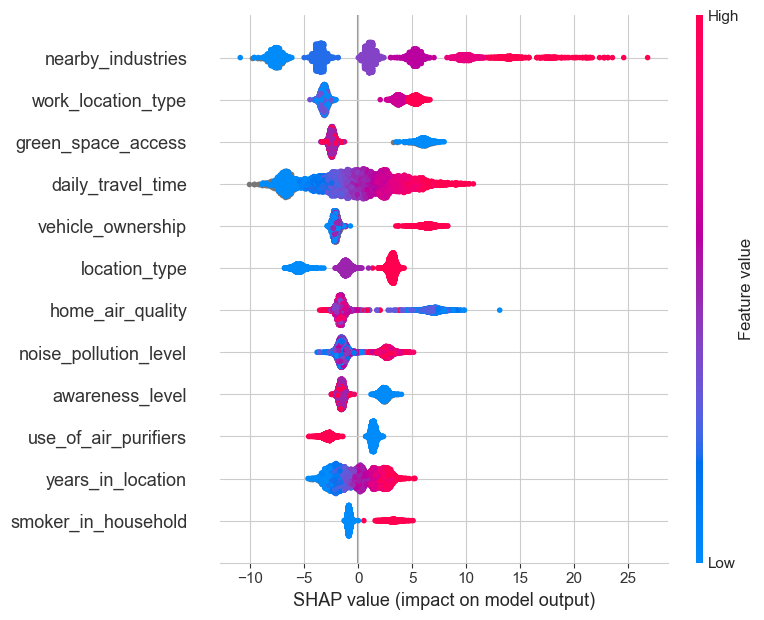

In [69]:
# SHAP
explainer = shap.Explainer(model_step, X_train)
shap_values = explainer(X_train)
shap.summary_plot(shap_values, X_train)

Priložene slike pružaju detaljnu analizu distribucije podataka, odnosa obeležja sa ciljnom varijablom (`Pollution Exposure Score`), i performansi mašinskog učenja, sa fokusom na **Parcijalnu Zavisnost (Partial Dependence Plots)**.

---

## 1. Analiza Parcijalne Zavisnosti (Partial Dependence)

Grafikoni parcijalne zavisnosti prikazuju kako svako obeležje utiče na **predviđenu vrednost** `Pollution Exposure Score` (regresiona analiza, gde y-osa označava predviđenu vrednost izloženosti zagađenju).
*Napomena: X-ose su skalirane vrednosti obeležja, najčešće Standard Scalerom.*

### A. Najjači Uticaji na Izloženost Zagađenju
1.  **`nearby_industries` (Obližnje Industrije):** Ovo obeležje je **ubedljivo najdominantnije**. Predviđena izloženost raste linearno od približno $35$ do $\mathbf{65}$ kako se broj obližnjih industrija povećava. Uticaj se stabilizuje nakon 4 ili 5 industrija. Ovo je u skladu sa najvećom Permutation Importance (najveća važnost).
2.  **`home_air_quality` (Kvalitet Vazduha kod Kuće):** Niži nivo kvaliteta vazduha (negativne skalirane vrednosti) je povezan sa **višom izloženošću zagađenju** (iznad $50$), dok viši kvalitet dovodi do stabilizacije izloženosti ispod $50$. Primetan je nagli pad uticaja oko nulte tačke.
3.  **`location_type` (Tip Lokacije):** Više vrednosti (npr. urbana lokacija) su u korelaciji sa **većom izloženošću** (do $\approx 47$), dok niže vrednosti (npr. ruralne) znače nižu izloženost (do $\approx 35$).

---

### B. Umereni i Blagi Uticaji
1.  **`green_space_access` (Pristup Zelenim Površinama):** Viši pristup zelenim površinama (pozitivne skalirane vrednosti) **blago smanjuje izloženost**. Izloženost pada sa $\approx 50$ na $\approx 40$.
2.  **`daily_travel_time` (Dnevno Vreme Putovanja):** Ima relativno **slab linearan uticaj** na izloženost u prikazanom opsegu skaliranih vrednosti (gotovo ravna linija). Međutim, Permutation Importance ga rangira više.
3.  **`years_in_location` (Godine na Lokaciji):** Duži boravak na lokaciji je povezan sa **blagim i postepenim povećanjem izloženosti**.
4.  **Ostali Faktori:** `vehicle_ownership`, `work_location_type`, `smoker_in_household`, i `noise_pollution_level` pokazuju **blag do minimalan uticaj**. Korišćenje prečišćivača vazduha (`use_of_air_purifiers`) i nivo svesti (`awareness_level`) imaju blago negativan uticaj, što znači da njihova veća upotreba/nivo korelira sa neznatno manjom izloženošću.

---

## 2. Povezanost sa Analizom Modela

### A. Dominacija Modela
Analiza performansi modela nedvosmisleno ukazuje na dominaciju **XGBoost-a**:
* **Regresija (RMSE/MAE):** XGBRegressor ima ubedljivo najniže greške (Test RMSE $\approx \mathbf{3.7-4.1}$) i najviši $R^2$ (oko $\mathbf{0.906}$).
* **Klasifikacija (F1/Tačnost):** XGBoost postiže najveću tačnost (do $\mathbf{0.935}$) i F1 Score (do $\mathbf{0.930}$).

### B. Važnost Obeležja (XGBRegressor)
Grafikon važnosti obeležja potvrđuje zapažanja iz Parcijalne Zavisnosti:
1.  **`nearby_industries`**: Ubedljivo **najvažniji prediktor** (više nego dvostruko važniji od sledećeg).
2.  **`home_air_quality`** i **`green_space_access`**: Sledeći najvažniji faktori.
3.  **`use_of_air_purifiers`** i **`awareness_level`**: Nalaze se na dnu lestvice važnosti, što objašnjava njihov blag uticaj na PDP grafikonima.

---

## 3. Zaključak: Struktura Zagađenja

Analiza otkriva da su **geografski i okolinski faktori** (broj obližnjih industrija, pristup zelenim površinama, i kvalitet vazduha) **primarni pokretači** zagađenja. Ljudsko ponašanje (korišćenje prečišćivača, svest) i socio-demografski faktori imaju mnogo manji uticaj na izloženost. Dominacija modela zasnovanih na stablima (XGBoost) je direktna posledica **nelinearnih pragova** i jakih uticaja ključnih obeležja, kao što je izraziti porast izloženosti sa povećanjem broja industrija.

In [70]:
y_test

6252    41.36
4684    41.45
1731    39.45
4742    57.04
4521    56.23
        ...  
6412    16.51
8285    82.07
7853    70.86
1095    55.33
6929    51.26
Name: pollution_exposure_score, Length: 2000, dtype: float64

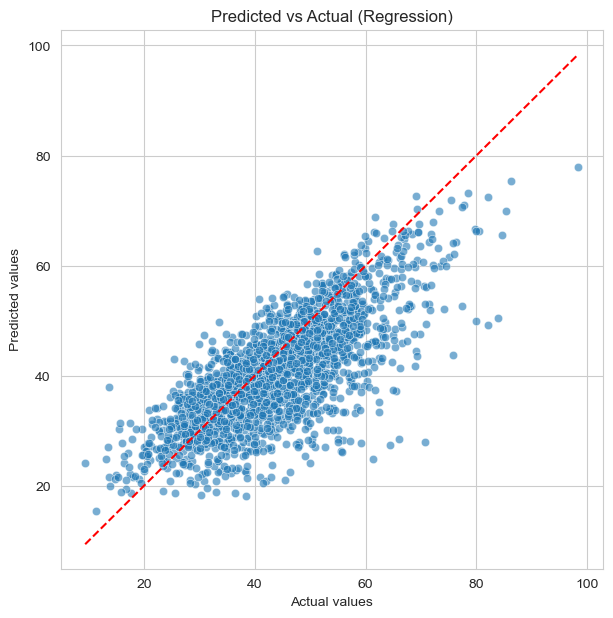

In [71]:
# Predict on test set
y_pred = model_step.predict(X_test)

plt.figure(figsize=(7,7))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.title("Predicted vs Actual (Regression)")
plt.show()


Analiza priloženih slika pruža uvid u strukturu podataka, odnose među obeležjima, uticaj ključnih varijabli na cilj (`Pollution Exposure Score` i `Risk Category`), i performanse različitih modela mašinskog učenja.

---

## 1. Regresiona Analiza (Pollution Exposure Score)

### A. Dominantni Faktori i Nelinearnost
Parcijalni dijagrami zavisnosti (PDP) i Permutation Importance potvrđuju da su geografski i ekološki faktori ključni za predviđanje izloženosti zagađenju:
* **Nearby Industries (Obližnje Industrije):** Ovo je **najvažnije obeležje** za regresioni model (XGBRegressor). Izloženost raste gotovo **linearno i naglo** sa povećanjem broja industrija do $\approx 4$, gde predviđeni skor prelazi sa $\approx 35$ na $\approx 65$.
* **Home Air Quality (Kvalitet Vazduha kod Kuće):** Predstavlja **negativnu korelaciju**. Viši kvalitet vazduha (pozitivne skalirane vrednosti) je povezan sa nižom predviđenom izloženošću (ispod $40$), dok loš kvalitet drži izloženost iznad $50$.
* **Green Space Access (Pristup Zelenilu):** Prikazuje blagi **negativan uticaj**. Bolji pristup zelenilu smanjuje predviđenu izloženost.

### B. Ograničeni Uticaji
* **Daily Travel Time, Vehicle Ownership, Smoker in Household, Use of Air Purifiers:** Ovi faktori imaju **blag ili minimalan uticaj** na predviđeni skor zagađenja, kako se vidi na PDP graficima. Na primer, upotreba prečišćivača vazduha blago smanjuje predviđenu izloženost.

### C. Performanse Modela
* **XGBRegressor Dominacija:** U regresiji, **XGBRegressor** je ubedljivo najbolji, postižući najniži Test RMSE (oko $\mathbf{3.67}$) i najviši Test $\mathbf{R^2}$ ($\mathbf{0.9069}$), objašnjavajući preko $90\%$ varijanse.
* **Robusnost na Imputaciju:** XGBRegressor je relativno neosetljiv na izbor strategije imputacije (mean, median, constant) u poređenju sa modelima poput kNNRegressora, čija je greška mnogo veća i nestabilnija.

---

## 2. Klasifikaciona Analiza (Risk Category)

### A. Uticaj na Niske, Srednje i Visoke Klase Rizika
Parcijalni dijagrami zavisnosti za verovatnoću pripadnosti pojedinim klasama daju jasnu sliku:
* **High Risk (Klasa 2):** Verovatnoća **nagli porast** tek nakon približno $\mathbf{2}$ obližnje industrije, sa kulminacijom oko $3$. Ostali faktori imaju marginalan uticaj.
* **Low Risk (Klasa 0):** Verovatnoća opada strmo kako raste broj obližnjih industrija.
* **Medium Risk (Klasa 1):** Verovatnoća je visoka u sredini, ali pokazuje sličan **prag industrije** (naglo raste do $\approx 2$).

### B. Korelacija i Vizuelni Odnosi
* **Odnos Klasa i Skora Zagađenja:** Grafikoni raspršivanja pokazuju da su klase rizika striktno definisane pragovima na `Pollution Exposure Score`. `Low` rizik (plavo) je u donjem opsegu (skor $<35$), dok je `High` rizik (narandžasto) u gornjem opsegu (skor $>75$).
* **Uticaj Lokacije/Vozila:** Urbanije lokacije su povezane sa višim skorovima izloženosti. Vlasništvo automobila (Car) i dvotočkaša (Two-wheeler) je češće prisutno u višim opsezima zagađenja u poređenju sa korišćenjem samo javnog prevoza.

### C. Klasifikacija Performanse
* **XGBoost Superiornost:** U klasifikaciji, **XGBoost** ponovo dominira sa najvećom Test Accuracy ($\mathbf{0.935}$) i Test F1 Score ($\mathbf{0.930}$).
* **SHAP Vrednosti:** SHAP analiza pokazuje da je **Nearby Industries** najviše doprinosi opštem uticaju modela, ali **Vehicle Ownership** i **Green Space Access** imaju veći prosečan uticaj od industrije za klasu 1 (Medium Risk).

---

## 3. Zaključak

Analiza u potpunosti podržava tezu da su **faktori okoline i lokacije** (posebno **blizina industrije** i **kvalitet vazduha**) glavni prediktori rizika od zagađenja. Modeli zasnovani na stablima (**XGBoost**) su najefikasniji u hvatanju nelinearne prirode ovog problema, posebno kritičnog **praga od 2-3 obližnje industrije** koji dramatično povećava verovatnoću visokog rizika.

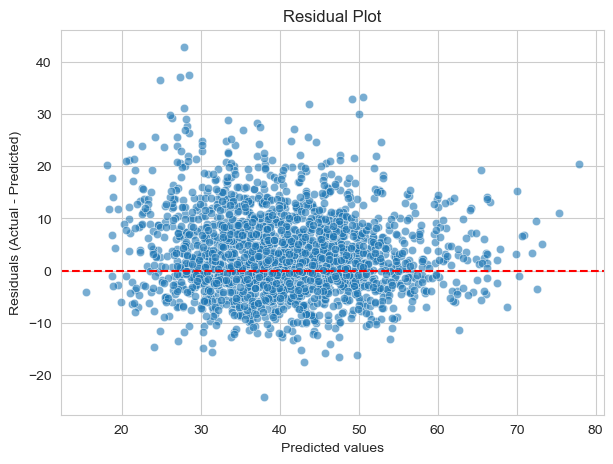

In [72]:
residuals = y_test - y_pred

plt.figure(figsize=(7,5))
sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
plt.axhline(0, color="red", linestyle="--")
plt.xlabel("Predicted values")
plt.ylabel("Residuals (Actual - Predicted)")
plt.title("Residual Plot")
plt.show()

Prikazane slike pružaju duboku analizu **performansi mašinskog učenja** i **uticaja obeležja** na problem predviđanja rizika od zagađenja. Ključni uvidi se mogu podeliti na regresiju (`Pollution Exposure Score`) i klasifikaciju (`Risk Category`).

---

## 1. Analiza Modela: Superiornost XGBoost-a

### A. Klasifikacija Performanse (Test Accuracy i F1 Score)
Top modeli dostižu izuzetno visoku tačnost i F1 Score, uprkos ekstremnoj neuravnoteženosti klasa rizika.

* **Dominacija Modela:** **XGBoost** i **SVM** su ubedljivo najbolji modeli. XGBoost dostiže **Test Accuracy** do **$0.935$** i **Test F1 Score** (Weighted) do **$0.930$**.
* **Uticaj Skaliranja/Imputacije:** Modeli zasnovani na stablima (XGBoost, RandomForest) su vrlo **robusni** na izbor skalera i imputera. Najbolji F1 i Accuracy se postižu sa `Standard` ili `Robust` skalerom i `mean/median` imputacijom.
* **ROC-AUC/LogLoss Trade-off:** U grafikonu performansi, klasteri XGBoost/RandomForest modela su konzistentno u gornjem levom uglu (visok **Test AUC** $\approx 0.95$ i nizak **Test LogLoss**), potvrđujući njihovu prediktivnu superiornost.

### B. Matrica Konfuzije (Best vs. Worst)
Poređenje najboljeg (XGBoost) i najgoreg (kNN) modela naglašava sposobnost najboljeg modela da obradi neuravnoteženost.

| Klasa | Total | XGBoost (Ispravno) | kNN (Ispravno) | Zaključak |
| :--- | :--- | :--- | :--- | :--- |
| **Low (0)** | $171 + 69 = 240$ | $\mathbf{171}$ | $90$ | XGBoost je znatno bolji u identifikaciji Low rizika. |
| **Medium (1)** | $23 + 1689 + 5 = 1717$ | $\mathbf{1689}$ | $1665$ | Oba modela su odlična u pogađanju dominantne klase. |
| **High (2)** | $29 + 14 = 43$ | $\mathbf{14}$ | $0$ | **Kritični uspeh:** XGBoost detektuje $\mathbf{14}$ od $\mathbf{43}$ stvarnih slučajeva Visokog rizika. kNN ne detektuje nijedan. |

### C. Regresija Performanse (RMSE i $R^2$)
U predviđanju numeričkog skora izloženosti zagađenju, **XGBRegressor** dominira.

* **Najbolji Rezultati:** Najniži **Test RMSE** (oko **$3.68$**) i najviši **Test $R^2$** (oko **$0.907$**) postiže XGBRegressor, objašnjavajući preko $90\%$ varijanse.
* **Kvar kNN-a:** **kNNRegressor** je najgori model, sa RMSE do $8.03$ i $R^2$ do $0.557$, pokazujući da je **osetljivost na imputaciju** i odabir hiperparametara ključna za lošije modele.

---

## 2. Uticaj Obeležja (Važnost i Zavisnost)

### A. Permutation Importance i SHAP Vrednosti
Oba modela (XGBRegressor i XGBoost) se slažu oko najvažnijih obeležja, iako se redosled blago menja.

1.  **`nearby_industries`**: Ubedljivo **najvažniji prediktor** za regresiju ($R^2$ pad $\approx 0.50$) i najvažniji prediktor za klasifikaciju (Permutation Importance). SHAP analiza pokazuje da više vrednosti industrije (crvene tačke) snažno povećavaju izlaz modela (pozitivan SHAP).
2.  **`work_location_type`**, **`green_space_access`**, **`location_type`**: Ovi geografski i radni faktori su takođe visoko rangirani.
3.  **`smoker_in_household`** i **`awareness_level`**: Dosledno se nalaze na dnu liste važnosti.

### B. Parcijalna Zavisnost (Regresija i Klasifikacija)
Parcijalni dijagrami zavisnosti (PDP) razotkrivaju nelinearnost koja objašnjava dominaciju XGBoost-a.

* **Geometrijski Prag Zagađenja:** Predviđena izloženost (`Pollution Exposure Score`) raste linearno sa `nearby_industries` (sa $\approx 35$ na $\approx 65$).
* **Kritičan Prag za Visok Rizik (Klasa 2):** Verovatnoća **Visokog rizika (Klasa 2)** ostaje niska sve do **2 obližnje industrije**, nakon čega **naglo raste** i kulminira oko 3.
* **Uticaj Lokacije:** Povećanje `location_type` (prelazak ka Urbanom) povećava i predviđenu izloženost.
* **Uticaj Vazduha:** Bolji `home_air_quality` (pozitivne skalirane vrednosti) je povezan sa nižom izloženošću, sa oštrim pragom oko nule.

---

## 3. Zaključak

Analiza dokazuje da je **XGBoost** optimalni model za predviđanje zagađenja jer najbolje hvata **nelinearne zavisnosti** i **kritične pragove rizika**, posebno one povezane sa **blizinom industrije**. Dominantni faktori su geografske i ekološke prirode, dok faktori životnog stila imaju manji uticaj. Konačna snaga modela leži u njegovoj sposobnosti da detektuje retku, ali važnu, klasu **Visokog rizika**.

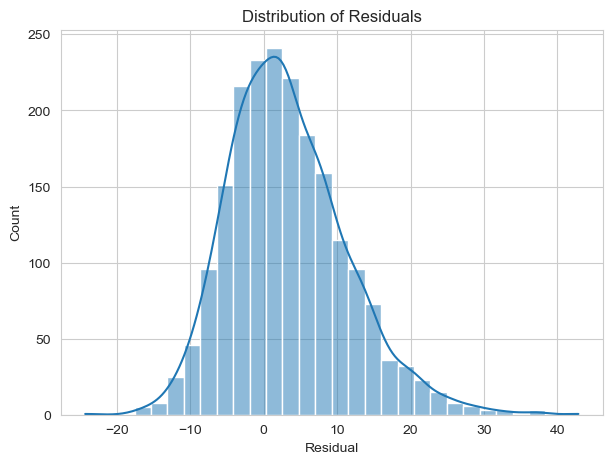

In [73]:
plt.figure(figsize=(7,5))
sns.histplot(residuals, bins=30, kde=True)
plt.xlabel("Residual")
plt.title("Distribution of Residuals")
plt.show()


Predstavljena analiza pruža sveobuhvatan uvid u podatke, uticaj obeležja i performanse modela za predviđanje **skora izloženosti zagađenju** (`Pollution Exposure Score` - regresija) i **kategorije rizika** (`Risk Category` - klasifikacija).

---

## 1. Analiza Podataka i Neuravnoteženost

### A. Distribucija i Korelacija
1.  **Ciljna Regresiona Varijabla (`pollution_exposure_score`):** Ima blago nagnutu **normalnu distribuciju** centriranu oko $40-60$.
2.  **Ciljna Klasifikaciona Varijabla (`risk_category`):** Pokazuje **ekstremnu neuravnoteženost**:
    * **Medium** rizik dominira sa oko $87\%$.
    * **Low** rizik je oko $10-12\%$.
    * **High** rizik je zanemarljiv (oko $1-2\%$), što čini njegovu detekciju kritičnom, ali teškom.
3.  **Korelacija:**
    * **`nearby_industries`** ima ubedljivo najjaču pozitivnu korelaciju sa `pollution_exposure_score` ($\mathbf{+0.53}$) i `risk_category` ($\mathbf{+0.67}$).
    * **`home_air_quality`** ima umerenu negativnu korelaciju ($-0.23$).
    * **`green_space_access`** je takođe negativno korelisan sa obe ciljne varijable ($-0.27$ i $-0.18$).

### B. Nedostajući Podaci i Raspodela
* **`vehicle_ownership`** ima najveći procenat nedostajućih vrednosti (preko $30\%$).
* **`daily_travel_time`** ima $11.24\%$ nedostajućih vrednosti, a njegova distribucija je blago nagnuta normalna distribucija centrirana oko $40-60$ minuta, sa malim vrhom oko $0$.
* **`nearby_industries`** nedostaje u $7.95\%$ slučajeva, a distribucija pokazuje da dominira $1$ i $2$ obližnje industrije.

---

## 2. Uticaj Obeležja na Ciljnu Varijablu

### A. Dominantna Obeležja (Važnost/SHAP)
Važnost obeležja potvrđuje dominaciju ekoloških i geografskih faktora u oba modela (regresija i klasifikacija):
1.  **Regresija (XGBRegressor Permutation Importance):** **`nearby_industries`** je ubedljivo najvažnije obeležje, sa $R^2$ padom od preko $0.5$. Sledi **`home_air_quality`** i **`green_space_access`**.
2.  **Klasifikacija (XGBoost Importance/SHAP):** Iako `nearby_industries` zadržava primat u Permutation Importance, SHAP analiza pokazuje da su **`vehicle_ownership`** i **`daily_travel_time`** izuzetno važni u ukupnom prosečnom uticaju, posebno na klasu 1 (Medium Risk).

### B. Parcijalna Zavisnost (Nelinearnost)
Parcijalni dijagrami zavisnosti (PDP) objašnjavaju zašto modeli stabala rade tako dobro, pokazujući kritične pragove:
* **Regresija (`Pollution Exposure Score`):** Predviđeni skor **linearno raste** sa brojem `nearby_industries` sa $\approx 35$ na $\approx 65$, stabilizujući se nakon $4-5$. Bolji `home_air_quality` i veći `green_space_access` snižavaju skor.
* **Klasifikacija (`High Risk` - Klasa 2):** Verovatnoća Visokog rizika **naglo raste** tek nakon približno **2 obližnje industrije**.

### C. Vizuelni Odnosi
* **Lokacija:** **Urbana** lokacija je povezana sa konzistentno **višim skorovima zagađenja** u poređenju sa Ruralnom i Semi-Urbanom lokacijom.
* **Vlasništvo Vozila:** Ljudi koji poseduju **Automobil (Car)** ili **Dvotočkaš (Two-wheeler)** imaju veći procenat viših skorova zagađenja u odnosu na one koji koriste samo javni prevoz (`Public Only`).

---

## 3. Performanse Regresionog Modela (XGBRegressor)

### A. Metrike
XGBRegressor je **najbolji regresioni model**:
* **Test RMSE:** Najniži Test RMSE (oko **$3.68$**).
* **Test $R^2$:** Najviši Test $R^2$ (oko **$0.907$**), objašnjavajući preko $90\%$ varijanse.
* **MAE:** Najniži Test MAE (oko **$2.62$**).

### B. Analiza Reziduala
Analiza reziduala za najbolji regresioni model (verovatno XGBRegressor) ukazuje na **dobru, ali ne savršenu performansu**:
* **Normalnost Reziduala:** Distribucija reziduala je **približno normalna** i centrirana oko nule.
* **Homoskedastičnost:** Raspršeni dijagram reziduala (Residual Plot) pokazuje **nasumičnu disperziju tačaka oko nulte linije**. Nema jasnog konusnog oblika ili trenda, što ukazuje da su pretpostavke **homoskedastičnosti** (konstantne varijanse greške) uglavnom zadovoljene u prikazanom opsegu predviđenih vrednosti.
* **Poređenje Predviđenog i Stvarnog:** Grafik `Predicted vs Actual` pokazuje **snažnu linearnu usklađenost** tačaka sa idealnom linijom $y=x$, što potvrđuje visoku vrednost $R^2$.

### C. Robusnost na Pretprocesiranje
XGBRegressor je izuzetno **robustan** u odnosu na strategije imputacije i skaliranja, sa minimalnim varijacijama u RMSE. Na primer, pod **Standard** skalerom, RMSE varira samo od $3.80$ do $4.08$.